<div class="alert alert-block alert-info">
<a class="anchor" id="one-bullet"> 
    
# MACHINE LEARNING @DSAA, DS
###### António Cymbron (R20181059), Gonçalo Silva (R20181085), Maria João M. Marques (R20181119), Pedro Sequeira (R20181097)
</a>    
</div>

# 1. Import Packages:

In [1]:
import datetime
import math
from math import ceil
import pandas as pd
import numpy as np
from numpy import arange
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as smodels

#!pip install imbalanced-learn
from imblearn.over_sampling import SMOTE

from sklearn.feature_selection import RFE, SequentialFeatureSelector, mutual_info_classif, SelectFromModel, SelectKBest
from sklearn.model_selection import RepeatedKFold, RepeatedStratifiedKFold

# Embedded methods:
from sklearn.linear_model import LassoCV, RidgeCV, LogisticRegression, PassiveAggressiveClassifier

from sklearn.tree import DecisionTreeClassifier, export_graphviz
#!pip install pydotplus
import graphviz
import pydotplus
from sklearn.neighbors import KNeighborsClassifier, NeighborhoodComponentsAnalysis, NearestCentroid
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, StackingClassifier, BaggingClassifier, VotingClassifier, GradientBoostingClassifier, IsolationForest
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

# For data partition:
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV

from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_auc_score, make_scorer, roc_curve, auc, accuracy_score

import warnings
warnings.filterwarnings("ignore")

# for better resolution plots
%config InlineBackend.figure_format = "retina"

# for visualizations
from matplotlib.legend_handler import HandlerLine2D

%matplotlib inline

# 2. Import TechScape Datasets:

In [2]:
train = pd.read_csv('Data/train.csv')
test = pd.read_csv('Data/test.csv')

# 3. Exploratory Analysis:

In [3]:
print('Test Dataset:','\nRows:', train.shape[0], '\nColumns:', train.shape[1])
print('\nTrain Dataset:','\nRows:', test.shape[0], '\nColumns:', test.shape[1])

Test Dataset: 
Rows: 9999 
Columns: 17

Train Dataset: 
Rows: 2300 
Columns: 16


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Access_ID                   9999 non-null   int64  
 1   Date                        9999 non-null   object 
 2   AccountMng_Pages            9999 non-null   int64  
 3   AccountMng_Duration         9999 non-null   float64
 4   FAQ_Pages                   9999 non-null   int64  
 5   FAQ_Duration                9999 non-null   float64
 6   Product_Pages               9999 non-null   int64  
 7   Product_Duration            9999 non-null   float64
 8   GoogleAnalytics_BounceRate  9999 non-null   float64
 9   GoogleAnalytics_ExitRate    9999 non-null   float64
 10  GoogleAnalytics_PageValue   9999 non-null   float64
 11  OS                          9999 non-null   object 
 12  Browser                     9999 non-null   int64  
 13  Country                     9999 

In [5]:
train["Access_ID"].nunique()

9999

In [6]:
train.set_index("Access_ID", inplace = True)
train.head()

,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy
Access_ID,,,,,,,,,,,,,,,,
102863333,21-Mar-20,0,0.0,0,0.0,3,64.0000,0.0000,0.0667,0.0000,MacOSX,2,Portugal,1,Returner,0
103117814,20-May-20,0,0.0,0,0.0,23,684.5000,0.0217,0.0449,0.0000,Windows,2,France,6,Returner,0
103201891,4-Dec-20,0,0.0,0,0.0,8,95.0000,0.0250,0.0583,0.0000,Windows,4,Italy,1,Returner,0
103226087,22-Dec-20,0,0.0,0,0.0,9,608.7500,0.0000,0.0250,42.4225,Windows,2,United Kingdom,2,Returner,1
103234445,24-Nov-20,0,0.0,2,386.0,36,1609.9397,0.0000,0.0093,12.5033,Windows,2,Spain,3,Returner,1


In [7]:
test.set_index("Access_ID", inplace = True)
test.head()

,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor
Access_ID,,,,,,,,,,,,,,,
798519314,24-Aug-20,0,0.00,0,0.0,86,5332.5478,0.0139,0.0654,0.0000,Windows,2,Brazil,1,Returner
798663101,25-May-20,2,37.50,0,0.0,55,1420.4725,0.0012,0.0058,0.0000,Android,1,Spain,4,Returner
798663221,2-Nov-20,0,0.00,0,0.0,36,788.5000,0.0000,0.0250,0.0000,Windows,6,Spain,3,Returner
798760918,14-May-20,0,0.00,0,0.0,2,689.0000,0.0000,0.1000,0.0000,Windows,2,Spain,2,New_Access
798856982,5-Nov-20,12,225.25,1,0.0,129,3367.0413,0.0014,0.0185,1.0353,Windows,4,Portugal,10,Returner


In [8]:
train.duplicated().sum()

14

In [9]:
train[train.duplicated(keep=False)]
# with 'keep=False', we get all the 28 duplicated observations, instead of only the 14 that are repetitions of the above
# this 28 duplicated observations will not be deleted from our dataset, since there is a probability that they are not an
# error and there might be different accesses that produced the same data

,Date,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,OS,Browser,Country,Type_of_Traffic,Type_of_Visitor,Buy
Access_ID,,,,,,,,,,,,,,,,
137020743,19-Dec-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,MacOSX,2,Spain,1,Returner,0
148990895,19-Mar-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Windows,2,Brazil,1,Returner,0
159470688,13-May-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Windows,2,Portugal,3,Returner,0
164560726,23-Mar-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Windows,2,Portugal,1,Returner,0
170394505,26-Dec-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Android,1,Portugal,1,Returner,0
203552671,25-May-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Android,1,Portugal,3,Returner,0
204794626,20-May-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Windows,2,Portugal,1,Returner,0
225711288,4-May-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Windows,2,Portugal,13,Returner,0
225769030,13-May-20,0,0.0,0,0.0,1,0.0,0.2,0.2,0.0,Windows,2,Portugal,3,Returner,0


In [10]:
train.describe().T #numerical variables

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,9999.0,2.324232,3.340676,0.0,0.0000,1.0000,4.00000,27.0000
AccountMng_Duration,9999.0,81.205854,179.715545,0.0,0.0000,7.5000,92.20835,3398.7500
FAQ_Pages,9999.0,0.508051,1.279390,0.0,0.0000,0.0000,0.00000,24.0000
FAQ_Duration,9999.0,34.559101,139.796989,0.0,0.0000,0.0000,0.00000,2549.3750
Product_Pages,9999.0,31.685869,44.550277,0.0,7.0000,18.0000,38.00000,705.0000
Product_Duration,9999.0,1199.769430,1958.276304,0.0,183.5625,599.0000,1470.27080,63973.5222
GoogleAnalytics_BounceRate,9999.0,0.022305,0.048776,0.0,0.0000,0.0032,0.01680,0.2000
GoogleAnalytics_ExitRate,9999.0,0.043181,0.048845,0.0,0.0143,0.0251,0.05000,0.2000
GoogleAnalytics_PageValue,9999.0,5.963120,18.753626,0.0,0.0000,0.0000,0.00000,361.7637
Browser,9999.0,2.352535,1.715698,1.0,2.0000,2.0000,2.00000,13.0000


- Outliers: Apparently all variables except GoogleAnalytics_BounceRate, GoogleAnalytics_ExitRate, Browser, and Type_of_Traffic may present outliers.
- Possible Transformations: Browser and Type_of_Traffic datatypes to String (in order to be categorical variables).

In [11]:
train["Browser"] = train["Browser"].apply(str)
test["Browser"] = test["Browser"].apply(str)

train["Type_of_Traffic"] = train["Type_of_Traffic"].apply(str)
test["Type_of_Traffic"] = test["Type_of_Traffic"].apply(str)

In [12]:
train.describe(include = "object").T #categorical variables

,count,unique,top,freq
Date,9999,305,25-May-20,120
OS,9999,8,Windows,5361
Browser,9999,12,2,6484
Country,9999,9,Portugal,3870
Type_of_Traffic,9999,15,2,3150
Type_of_Visitor,9999,3,Returner,8534


- Transform Date datatype to datetime

In [13]:
train['Date'] = pd.to_datetime(train['Date'])
test['Date'] = pd.to_datetime(test['Date'])

In [14]:
train['Date'].describe().T

count                    9999
unique                    305
top       2020-05-25 00:00:00
freq                      120
first     2020-02-01 00:00:00
last      2020-12-31 00:00:00
Name: Date, dtype: object

## 3.1. Missing Values

In [15]:
train.isna().sum()

Date                          0
AccountMng_Pages              0
AccountMng_Duration           0
FAQ_Pages                     0
FAQ_Duration                  0
Product_Pages                 0
Product_Duration              0
GoogleAnalytics_BounceRate    0
GoogleAnalytics_ExitRate      0
GoogleAnalytics_PageValue     0
OS                            0
Browser                       0
Country                       0
Type_of_Traffic               0
Type_of_Visitor               0
Buy                           0
dtype: int64

In [16]:
train.replace(["","?","-"," ","null", "NK"], np.nan, inplace = True)
train.isna().sum()

Date                          0
AccountMng_Pages              0
AccountMng_Duration           0
FAQ_Pages                     0
FAQ_Duration                  0
Product_Pages                 0
Product_Duration              0
GoogleAnalytics_BounceRate    0
GoogleAnalytics_ExitRate      0
GoogleAnalytics_PageValue     0
OS                            0
Browser                       0
Country                       0
Type_of_Traffic               0
Type_of_Visitor               0
Buy                           0
dtype: int64

## 3.2. Balanced Dataset

In [17]:
train['Buy'].value_counts()
# our dataset is unbalanced

0    8447
1    1552
Name: Buy, dtype: int64

## 3.3. Data Visualization

In [18]:
# Define metric and non-metric features.
train_non_metric_features = ["Browser", "OS", "Type_of_Visitor", "Country", "Type_of_Traffic","Buy"]
train_metric_features = train.columns.drop(train_non_metric_features).to_list() + ["Buy"]
train_metric_features.remove("Date")

### 3.3.1. _Graphs for Numerial Variables_

- _Graph 1: Numeric Variables' Histograms_

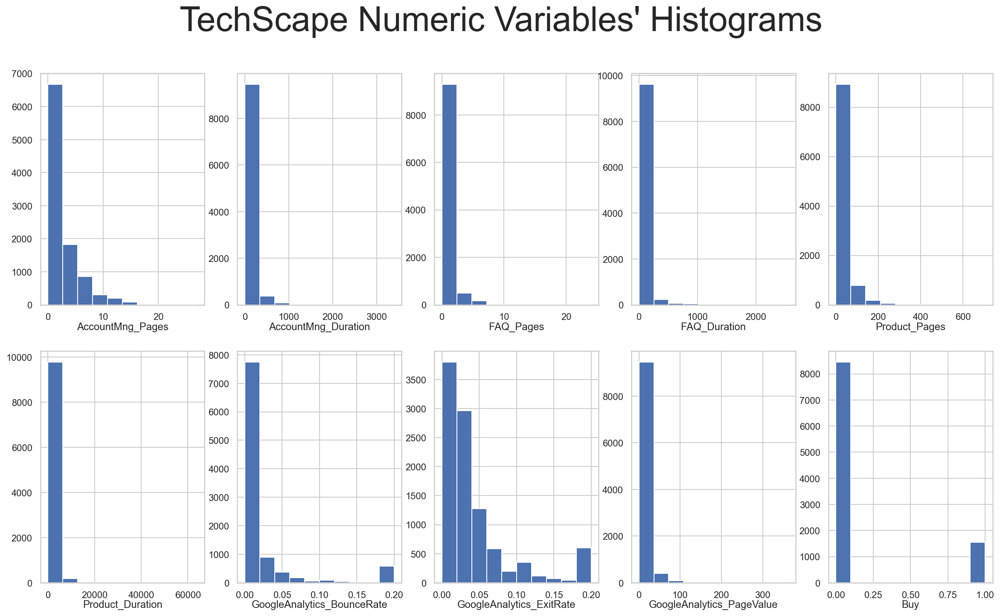

In [19]:
# All Numeric Variables' Histograms in one figure
sns.set(style="whitegrid")

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(train_metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), train_metric_features): # Notice the zip() function and flatten() method
    ax.hist(train[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "TechScape Numeric Variables' Histograms"

plt.suptitle(title, size = 40)

plt.savefig(r'Figures\numeric_variables_histograms.png', dpi=200)
plt.show()

 - Skewness: All variables present a positive skew. We may consider later to apply log transformations, for instance.
 - Outliers: We can't properly identify them, let's build other plots.

- _Graph 2: Numeric Variables' BoxPlots_

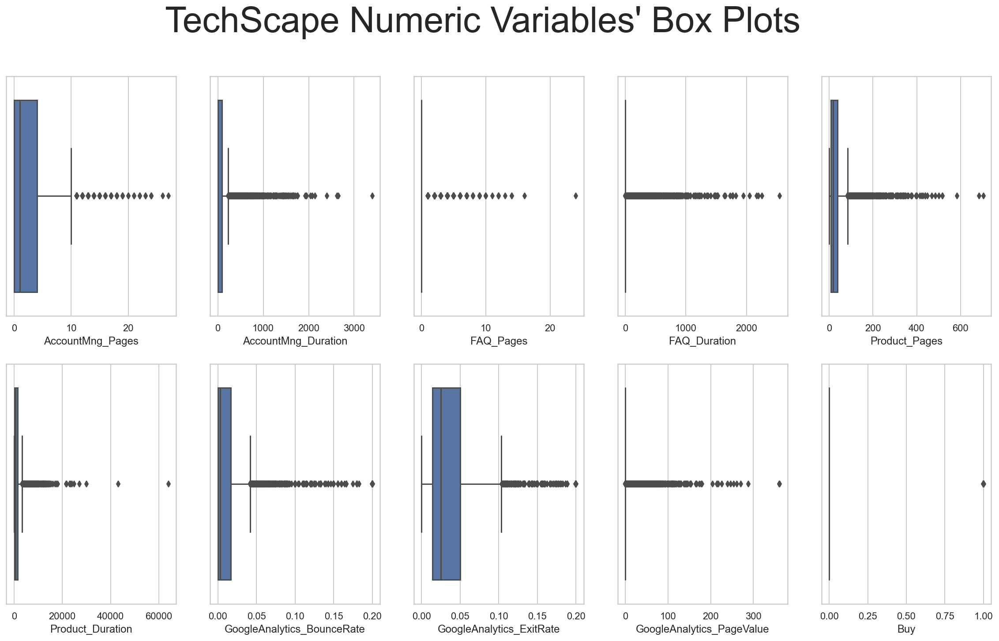

In [20]:
# All Numeric Variables' Box Plots in one figure
sns.set(style="whitegrid")

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(train_metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), train_metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=train[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "TechScape Numeric Variables' Box Plots"

plt.suptitle(title, size = 40)

plt.savefig(r'Figures\numeric_variables_box_plots.png', dpi=200)
plt.show()

 - Outliers: As predicted, almost all variables appear to present outliers.

- _Graph 3: Pairwise Relationship of Numerical Variables by Buy_

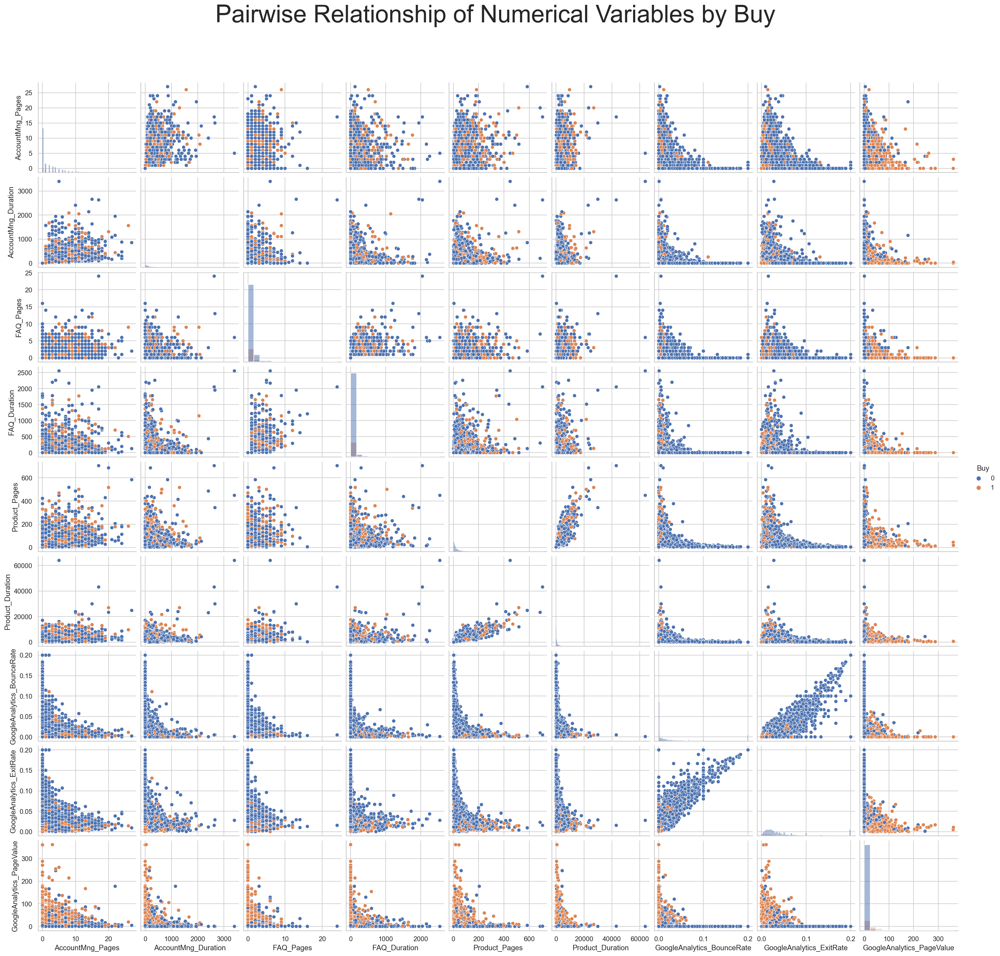

In [21]:
# data to plot
sns.set(style="whitegrid")

# Setting pairgrid
g = sns.pairplot(train[train_metric_features], hue="Buy", diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.9)
plt.suptitle("Pairwise Relationship of Numerical Variables by Buy", size=40)
plt.savefig(r'Figures\pairwise_relationship_of_numerical_variables_by_buy.png', dpi=200)
plt.show()

 - Relations between variables: The most noticeable is the one between Product_Duration and Product_Pages, and the one between GoogleAnalytics_ExitRate and GoogleAnalytics_BounceRate.
 - Outliers: Here, we can also see some bivariate outliers.

- _Graph 4: Numeric Variables' Box Plots by Buy_

In [22]:
sns.set(style="whitegrid")

def box_plot_numerical(df, features, title):
    # Prepare figure
    fig, axes = plt.subplots(1, len(features), figsize=(20, 4), constrained_layout=True)

    # Plot data
    for ax, f in zip(axes.flatten(), features):
        sns.boxplot(y=f, data=df, ax=ax, x='Buy')
        ax.set_title(f)
        ax.set_ylabel('') 
        
    # Layout
    plt.suptitle(title, size=40)
    plt.savefig(r'Figures\numeric_variables_boxplots2.png', dpi=200)
    plt.show()

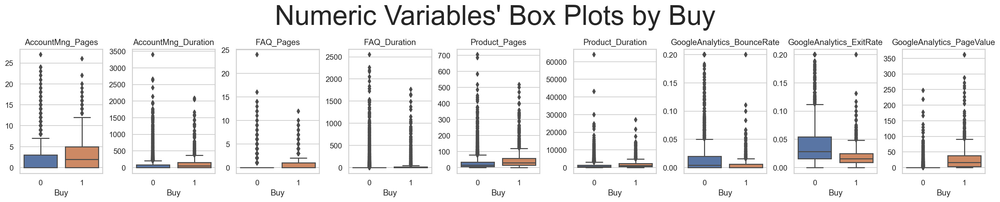

In [23]:
title = "Numeric Variables' Box Plots by Buy"

# features to plot
plot_features = train_metric_features
plot_features.remove("Buy")

box_plot_numerical(train, plot_features, title)

 - Outliers: Once again, the outliers are noticeable even when observing taking the dependent variable into account.
 - Accesses that end with a purchase (Buy = 1), view more Account, FAQ and Product pages, on average. But have lower Google Analytics statistics, except Page Value, on average.

### 3.3.2. _Graphs for Categorical Variables_

- _Graph 5: Categorical Variables' Absolute Frequencies by Buy_

In [24]:
sns.set(style="whitegrid")

def categorical_plot(df, features, title):
    # figure and axes
    fig, axes = plt.subplots(2, ceil(len(features)/2), figsize=(20,10))

    # plot data
    for ax, x in zip(axes.flatten(), features):
        if x == "Buy":
            sns.countplot(x=x, hue="Buy", order=[0, 1], data=df, ax=ax)
        else:
            sns.countplot(x=x, hue="Buy", data=df, ax=ax)
        ax.get_legend().remove()

    # Set legend (Deceased)
    handles, _ = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, ["Not-Buy", "Buy"], loc=(0.07,0.91), title="Buy", title_fontsize=12)

    plt.subplots_adjust(wspace=0.25)
    plt.suptitle(title, y=0.95, size=40)
    plt.savefig(r'Figures\categorical_variables_abs_frequencies.png', dpi=200)
    plt.show()

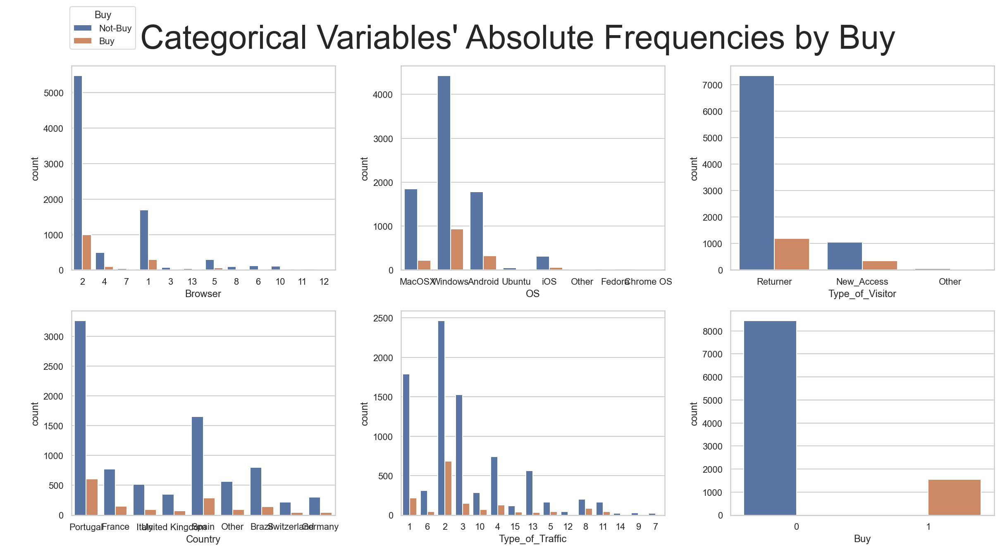

In [25]:
title = "Categorical Variables' Absolute Frequencies by Buy"
# data to plot
plot_df = train[train_non_metric_features]
plot_features = train_non_metric_features

categorical_plot(plot_df, plot_features, title)

 - Higher Cardinalities: Browser, Type_of_Traffic

# 4. Feature Engineering:

## 4.1. Creating New Variables:

 - Date: Let's keep the month of each date.
 - Weekend: Let's create a variable that is 1 if the acess was during a weekend, and 0 otherwise.
 - Average Time by Type of Page
  - Given that we have many 0 values, in the 3 'X_Pages' variables, by splitting the 'X_Duration' columns by the respective 'X_Pages' columns, this will result in a huge amount of NaN values in the new columns that we would create, making these new variables irrelevant, since they won't add much value.
 - Total Duration spent by Access
 - Total Number of Pages Visited by Access
 - Categoric Variables: Label Encoding & One Hot Encoding
 - Log: Due to the skewness of the distribution of the numerical (continuous) variables

In [26]:
train['Month'] = train['Date'].dt.month
test['Month'] = test['Date'].dt.month

In [27]:
train["WeekDay"] = train["Date"].apply(lambda x: x.weekday())
train["Weekend"] = train["WeekDay"].apply(lambda x: 1 if x >= 5 else 0)
train.drop(['WeekDay'], axis=1, inplace = True)

test['WeekDay'] = test["Date"].apply(lambda x: x.weekday())
test["Weekend"] = test["WeekDay"].apply(lambda x: 1 if x >= 5 else 0)
test.drop(['WeekDay'], axis=1, inplace = True)

In [28]:
train.drop(['Date'], axis=1, inplace = True)
test.drop(['Date'], axis=1, inplace = True)

In [29]:
train['Total_Duration'] = train["AccountMng_Duration"] + train["FAQ_Duration"] + train["Product_Duration"]
test['Total_Duration'] = test["AccountMng_Duration"] + test["FAQ_Duration"] + test["Product_Duration"]

In [30]:
train['Total_Pages'] = train["AccountMng_Pages"] + train["FAQ_Pages"] + train["Product_Pages"]
test['Total_Pages'] = test["AccountMng_Pages"] + test["FAQ_Pages"] + test["Product_Pages"]

In [31]:
train['lg10_AccountMng_Duration'] = train['AccountMng_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)
test['lg10_AccountMng_Duration'] = test['AccountMng_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)

train['lg10_FAQ_Duration'] = train['FAQ_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)
test['lg10_FAQ_Duration'] = test['FAQ_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)

train['lg10_Product_Duration'] = train['Product_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)
test['lg10_Product_Duration'] = test['Product_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)

train['lg10_GoogleAnalytics_BounceRate'] = train['GoogleAnalytics_BounceRate'].map(lambda x: math.log10(x) if x != 0 else 0)
test['lg10_GoogleAnalytics_BounceRate'] = test['GoogleAnalytics_BounceRate'].map(lambda x: math.log10(x) if x != 0 else 0)

train['lg10_GoogleAnalytics_ExitRate'] = train['GoogleAnalytics_ExitRate'].map(lambda x: math.log10(x) if x != 0 else 0)
test['lg10_GoogleAnalytics_ExitRate'] = test['GoogleAnalytics_ExitRate'].map(lambda x: math.log10(x) if x != 0 else 0)

train['lg10_GoogleAnalytics_PageValue'] = train['GoogleAnalytics_PageValue'].map(lambda x: math.log10(x) if x != 0 else 0)
test['lg10_GoogleAnalytics_PageValue'] = test['GoogleAnalytics_PageValue'].map(lambda x: math.log10(x) if x != 0 else 0)

train['lg10_Total_Duration'] = train['Total_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)
test['lg10_Total_Duration'] = test['Total_Duration'].map(lambda x: math.log10(x) if x != 0 else 0)

### 4.1.2. One Hot Encoding: 
 - Categorical --> OS; Browser; Country; Type_of_Traffic; Type_of_Visitor

In [32]:
train["Country"].value_counts()

Portugal          3870
Spain             1945
Brazil             947
France             923
Other              659
Italy              613
United Kingdom     429
Germany            350
Switzerland        263
Name: Country, dtype: int64

In [33]:
train["OS"].value_counts()

Windows      5361
Android      2104
MacOSX       2065
iOS           378
Ubuntu         68
Chrome OS      15
Other           5
Fedora          3
Name: OS, dtype: int64

In [34]:
train.loc[(train['OS'] == 'iOS') |( train['OS'] == 'Ubuntu') | (train['OS'] == 'Fedora')
                    | (train['OS'] == 'Chrome OS') | (train['OS'] == 'Other'), 'new_OS'] = 'Other' 
train.loc[train['OS'] == 'Windows', 'new_OS'] = 'Windows'
train.loc[train['OS'] == 'Android', 'new_OS'] = 'Android'
train.loc[train['OS'] == 'MacOSX', 'new_OS'] = 'MacOSX'

test.loc[(test['OS'] == 'iOS') |( test['OS'] == 'Ubuntu') | (test['OS'] == 'Fedora')
                    | (test['OS'] == 'Chrome OS') | (test['OS'] == 'Other'), 'new_OS'] = 'Other' 
test.loc[test['OS'] == 'Windows', 'new_OS'] = 'Windows'
test.loc[test['OS'] == 'Android', 'new_OS'] = 'Android'
test.loc[test['OS'] == 'MacOSX', 'new_OS'] = 'MacOSX'

In [35]:
train["Browser"].value_counts()

2     6484
1     1990
4      597
5      362
6      138
10     130
8      113
3       81
13      52
7       41
12       8
11       3
Name: Browser, dtype: int64

In [36]:
train.loc[(train['Browser'] == '3') |(train['Browser'] == '6') | (train['Browser'] == '7')
                    | (train['Browser'] == '8') | (train['Browser'] == '9')
                    | (train['Browser'] == '10') | (train['Browser'] == '11')
                    | (train['Browser'] == '12') | (train['Browser'] == '13'), 'new_Browser'] = 'Other' 
train.loc[train['Browser'] == '1', 'new_Browser'] = '1'
train.loc[train['Browser'] == '2', 'new_Browser'] = '2'
train.loc[train['Browser'] == '4', 'new_Browser'] = '4'
train.loc[train['Browser'] == '5', 'new_Browser'] = '5'

test.loc[(test['Browser'] == '3') |(test['Browser'] == '6') | (test['Browser'] == '7')
                    | (test['Browser'] == '8') | (test['Browser'] == '9')
                    | (test['Browser'] == '10') | (test['Browser'] == '11')
                    | (test['Browser'] == '12') | (test['Browser'] == '13'), 'new_Browser'] = 'Other' 
test.loc[test['Browser'] == '1', 'new_Browser'] = '1'
test.loc[test['Browser'] == '2', 'new_Browser'] = '2'
test.loc[test['Browser'] == '4', 'new_Browser'] = '4'
test.loc[test['Browser'] == '5', 'new_Browser'] = '5'

In [37]:
train["Type_of_Traffic"].value_counts()

2     3150
1     2008
3     1676
4      870
13     595
10     355
6      354
8      284
5      210
11     205
15     156
12      44
9       34
7       31
14      27
Name: Type_of_Traffic, dtype: int64

In [38]:
train["Type_of_Visitor"].value_counts()

Returner      8534
New_Access    1391
Other           74
Name: Type_of_Visitor, dtype: int64

In [39]:
train.drop(['Browser'], axis=1, inplace = True)
train.drop(['OS'], axis=1, inplace = True)

test.drop(['Browser'], axis=1, inplace = True)
test.drop(['OS'], axis=1, inplace = True)

In [40]:
ohc = OneHotEncoder(sparse=False, drop="first")
new_non_metric_features = ['Country', 'new_OS', 'new_Browser', 'Type_of_Traffic', 'Type_of_Visitor']

# train
ohc_feat = ohc.fit_transform(train[new_non_metric_features])
ohc_feat_names = ohc.get_feature_names()
ohc_df_train = pd.DataFrame(ohc_feat, index=train.index, columns=ohc_feat_names)

# test
ohc_feat = ohc.fit_transform(test[new_non_metric_features])
ohc_feat_names = ohc.get_feature_names()
ohc_df_test = pd.DataFrame(ohc_feat, index=test.index, columns=ohc_feat_names)

In [41]:
train = pd.concat([train.drop(columns=new_non_metric_features), ohc_df_train], axis=1)

test = pd.concat([test.drop(columns=new_non_metric_features), ohc_df_test], axis=1)

In [42]:
train.head()

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Buy,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,
102863333,0,0.0,0,0.0,3,64.0000,0.0000,0.0667,0.0000,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
103117814,0,0.0,0,0.0,23,684.5000,0.0217,0.0449,0.0000,0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
103201891,0,0.0,0,0.0,8,95.0000,0.0250,0.0583,0.0000,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
103226087,0,0.0,0,0.0,9,608.7500,0.0000,0.0250,42.4225,1,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
103234445,0,0.0,2,386.0,36,1609.9397,0.0000,0.0093,12.5033,1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [43]:
test.head()

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,
798519314,0,0.00,0,0.0,86,5332.5478,0.0139,0.0654,0.0000,8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
798663101,2,37.50,0,0.0,55,1420.4725,0.0012,0.0058,0.0000,5,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
798663221,0,0.00,0,0.0,36,788.5000,0.0000,0.0250,0.0000,11,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
798760918,0,0.00,0,0.0,2,689.0000,0.0000,0.1000,0.0000,5,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
798856982,12,225.25,1,0.0,129,3367.0413,0.0014,0.0185,1.0353,11,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


# 5. Data Partition:

## 5.1. Defining dependent and independet variables

In [44]:
X_train = train.drop('Buy', axis = 1)
Y_train = train['Buy']

## 5.2. Data Partition

 - RULE OF THUMB: Split the dataset into train and test sets before you do any processing to the data. Otherwise there might be data leakage that makes model evaluation overly optimistic.
  - Data leakage refers to the accidental sharing of information between training and testing datasets. This sharing of information will give the model a ‘heads-up’ about the testing dataset and generate seemingly optimal evaluation scores. However, since the model overfits the testing data, it cannot predict accurately on future unseen datasets

In [45]:
X_train, X_validation, Y_train, Y_validation = train_test_split(X_train,
                                                                Y_train,
                                                                train_size = 0.7,
                                                                shuffle = True,
                                                                stratify = Y_train,
                                                                random_state = 42)

## 5.3. SMOTE

In [46]:
sm = SMOTE(random_state = 42)

In [47]:
X_train_SM, Y_train_SM = sm.fit_resample(X_train, Y_train.ravel())

print("Before OverSampling, counts of label '1': {}".format(sum(Y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(Y_train == 0)))

print('After OverSampling, the shape of X_train: {}'.format(X_train_SM.shape))
print('After OverSampling, the shape of Y_train: {} \n'.format(Y_train_SM.shape))

print("After OverSampling, counts of label '1': {}".format(sum(Y_train_SM == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(Y_train_SM == 0)))

Before OverSampling, counts of label '1': 1086
Before OverSampling, counts of label '0': 5913 

After OverSampling, the shape of X_train: (11826, 51)
After OverSampling, the shape of Y_train: (11826,) 

After OverSampling, counts of label '1': 5913
After OverSampling, counts of label '0': 5913


# 6. Data Processing

## 6.1. Incoherence Checks

   - Accesses with 0 seconds on duration variables cannot have values bigger than 0 on the respective variable that counts the number of pages visited and vice-versa
   - We cannot have negative values on the numerical variables (as seen through the describe method, this doesn't happen on our data)

In [48]:
# Let's create the 1st copy of our dataset so that we have different scenarios later on. 
NOIncoh_X_train = X_train.copy() #NOIncoh -> No Incoherencies
NOIncoh_X_train_SM = X_train_SM.copy()

In [49]:
NOIncoh_X_train.loc[(NOIncoh_X_train["AccountMng_Pages"]>0) & (NOIncoh_X_train["AccountMng_Duration"]==0), "AccountMng_Pages"] = 0
NOIncoh_X_train.loc[(NOIncoh_X_train["AccountMng_Pages"]>0) & (NOIncoh_X_train["AccountMng_Duration"]==0)] # 87 cases

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,


In [50]:
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["AccountMng_Pages"]>0) & (NOIncoh_X_train_SM["AccountMng_Duration"]==0), "AccountMng_Pages"] = 0
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["AccountMng_Pages"]>0) & (NOIncoh_X_train_SM["AccountMng_Duration"]==0)] # 91 cases

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner


In [51]:
NOIncoh_X_train.loc[(NOIncoh_X_train["AccountMng_Pages"]==0) & (NOIncoh_X_train["AccountMng_Duration"]>0)]

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,


In [52]:
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["AccountMng_Pages"]==0) & (NOIncoh_X_train_SM["AccountMng_Duration"]>0), "AccountMng_Duration"] = 0
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["AccountMng_Pages"]==0) & (NOIncoh_X_train_SM["AccountMng_Duration"]>0)] #558

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner


In [53]:
NOIncoh_X_train.loc[(NOIncoh_X_train["FAQ_Pages"]>0) & (NOIncoh_X_train["FAQ_Duration"]==0), "FAQ_Pages"] = 0
NOIncoh_X_train.loc[(NOIncoh_X_train["FAQ_Pages"]>0) & (NOIncoh_X_train["FAQ_Duration"]==0)] # 116 cases

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,


In [54]:
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["FAQ_Pages"]>0) & (NOIncoh_X_train_SM["FAQ_Duration"]==0), "FAQ_Pages"] = 0
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["FAQ_Pages"]>0) & (NOIncoh_X_train_SM["FAQ_Duration"]==0)] # 129 cases

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner


In [55]:
NOIncoh_X_train.loc[(NOIncoh_X_train["FAQ_Pages"]==0) & (NOIncoh_X_train["FAQ_Duration"]>0)]

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,


In [56]:
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["FAQ_Pages"]==0) & (NOIncoh_X_train_SM["FAQ_Duration"]>0), "FAQ_Duration"] = 0
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["FAQ_Pages"]==0) & (NOIncoh_X_train_SM["FAQ_Duration"]>0)] #592

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner


In [57]:
NOIncoh_X_train.loc[(NOIncoh_X_train["Product_Pages"]>0) & (NOIncoh_X_train["Product_Duration"]==0), "Product_Pages"] = 0
NOIncoh_X_train.loc[(NOIncoh_X_train["Product_Pages"]>0) & (NOIncoh_X_train["Product_Duration"]==0)] # 408 cases

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,


In [58]:
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["Product_Pages"]>0) & (NOIncoh_X_train_SM["Product_Duration"]==0), "Product_Pages"] = 0
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["Product_Pages"]>0) & (NOIncoh_X_train_SM["Product_Duration"]==0)] # 413 cases

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner


In [59]:
NOIncoh_X_train.loc[(NOIncoh_X_train["Product_Pages"]==0) & (NOIncoh_X_train["Product_Duration"]>0)]

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner
Access_ID,,,,,,,,,,,,,,,,,,,,,


In [60]:
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["Product_Pages"]==0) & (NOIncoh_X_train_SM["Product_Duration"]>0), "Product_Duration"] = 0
NOIncoh_X_train_SM.loc[(NOIncoh_X_train_SM["Product_Pages"]==0) & (NOIncoh_X_train_SM["Product_Duration"]>0)] # 4

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,...,x3_2,x3_3,x3_4,x3_5,x3_6,x3_7,x3_8,x3_9,x4_Other,x4_Returner


In [61]:
# Assuming one can directly go to the cart and buy any product in one access, the following won't be applied as an incoherence.
#NOIncoh_X_train.drop(NOIncoh_X_train[(NOIncoh_X_train["Product_Pages"]==0) & (NOIncoh_X_train["Buy"]==1)].index, inplace = True)
#NOIncoh_X_train.loc[(NOIncoh_X_train["Product_Pages"]==0) & (NOIncoh_X_train["Buy"]==1)] 

In [62]:
# Assuming the site may have more than the indicated pages, the following won't be applied as an incoherence.
#NOIncoh_X_train.loc[(NOIncoh_X_train["Product_Duration"]==0) & (NOIncoh_X_train["FAQ_Duration"]==0) & (NOIncoh_X_train["AccountMng_Duration"]==0)]

 - To correct incoherencies, we are correcting the records because deleting them would mean to destroy a high percentage of records, way above the maximum 3% suggested for these purposes.

## 6.2. Outliers

In [63]:
#NOIncoh_X_train.columns
X_new_metric_features = ['AccountMng_Pages', 'AccountMng_Duration', 'FAQ_Pages', 'FAQ_Duration', 'Product_Pages',
                         'Product_Duration', 'GoogleAnalytics_BounceRate', 'GoogleAnalytics_ExitRate', 
                         'GoogleAnalytics_PageValue', 'Month', 'Total_Duration', 'Total_Pages', 'lg10_AccountMng_Duration',
                         'lg10_FAQ_Duration', 'lg10_Product_Duration', 'lg10_GoogleAnalytics_BounceRate',
                         'lg10_GoogleAnalytics_ExitRate', 'lg10_GoogleAnalytics_PageValue', 'lg10_Total_Duration']

- _Graph 6: Numeric Variables' Histograms (TRAIN)_

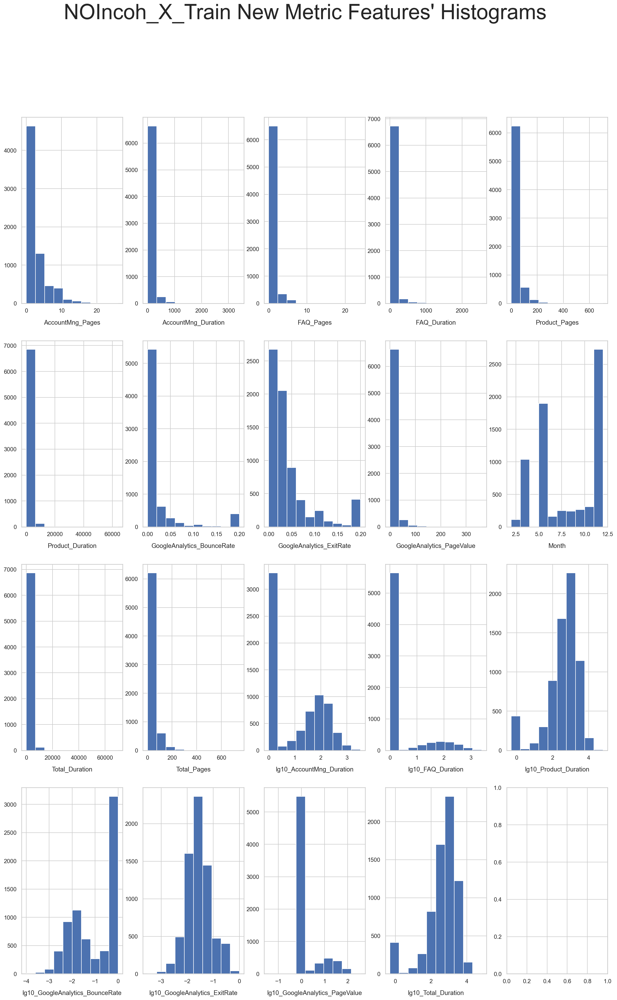

In [64]:
# All Numeric Variables' Histograms in one figure
sns.set(style="whitegrid")

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(X_new_metric_features) / 4), figsize=(20, 30))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), X_new_metric_features): # Notice the zip() function and flatten() method
    ax.hist(NOIncoh_X_train[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "NOIncoh_X_Train New Metric Features' Histograms"

plt.suptitle(title, size = 40)

plt.savefig(r'Figures\NOIncoh_X_train_new_metric_features_histograms.png', dpi=200)
plt.show()

- _Graph 7: Numeric Variables' BoxPlots (TRAIN)_

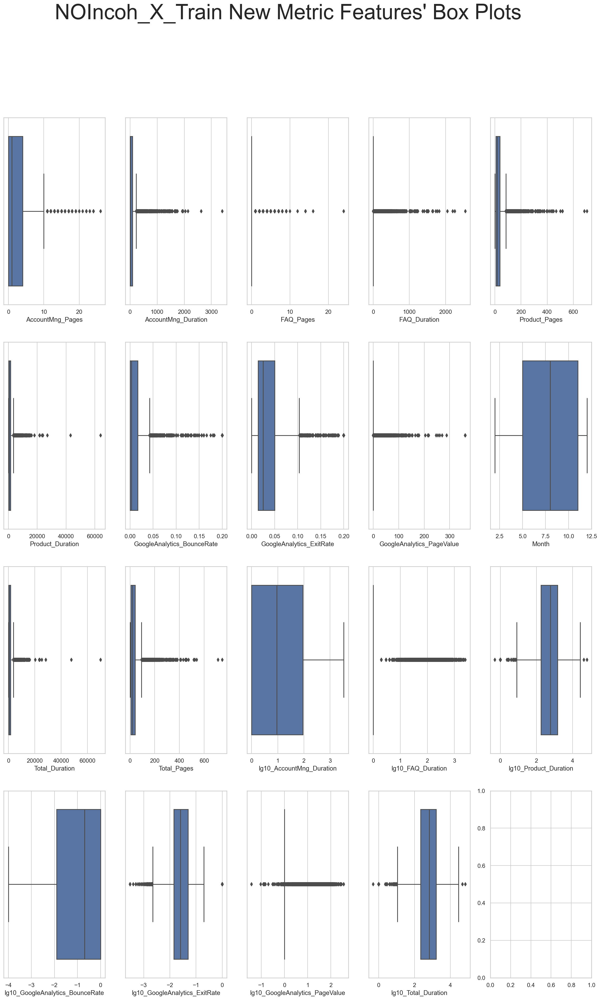

In [65]:
# All Numeric Variables' Box Plots in one figure
sns.set(style="whitegrid")

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(X_new_metric_features) / 4), figsize=(20, 30))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), X_new_metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=NOIncoh_X_train[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "NOIncoh_X_Train New Metric Features' Box Plots"

plt.suptitle(title, size = 40)

plt.savefig(r'Figures\NOIncoh_X_train_new_metric_features_box_plots.png', dpi=200)
plt.show()

- _Graph 8: Numeric Variables' Histograms (TRAIN+SM)_

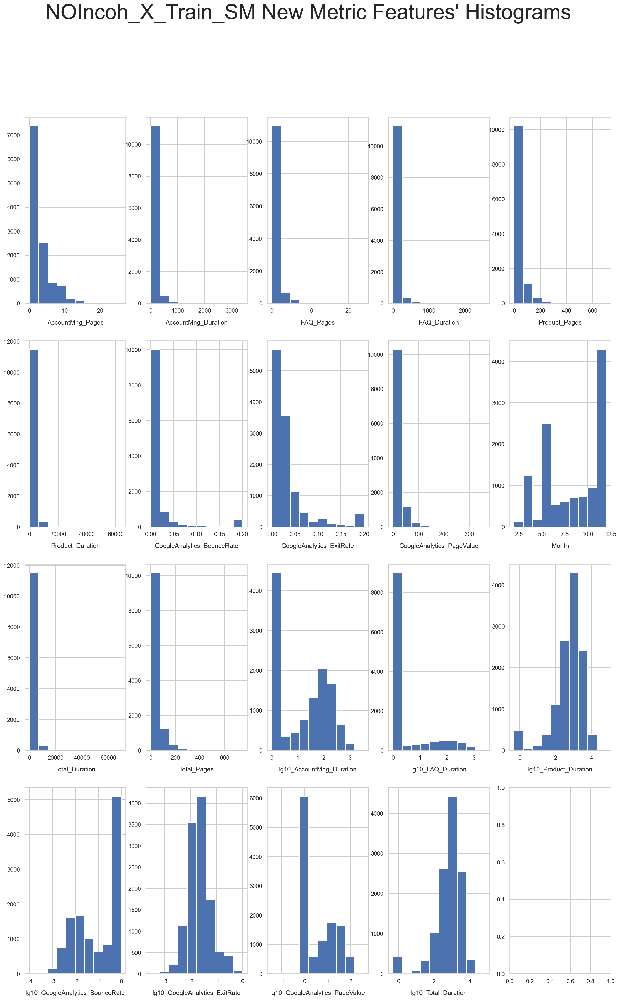

In [66]:
# All Numeric Variables' Histograms in one figure
sns.set(style="whitegrid")

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(4, ceil(len(X_new_metric_features) / 4), figsize=(20, 30))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), X_new_metric_features): # Notice the zip() function and flatten() method
    ax.hist(NOIncoh_X_train_SM[feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "NOIncoh_X_Train_SM New Metric Features' Histograms"

plt.suptitle(title, size = 40)

plt.savefig(r'Figures\NOIncoh_X_train_SM_new_metric_features_histograms.png', dpi=200)
plt.show()

- _Graph 9: Numeric Variables' BoxPlots (TRAIN+SM)_

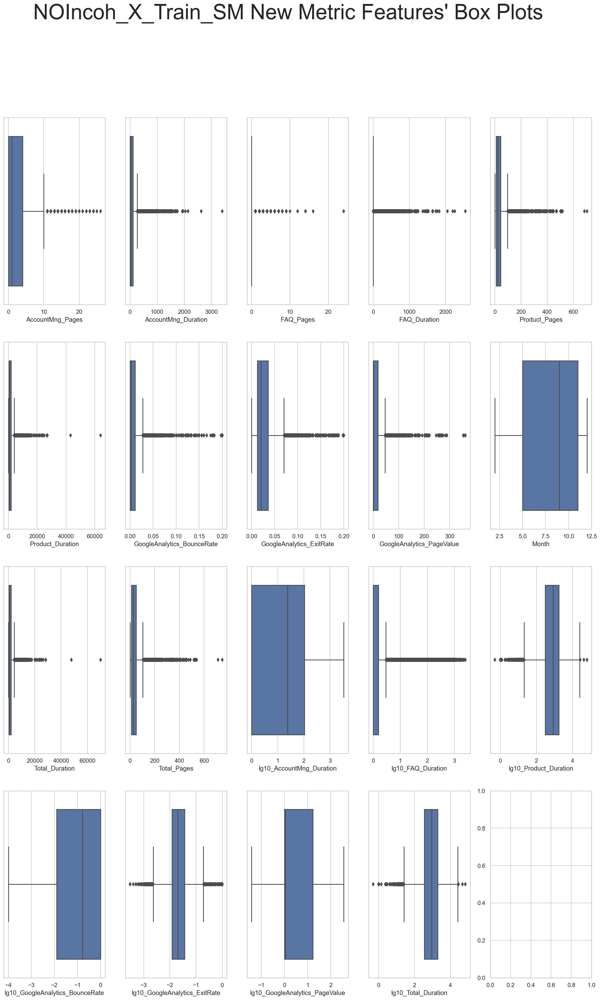

In [67]:
# All Numeric Variables' Box Plots in one figure
sns.set(style="whitegrid")

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(4, ceil(len(X_new_metric_features) / 4), figsize=(20, 30))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), X_new_metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=NOIncoh_X_train_SM[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "NOIncoh_X_Train_SM New Metric Features' Box Plots"

plt.suptitle(title, size = 40)

plt.savefig(r'Figures\NOIncoh_X_train_SM_new_metric_features_box_plots.png', dpi=200)
plt.show()

### 6.2.1. Manual Outliers

In [68]:
# Let's create another copy of our dataset so that we have different scenarios later on.
VMOut_X_train = NOIncoh_X_train.copy() #VMOut -> Version Manual Outliers
VAOut_X_train = NOIncoh_X_train.copy() #VAOut -> Version Automatic Outliers

VMOut_X_train_SM = NOIncoh_X_train_SM.copy()
VAOut_X_train_SM = NOIncoh_X_train_SM.copy()

In [69]:
VMOut_X_train.loc[(VMOut_X_train["AccountMng_Pages"]>20)]
counter = len(VMOut_X_train.loc[(VMOut_X_train["AccountMng_Pages"]>20)])

In [70]:
VMOut_X_train_SM.loc[(VMOut_X_train_SM["AccountMng_Pages"]>20)]
counter_SM = len(VMOut_X_train_SM.loc[(VMOut_X_train_SM["AccountMng_Pages"]>20)])

In [71]:
VMOut_X_train.loc[(VMOut_X_train["AccountMng_Duration"]>2000)]
counter += len(VMOut_X_train.loc[(VMOut_X_train["AccountMng_Duration"]>2000)])

In [72]:
VMOut_X_train_SM.loc[(VMOut_X_train_SM["AccountMng_Duration"]>2000)]
counter_SM += len(VMOut_X_train_SM.loc[(VMOut_X_train_SM["AccountMng_Duration"]>2000)])

In [73]:
VMOut_X_train.loc[(VMOut_X_train["FAQ_Pages"]>15)]
counter += len(VMOut_X_train.loc[(VMOut_X_train["FAQ_Pages"]>15)])

In [74]:
VMOut_X_train_SM.loc[(VMOut_X_train_SM["FAQ_Pages"]>15)]
counter_SM += len(VMOut_X_train_SM.loc[(VMOut_X_train_SM["FAQ_Pages"]>15)])

In [75]:
VMOut_X_train.loc[(VMOut_X_train["FAQ_Duration"]>1900)]
counter += len(VMOut_X_train.loc[(VMOut_X_train["FAQ_Duration"]>1900)])

In [76]:
VMOut_X_train_SM.loc[(VMOut_X_train_SM["FAQ_Duration"]>1900)]
counter_SM += len(VMOut_X_train_SM.loc[(VMOut_X_train_SM["FAQ_Duration"]>1900)])

In [77]:
VMOut_X_train.loc[(VMOut_X_train["Product_Pages"]>450)]
counter += len(VMOut_X_train.loc[(VMOut_X_train["Product_Pages"]>450)])

In [78]:
VMOut_X_train_SM.loc[(VMOut_X_train_SM["Product_Pages"]>450)]
counter_SM += len(VMOut_X_train_SM.loc[(VMOut_X_train_SM["Product_Pages"]>450)])

In [79]:
VMOut_X_train.loc[(VMOut_X_train["Product_Duration"]>20000)]
counter += len(VMOut_X_train.loc[(VMOut_X_train["Product_Duration"]>20000)])

In [80]:
VMOut_X_train_SM.loc[(VMOut_X_train_SM["Product_Duration"]>20000)]
counter_SM += len(VMOut_X_train_SM.loc[(VMOut_X_train_SM["Product_Duration"]>20000)])

In [81]:
# Podem não ser outliers, segundo o histograma...
# VMOut_techscape_train.loc[(VMOut_techscape_train["GoogleAnalytics_BounceRate"]>0.190)]

In [82]:
VMOut_X_train.loc[(VMOut_X_train["GoogleAnalytics_PageValue"]>190)]
counter += len(VMOut_X_train.loc[(VMOut_X_train["GoogleAnalytics_PageValue"]>190)])

In [83]:
VMOut_X_train_SM.loc[(VMOut_X_train_SM["GoogleAnalytics_PageValue"]>190)]
counter_SM += len(VMOut_X_train_SM.loc[(VMOut_X_train_SM["GoogleAnalytics_PageValue"]>190)])

In [84]:
# Calculating the % of rows eliminated from the train dataset...
print("At the worst case scenario, the % of deleted rows in the X_train dataset is of", counter/len(VMOut_X_train) * 100, "%.")

At the worst case scenario, the % of deleted rows in the X_train dataset is of 0.6286612373196171 %.


In [85]:
# Calculating the % of rows eliminated from the train_SM dataset...
print("At the worst case scenario, the % of deleted rows in the X_train_SM dataset is of", counter_SM/len(VMOut_X_train_SM) * 100, "%.")

At the worst case scenario, the % of deleted rows in the X_train_SM dataset is of 0.7018433959073228 %.


In [86]:
Rlist = VMOut_X_train[
    (VMOut_X_train["AccountMng_Pages"]>20)
    | (VMOut_X_train["AccountMng_Duration"]>2000)
    | (VMOut_X_train["FAQ_Pages"]>15) 
    | (VMOut_X_train["FAQ_Duration"]>1900) 
    | (VMOut_X_train["Product_Pages"]>450) 
    | (VMOut_X_train["Product_Duration"]>20000) 
    | (VMOut_X_train["GoogleAnalytics_PageValue"]>190)].index.tolist()

In [87]:
VMOut_X_train.drop(VMOut_X_train[
    (VMOut_X_train["AccountMng_Pages"]>20)
    | (VMOut_X_train["AccountMng_Duration"]>2000)
    | (VMOut_X_train["FAQ_Pages"]>15) 
    | (VMOut_X_train["FAQ_Duration"]>1900) 
    | (VMOut_X_train["Product_Pages"]>450) 
    | (VMOut_X_train["Product_Duration"]>20000) 
    | (VMOut_X_train["GoogleAnalytics_PageValue"]>190)].index, inplace = True)

In [88]:
Y_train_VMOut = Y_train.copy()
Y_train_VMOut.drop(Rlist, inplace = True)

In [89]:
indexes = VMOut_X_train_SM[:].index.tolist()

In [90]:
Rlist_SM = VMOut_X_train_SM[
    (VMOut_X_train_SM["AccountMng_Pages"]>20)
    | (VMOut_X_train_SM["AccountMng_Duration"]>2000)
    | (VMOut_X_train_SM["FAQ_Pages"]>15) 
    | (VMOut_X_train_SM["FAQ_Duration"]>1900) 
    | (VMOut_X_train_SM["Product_Pages"]>450) 
    | (VMOut_X_train_SM["Product_Duration"]>20000) 
    | (VMOut_X_train_SM["GoogleAnalytics_PageValue"]>190)].index.tolist()

In [91]:
Y_train_SM_VMOut = Y_train_SM.copy()
Y_train_SM_VMOut = pd.Series(Y_train_SM_VMOut, name = 'Buy', index = indexes)

In [92]:
Y_train_SM = pd.Series(Y_train_SM, name = 'Buy')

In [93]:
VMOut_X_train_SM.drop(VMOut_X_train_SM[
    (VMOut_X_train_SM["AccountMng_Pages"]>20)
    | (VMOut_X_train_SM["AccountMng_Duration"]>2000)
    | (VMOut_X_train_SM["FAQ_Pages"]>15) 
    | (VMOut_X_train_SM["FAQ_Duration"]>1900) 
    | (VMOut_X_train_SM["Product_Pages"]>450) 
    | (VMOut_X_train_SM["Product_Duration"]>20000) 
    | (VMOut_X_train_SM["GoogleAnalytics_PageValue"]>190)].index, inplace = True)

In [94]:
Y_train_SM_VMOut.drop(Rlist_SM, inplace = True)

In [95]:
print("The % of deleted rows in the dataset is of", (len(X_train) - len(VMOut_X_train))/len(X_train) *100, "%.")

The % of deleted rows in the dataset is of 0.5000714387769681 %.


In [96]:
print("The % of deleted rows in the dataset is of", (len(X_train_SM) - len(VMOut_X_train_SM))/len(X_train_SM) *100, "%.")

The % of deleted rows in the dataset is of 0.5919161170302722 %.


### 6.2.2. Automatic Outliers

In [97]:
# identify outliers in the training dataset
iso = IsolationForest(contamination=0.03)
yhat = iso.fit_predict(VAOut_X_train[X_new_metric_features])

In [98]:
# select all rows that are not outliers
mask = yhat != -1
VAOut_X_train = VAOut_X_train[mask]

In [99]:
print("The % of deleted rows in the dataset is of", (len(X_train) - len(VAOut_X_train))/len(X_train) *100, "%.")

The % of deleted rows in the dataset is of 3.000428632661809 %.


In [100]:
# identify outliers in the training_SM dataset
iso = IsolationForest(contamination=0.03)
yhat = iso.fit_predict(VAOut_X_train_SM[X_new_metric_features])

In [101]:
# select all rows that are not outliers
mask = yhat != -1
VAOut_X_train_SM = VAOut_X_train_SM[mask]

In [102]:
print("The % of deleted rows in the dataset is of", (len(X_train_SM) - len(VAOut_X_train_SM))/len(X_train_SM) *100, "%.")

The % of deleted rows in the dataset is of 2.984948418738373 %.


#### 6.2.2.1. IQR Method
 - The IQR method wouln't be an option since that, according to the results gotten from the describe tables, most of the dataset would be eliminated. Therefore, we won't be using this method.

In [103]:
VMOut_X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,6964.0,2.270391,3.179666,0.000000,0.000000,1.000000,4.000000,19.000000
AccountMng_Duration,6964.0,77.158740,160.929918,0.000000,0.000000,9.000000,91.266675,1946.000000
FAQ_Pages,6964.0,0.465250,1.194354,0.000000,0.000000,0.000000,0.000000,14.000000
FAQ_Duration,6964.0,31.611259,122.703456,0.000000,0.000000,0.000000,0.000000,1830.500000
Product_Pages,6964.0,30.967547,41.130895,0.000000,7.000000,18.000000,38.000000,440.000000
Product_Duration,6964.0,1157.315655,1648.826899,0.000000,180.000000,595.570850,1466.592075,18171.794500
GoogleAnalytics_BounceRate,6964.0,0.022118,0.048440,0.000000,0.000000,0.003100,0.017100,0.200000
GoogleAnalytics_ExitRate,6964.0,0.043180,0.048654,0.000000,0.014300,0.025000,0.050000,0.200000
GoogleAnalytics_PageValue,6964.0,5.585196,16.165979,0.000000,0.000000,0.000000,0.000000,179.307300
Month,6964.0,7.704193,3.391041,2.000000,5.000000,8.000000,11.000000,12.000000


In [104]:
VAOut_X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,6789.0,2.120931,2.990057,0.000000,0.000000,1.000000,3.000000,23.000000
AccountMng_Duration,6789.0,70.388939,146.460250,0.000000,0.000000,6.000000,86.000000,1946.000000
FAQ_Pages,6789.0,0.384151,1.011290,0.000000,0.000000,0.000000,0.000000,9.000000
FAQ_Duration,6789.0,22.912194,90.965950,0.000000,0.000000,0.000000,0.000000,1729.000000
Product_Pages,6789.0,27.210635,30.583726,0.000000,7.000000,17.000000,36.000000,260.000000
Product_Duration,6789.0,998.507179,1212.255129,0.000000,168.900000,572.900000,1369.775000,12449.900000
GoogleAnalytics_BounceRate,6789.0,0.022505,0.048981,0.000000,0.000000,0.002900,0.017600,0.200000
GoogleAnalytics_ExitRate,6789.0,0.043778,0.049095,0.000000,0.014300,0.025600,0.050000,0.200000
GoogleAnalytics_PageValue,6789.0,5.789078,18.804562,0.000000,0.000000,0.000000,0.000000,361.763700
Month,6789.0,7.674032,3.395498,2.000000,5.000000,8.000000,11.000000,12.000000


In [105]:
VMOut_X_train_SM.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,11756.0,2.503403,3.151618,0.000000,0.000000,1.000000,4.000000,20.000000
AccountMng_Duration,11756.0,87.059906,160.498771,0.000000,0.000000,27.116299,107.293585,1946.000000
FAQ_Pages,11756.0,0.482392,1.158379,0.000000,0.000000,0.000000,0.000000,14.000000
FAQ_Duration,11756.0,36.437838,127.225266,0.000000,0.000000,0.000000,0.000000,1830.500000
Product_Pages,11756.0,37.122491,46.759867,0.000000,10.000000,23.000000,45.000000,449.000000
Product_Duration,11756.0,1423.905275,1882.677153,0.000000,299.927650,826.637307,1773.655391,19706.092575
GoogleAnalytics_BounceRate,11756.0,0.015291,0.038630,0.000000,0.000000,0.002700,0.011272,0.200000
GoogleAnalytics_ExitRate,11756.0,0.033542,0.040132,0.000000,0.012430,0.020653,0.035729,0.200000
GoogleAnalytics_PageValue,11756.0,13.364327,22.267028,0.000000,0.000000,0.708525,18.496618,183.025816
Month,11756.0,7.977799,3.103122,2.000000,5.000000,9.000000,11.000000,12.000000


In [106]:
VAOut_X_train_SM.describe().T

,count,mean,std,min,25%,50%,75%,max
AccountMng_Pages,11473.0,2.365205,2.982541,0.000000,0.000000,1.000000,4.000000,23.000000
AccountMng_Duration,11473.0,80.899598,150.379384,0.000000,0.000000,24.215677,101.142900,2137.112700
FAQ_Pages,11473.0,0.400331,0.988792,0.000000,0.000000,0.000000,0.000000,9.000000
FAQ_Duration,11473.0,25.768479,88.183773,0.000000,0.000000,0.000000,0.000000,1368.000000
Product_Pages,11473.0,33.133531,35.938469,0.000000,10.000000,22.000000,42.000000,286.000000
Product_Duration,11473.0,1256.501889,1445.256918,0.000000,292.875000,788.540456,1650.416700,12449.900000
GoogleAnalytics_BounceRate,11473.0,0.015371,0.038827,0.000000,0.000000,0.002500,0.011418,0.200000
GoogleAnalytics_ExitRate,11473.0,0.033745,0.040331,0.000000,0.012332,0.020747,0.036376,0.200000
GoogleAnalytics_PageValue,11473.0,14.201595,26.128811,0.000000,0.000000,0.357180,19.084260,361.763700
Month,11473.0,7.942299,3.104073,2.000000,5.000000,8.000000,11.000000,12.000000


 - From this point forward, we are going to work with the datasets with the outliers manually removed, since they seem to show better results, when comparing with the results from the datasets with the outliers automatically removed.

## 6.3. Standardization
### 6.3.1. MinMaxScaler()

In [107]:
scaler = MinMaxScaler()

In [108]:
test_MM = test.copy()
X_validation_MM = X_validation.copy()

In [109]:
VMOut_X_train = pd.DataFrame(scaler.fit_transform(VMOut_X_train.values), columns=VMOut_X_train.columns, index=VMOut_X_train.index)
VMOut_X_train_SM = pd.DataFrame(scaler.fit_transform(VMOut_X_train_SM.values), columns=VMOut_X_train_SM.columns, index=VMOut_X_train_SM.index)
test_MM = pd.DataFrame(scaler.fit_transform(test_MM.values), columns=test_MM.columns, index=test_MM.index)
X_validation_MM = pd.DataFrame(scaler.fit_transform(X_validation_MM.values), columns=X_validation_MM.columns, index=X_validation_MM.index)

In [110]:
model_MM = MLPClassifier().fit(VMOut_X_train, Y_train_VMOut)
print(model_MM.score(VMOut_X_train, Y_train_VMOut))
print(model_MM.score(X_validation_MM, Y_validation))

0.9395462377943711
0.885


In [111]:
model_MM2 = MLPClassifier().fit(VMOut_X_train_SM, Y_train_SM_VMOut)
print(model_MM2.score(VMOut_X_train_SM, Y_train_SM_VMOut))
print(model_MM2.score(X_validation_MM, Y_validation))

0.9633378700238177
0.8863333333333333


### 6.3.2. RobustScaler()

In [112]:
scaler2 = RobustScaler()

In [113]:
test_RS = test.copy()
X_validation_RS = X_validation.copy()

In [114]:
X_train = pd.DataFrame(scaler2.fit_transform(X_train.values), columns=X_train.columns, index=X_train.index)
X_train_SM = pd.DataFrame(scaler2.fit_transform(X_train_SM.values), columns=X_train_SM.columns, index=X_train_SM.index)
test_RS = pd.DataFrame(scaler2.fit_transform(test_RS.values), columns=test_RS.columns, index=test_RS.index)
X_validation_RS = pd.DataFrame(scaler2.fit_transform(X_validation_RS.values), columns=X_validation_RS.columns, index=X_validation_RS.index)

In [115]:
model_robust = MLPClassifier().fit(X_train, Y_train)
print(model_robust.score(X_train, Y_train))
print(model_robust.score(X_validation_RS, Y_validation))

0.9144163451921703
0.8903333333333333


In [116]:
model_robust2 = MLPClassifier().fit(X_train_SM, Y_train_SM)
print(model_robust2.score(X_train_SM, Y_train_SM))
print(model_robust2.score(X_validation_RS, Y_validation))

0.9627938440723829
0.6313333333333333


# 7. Feature Selection

## 7.1. Filter Based Methods
### 7.1.1. Univariate Variables
Check if any of the numerical variables is univariate (variance is equal to 0). Drop those variables if existent.

In [117]:
X_train.var().sort_values()

x3_14                                  0.002708
x3_7                                   0.003134
x3_12                                  0.003702
x3_9                                   0.004269
x4_Other                               0.008500
x3_15                                  0.017130
x3_11                                  0.019606
x3_5                                   0.021249
x0_Switzerland                         0.026684
x3_8                                   0.026819
x3_10                                  0.032053
x0_Germany                             0.032187
x3_6                                   0.034316
x2_5                                   0.034448
x0_United Kingdom                      0.042467
x1_Other                               0.046870
x2_Other                               0.053006
x2_4                                   0.056038
x0_Italy                               0.056164
x3_13                                  0.056290
x0_Other                               0

In [118]:
X_train_SM.var().sort_values()

x3_12                                 0.002194
x3_14                                 0.002242
x3_7                                  0.003124
x3_9                                  0.003399
x4_Other                              0.007827
x3_15                                 0.017806
x3_11                                 0.019124
x3_5                                  0.020917
x0_Switzerland                        0.023767
x0_Germany                            0.026129
x3_6                                  0.028388
x3_8                                  0.028432
x3_10                                 0.029354
x2_5                                  0.031811
x0_United Kingdom                     0.037825
x3_13                                 0.040218
x1_Other                              0.041321
x2_Other                              0.044510
x0_Italy                              0.049008
x2_4                                  0.049724
x0_Other                              0.052023
x3_4         

In [119]:
VMOut_X_train.var().sort_values()

x3_14                              0.002578
x3_7                               0.003150
x3_12                              0.003720
x3_9                               0.004290
FAQ_Duration                       0.004493
AccountMng_Duration                0.006839
Total_Duration                     0.007242
FAQ_Pages                          0.007278
GoogleAnalytics_PageValue          0.008128
Product_Duration                   0.008233
x4_Other                           0.008402
Product_Pages                      0.008738
Total_Pages                        0.009047
lg10_GoogleAnalytics_ExitRate      0.016539
x3_15                              0.017076
x3_11                              0.019564
x3_5                               0.021353
lg10_GoogleAnalytics_PageValue     0.021583
x3_8                               0.026407
x0_Switzerland                     0.026678
AccountMng_Pages                   0.028006
x3_10                              0.031941
x0_Germany                      

In [120]:
VMOut_X_train_SM.var().sort_values()

x3_14                              0.002170
x3_12                              0.002207
x3_7                               0.003142
x3_9                               0.003419
FAQ_Duration                       0.004831
AccountMng_Duration                0.006802
FAQ_Pages                          0.006846
x4_Other                           0.007631
Total_Duration                     0.008652
Product_Duration                   0.009127
Product_Pages                      0.010846
Total_Pages                        0.011311
lg10_GoogleAnalytics_ExitRate      0.014519
GoogleAnalytics_PageValue          0.014801
x3_15                              0.017661
x3_11                              0.019154
x3_5                               0.021038
x0_Switzerland                     0.023779
AccountMng_Pages                   0.024832
x0_Germany                         0.026189
x3_8                               0.027840
lg10_Total_Duration                0.028027
x3_6                            

### 7.1.2. Spearman Correlation
We are going to check now the spearman correlation between the variables (ordinal or continous ones).

In [121]:
def cor_heatmap(cor,name):
    plt.figure(figsize=(36,30))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.savefig(name+'_cor_spearman_heatmap.png', dpi=200)
    plt.show()

In [122]:
X_new_metric_features

['AccountMng_Pages',
 'AccountMng_Duration',
 'FAQ_Pages',
 'FAQ_Duration',
 'Product_Pages',
 'Product_Duration',
 'GoogleAnalytics_BounceRate',
 'GoogleAnalytics_ExitRate',
 'GoogleAnalytics_PageValue',
 'Month',
 'Total_Duration',
 'Total_Pages',
 'lg10_AccountMng_Duration',
 'lg10_FAQ_Duration',
 'lg10_Product_Duration',
 'lg10_GoogleAnalytics_BounceRate',
 'lg10_GoogleAnalytics_ExitRate',
 'lg10_GoogleAnalytics_PageValue',
 'lg10_Total_Duration']

In [123]:
# Baseline dataset (X_train + Y_train)
all_train1 = X_train[X_new_metric_features].join(Y_train)
all_train1.head()

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,Total_Duration,Total_Pages,lg10_AccountMng_Duration,lg10_FAQ_Duration,lg10_Product_Duration,lg10_GoogleAnalytics_BounceRate,lg10_GoogleAnalytics_ExitRate,lg10_GoogleAnalytics_PageValue,lg10_Total_Duration,Buy
Access_ID,,,,,,,,,,,,,,,,,,,,
551900399,-0.25,-0.099413,0.0,0.0,-0.548387,-0.462350,11.588235,4.901961,0.0,0.666667,-0.481310,-0.558824,-0.489733,0.0,-3.046415,0.000000,1.648529,0.0,-3.253090,0
452150341,-0.25,-0.099413,0.0,0.0,-0.193548,-0.108195,0.088235,1.666667,0.0,0.666667,-0.157016,-0.235294,-0.489733,0.0,-0.126979,-0.865864,0.960247,0.0,-0.196888,0
637995324,-0.25,-0.099413,0.0,0.0,-0.483871,-0.379035,-0.176471,1.168067,0.0,-0.500000,-0.405019,-0.500000,-0.489733,0.0,-0.816252,0.367282,0.771277,0.0,-0.918452,0
627489600,-0.25,-0.099413,0.0,0.0,-0.419355,-0.430207,-0.176471,0.420168,0.0,0.666667,-0.451877,-0.441176,-0.489733,0.0,-1.269907,0.367282,0.362792,0.0,-1.393359,0
387424048,0.75,1.245368,0.0,0.0,-0.483871,-0.335063,-0.176471,0.232493,0.0,-0.500000,-0.277162,-0.382353,0.575746,0.0,-0.614384,0.367282,0.216341,0.0,-0.427655,0


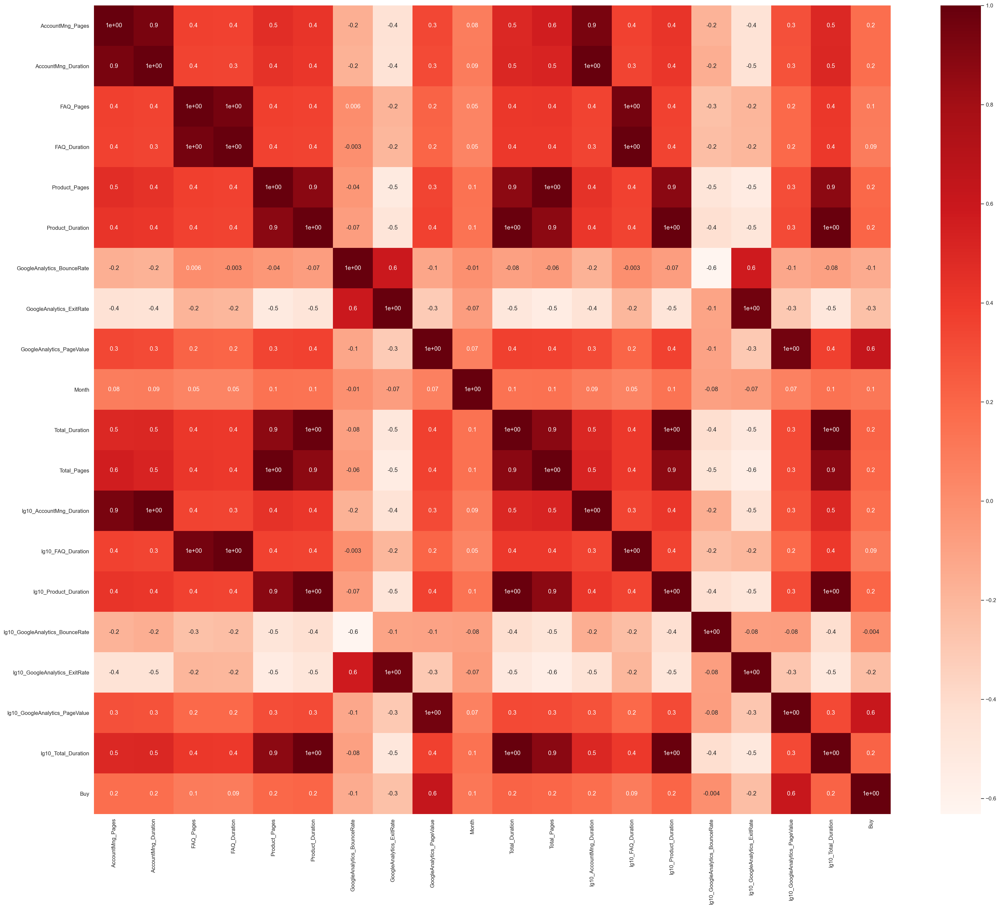

In [124]:
cor_spearman = all_train1.corr(method ='spearman')
cor_heatmap(cor_spearman,'baseline')

In [125]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)
all_train2 = X_train_SM[X_new_metric_features].join(Y_train_SM)
all_train2.head()

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,Total_Duration,Total_Pages,lg10_AccountMng_Duration,lg10_FAQ_Duration,lg10_Product_Duration,lg10_GoogleAnalytics_BounceRate,lg10_GoogleAnalytics_ExitRate,lg10_GoogleAnalytics_PageValue,lg10_Total_Duration,Buy
0,-0.25,-0.257587,0.0,0.0,-0.628571,-0.558166,17.775353,7.728769,-0.044428,0.500000,-0.556482,-0.675676,-0.683168,0.0,-3.781722,0.048496,2.065105,-0.0371,-3.928740,0
1,-0.25,-0.257587,0.0,0.0,-0.314286,-0.248538,0.162740,2.754782,-0.044428,0.500000,-0.274823,-0.378378,-0.683168,0.0,-0.331698,-0.814192,1.287369,-0.0371,-0.392827,0
2,-0.25,-0.257587,0.0,0.0,-0.571429,-0.485325,-0.242666,1.988228,-0.044428,-0.666667,-0.490221,-0.621622,-0.683168,0.0,-1.146242,0.414431,1.073838,-0.0371,-1.227650,0
3,-0.25,-0.257587,0.0,0.0,-0.514286,-0.530064,-0.242666,0.838398,-0.044428,0.500000,-0.530919,-0.567568,-0.683168,0.0,-1.682346,0.414431,0.612264,-0.0371,-1.777100,0
4,0.75,0.891510,0.0,0.0,-0.571429,-0.446882,-0.242666,0.549863,-0.044428,-0.666667,-0.379173,-0.513514,0.353020,0.0,-0.907685,0.414431,0.446779,-0.0371,-0.659816,0


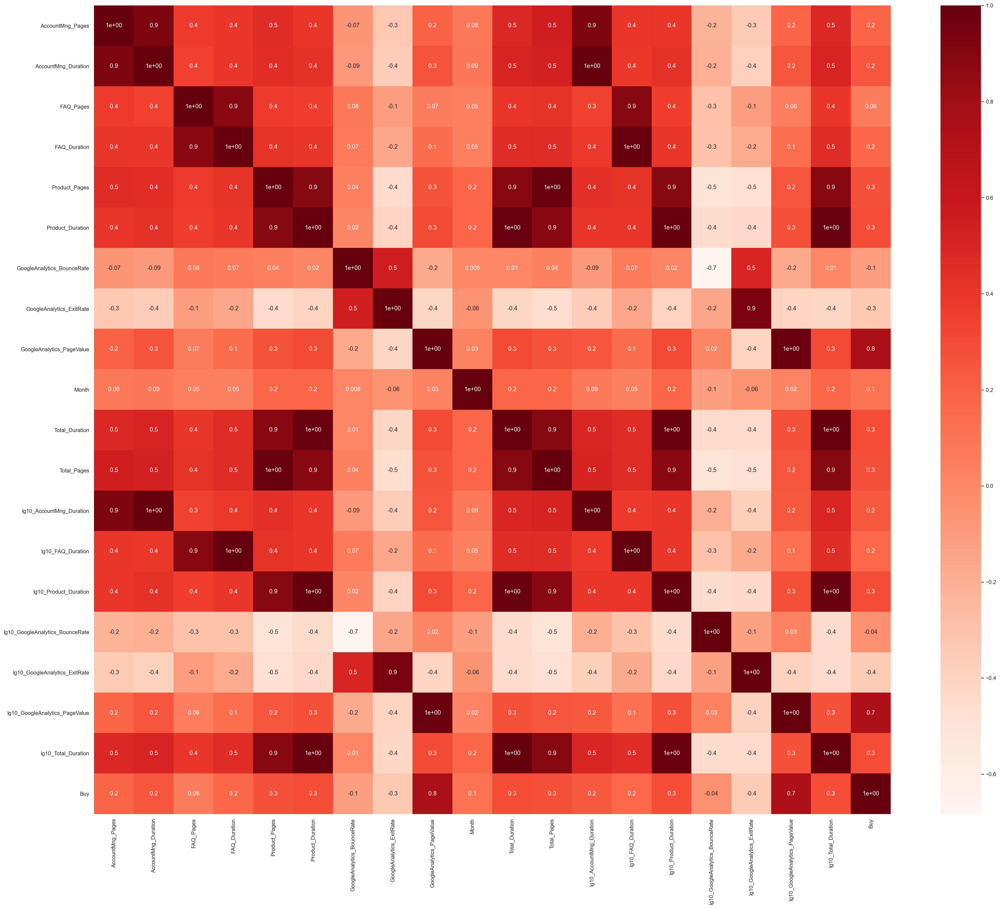

In [126]:
cor_spearman = all_train2.corr(method ='spearman')
cor_heatmap(cor_spearman,'baseline_SMOTE')

In [127]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)
all_train3 = VMOut_X_train[X_new_metric_features].join(Y_train_VMOut)
all_train3.head()

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,Total_Duration,Total_Pages,lg10_AccountMng_Duration,lg10_FAQ_Duration,lg10_Product_Duration,lg10_GoogleAnalytics_BounceRate,lg10_GoogleAnalytics_ExitRate,lg10_GoogleAnalytics_PageValue,lg10_Total_Duration,Buy
Access_ID,,,,,,,,,,,,,,,,,,,,
551900399,0.000000,0.00000,0.0,0.0,0.000000,0.000000,1.0000,1.0000,0.0,1.0,0.000000,0.002217,0.000000,0.0,0.066009,0.825257,0.801591,0.386578,0.065291,0
452150341,0.000000,0.00000,0.0,0.0,0.027273,0.025264,0.0225,0.4225,0.0,1.0,0.022506,0.026608,0.000000,0.0,0.649703,0.413303,0.695379,0.386578,0.642630,0
637995324,0.000000,0.00000,0.0,0.0,0.006818,0.005943,0.0000,0.3335,0.0,0.3,0.005295,0.006652,0.000000,0.0,0.511894,1.000000,0.666218,0.386578,0.506321,0
627489600,0.000000,0.00000,0.0,0.0,0.011364,0.002293,0.0000,0.2000,0.0,1.0,0.002043,0.011086,0.000000,0.0,0.421193,1.000000,0.603182,0.386578,0.416608,0
387424048,0.210526,0.06372,0.0,0.0,0.006818,0.009080,0.0000,0.1665,0.0,0.3,0.014168,0.015521,0.636464,0.0,0.552254,1.000000,0.580583,0.386578,0.599036,0


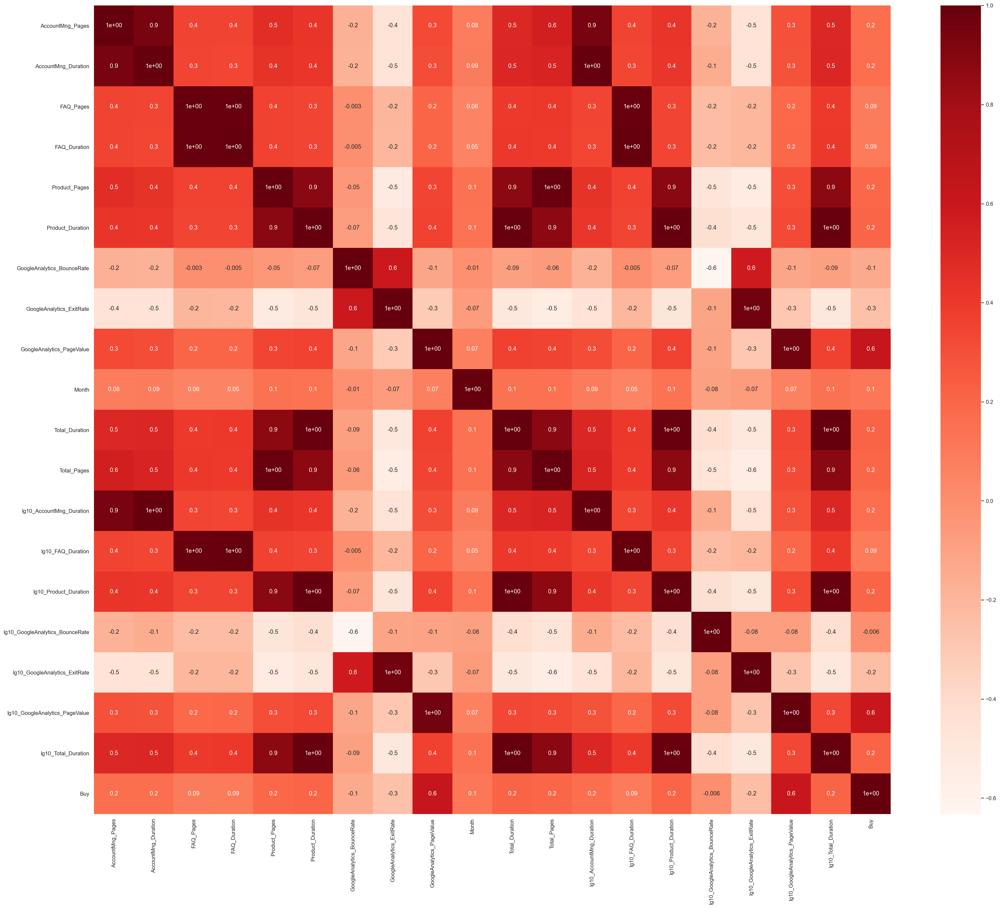

In [128]:
cor_spearman = all_train3.corr(method ='spearman')
cor_heatmap(cor_spearman,'vmout')

In [129]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)
all_train4 = VMOut_X_train_SM[X_new_metric_features].join(Y_train_SM_VMOut)
all_train4.head()

,AccountMng_Pages,AccountMng_Duration,FAQ_Pages,FAQ_Duration,Product_Pages,Product_Duration,GoogleAnalytics_BounceRate,GoogleAnalytics_ExitRate,GoogleAnalytics_PageValue,Month,Total_Duration,Total_Pages,lg10_AccountMng_Duration,lg10_FAQ_Duration,lg10_Product_Duration,lg10_GoogleAnalytics_BounceRate,lg10_GoogleAnalytics_ExitRate,lg10_GoogleAnalytics_PageValue,lg10_Total_Duration,Buy
0,0.0,0.00000,0.0,0.0,0.000000,0.000000,1.0000,1.0000,0.0,1.0,0.000000,0.002188,0.000000,0.0,0.065605,0.825257,0.801591,0.386578,0.065154,0
1,0.0,0.00000,0.0,0.0,0.026726,0.023297,0.0225,0.4225,0.0,1.0,0.021647,0.026258,0.000000,0.0,0.645722,0.413303,0.695379,0.386578,0.641282,0
2,0.0,0.00000,0.0,0.0,0.006682,0.005481,0.0000,0.3335,0.0,0.3,0.005092,0.006565,0.000000,0.0,0.508757,1.000000,0.666218,0.386578,0.505259,0
3,0.0,0.00000,0.0,0.0,0.011136,0.002114,0.0000,0.2000,0.0,1.0,0.001965,0.010941,0.000000,0.0,0.418612,1.000000,0.603182,0.386578,0.415734,0
4,0.2,0.06372,0.0,0.0,0.006682,0.008373,0.0000,0.1665,0.0,0.3,0.013627,0.015317,0.636464,0.0,0.548870,1.000000,0.580583,0.386578,0.597780,0


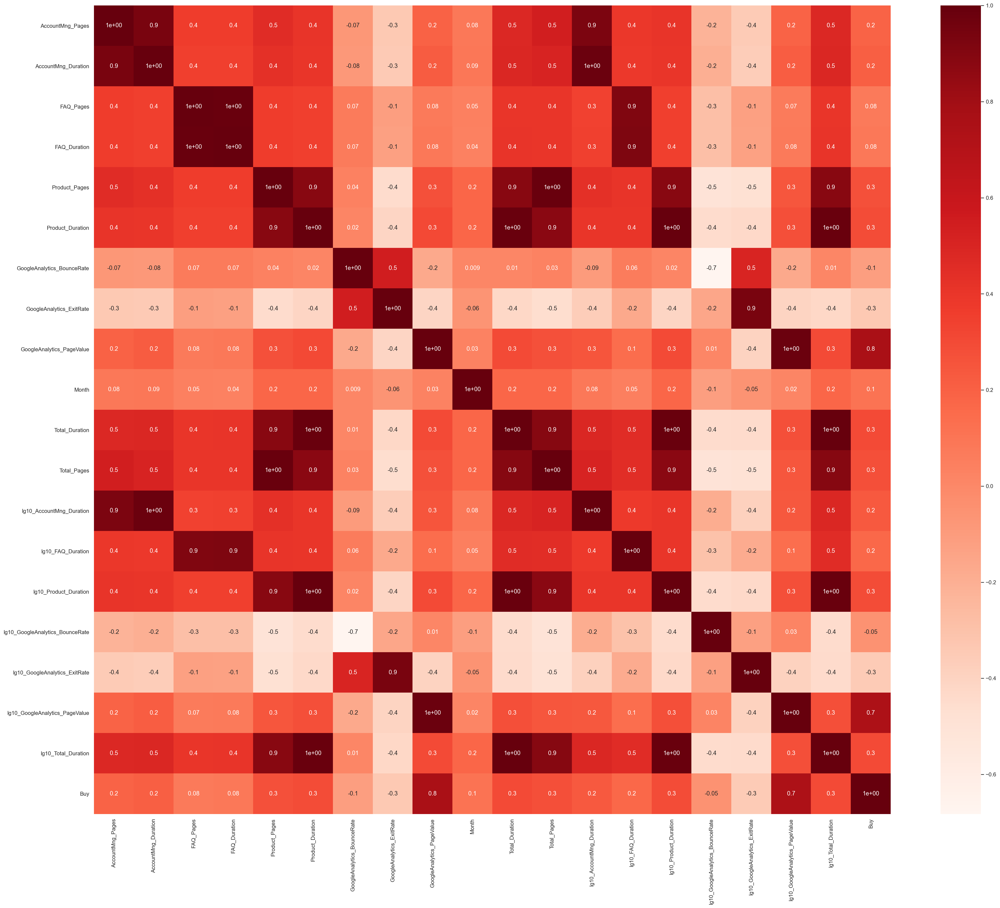

In [130]:
cor_spearman = all_train4.corr(method ='spearman')
cor_heatmap(cor_spearman,'vmout_SMOTE')

### 7.1.3. Mutual Information Coefficient

In [131]:
# Baseline dataset (X_train + Y_train)
mutual1 = mutual_info_classif(X_train, Y_train, discrete_features=True)

mic1 = dict(zip(X_train.columns, mutual1))
mic1 = dict(sorted(mic1.items(), key=lambda item: item[1]))
mic1

# There is no variable that is highly correlated with the target.
# We would choose the 26 variables with higher values.

{'x0_Portugal': 2.1185451025973467e-06,
 'x2_2': 3.694611197979647e-06,
 'x0_Italy': 1.3515065665735404e-05,
 'x0_Spain': 1.930972125628594e-05,
 'x1_Other': 1.9660622229064617e-05,
 'x3_14': 2.858140412625044e-05,
 'x0_France': 2.9532666037015987e-05,
 'x2_Other': 3.7229596190471725e-05,
 'x0_United Kingdom': 4.026319021502994e-05,
 'x0_Switzerland': 4.988547058946621e-05,
 'x4_Other': 6.179427624536382e-05,
 'x3_11': 6.919367359595197e-05,
 'x3_6': 7.507275712680464e-05,
 'x3_4': 7.956408239925133e-05,
 'x0_Other': 8.595368408439302e-05,
 'Weekend': 0.00011176889408145985,
 'x2_4': 0.00011600055048682778,
 'x0_Germany': 0.00013099822833680802,
 'x3_7': 0.0001414661390387647,
 'x2_5': 0.00014470991457662258,
 'x3_10': 0.00014740088648056843,
 'x3_9': 0.00015769075885888224,
 'x3_15': 0.000489859737600417,
 'x3_5': 0.0005023914414832159,
 'x3_12': 0.0006276406222015772,
 'x1_Windows': 0.0015082245403734984,
 'x3_8': 0.00177546760489284,
 'x1_MacOSX': 0.002284144827163312,
 'x3_13': 0.0

In [132]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)
mutual2 = mutual_info_classif(X_train_SM, Y_train_SM, discrete_features=True)

mic2 = dict(zip(X_train_SM.columns, mutual2))
mic2 = dict(sorted(mic2.items(), key=lambda item: item[1]))
mic2

# There is no variable that is highly correlated with the target.
# We would choose all the variables

{'x3_12': 0.0015263377968482879,
 'x3_14': 0.001686694750842385,
 'x3_9': 0.002426554375824324,
 'x3_7': 0.0027825051617288293,
 'FAQ_Pages': 0.0038643080480918694,
 'x4_Other': 0.006735822249526237,
 'x3_15': 0.015083661060265093,
 'Weekend': 0.016012271693791325,
 'x3_11': 0.0178725440846451,
 'x3_5': 0.018004250308134143,
 'x0_Switzerland': 0.01907679878321354,
 'x0_Germany': 0.019257646020736485,
 'x3_6': 0.022867707717117255,
 'AccountMng_Pages': 0.024806948674399122,
 'x2_5': 0.025768064173492766,
 'x3_10': 0.026259706688495622,
 'x3_13': 0.0275326567380841,
 'x3_8': 0.029385499027648754,
 'x0_United Kingdom': 0.03168610466347005,
 'x1_Other': 0.03224827830744877,
 'x2_Other': 0.03531333599456936,
 'x2_4': 0.041011944775348114,
 'x0_Italy': 0.04253262634598033,
 'x0_Other': 0.045148174256888884,
 'x3_4': 0.05262570405213918,
 'x0_France': 0.059848347067395946,
 'Product_Pages': 0.06760502877237737,
 'Total_Pages': 0.07136352817043737,
 'x3_3': 0.07851874767241555,
 'Month': 0.095

In [133]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)
mutual3 = mutual_info_classif(VMOut_X_train, Y_train_VMOut, discrete_features=True)

mic3 = dict(zip(VMOut_X_train.columns, mutual3))
mic3 = dict(sorted(mic3.items(), key=lambda item: item[1]))
mic3

# There is no variable that is highly correlated with the target.
# We would choose the 26 variables with higher values.

{'x0_Portugal': 3.398319975145281e-07,
 'x2_2': 5.1186075054054925e-06,
 'x1_Other': 1.0988475282684707e-05,
 'x0_Italy': 1.9105218369133703e-05,
 'x3_14': 1.9743276658228896e-05,
 'x0_United Kingdom': 2.4253292069252586e-05,
 'x0_France': 2.62876560683592e-05,
 'x4_Other': 3.318348428382745e-05,
 'x0_Spain': 3.3792402518828535e-05,
 'x2_Other': 4.2653962798983036e-05,
 'x0_Switzerland': 6.110053293878828e-05,
 'x3_6': 6.692016840665824e-05,
 'x0_Other': 7.37778392305502e-05,
 'x3_4': 7.83140465876464e-05,
 'x3_11': 8.20549898159946e-05,
 'x2_4': 0.00011097573629490626,
 'x0_Germany': 0.00011575904473332815,
 'Weekend': 0.00013357672207664484,
 'x2_5': 0.00013552874900867734,
 'x3_10': 0.00013695898061310413,
 'x3_7': 0.0001461261643155281,
 'x3_9': 0.00015449328879627413,
 'x3_15': 0.00044254859668163213,
 'x3_5': 0.0005244097607333201,
 'x3_12': 0.0006247205775050252,
 'x1_Windows': 0.0014780132659119316,
 'x3_8': 0.001687688092716362,
 'x1_MacOSX': 0.00226991116011431,
 'x3_13': 0.0

In [134]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)
mutual4 = mutual_info_classif(VMOut_X_train_SM, Y_train_SM_VMOut, discrete_features=True)

mic4 = dict(zip(VMOut_X_train_SM.columns, mutual4))
mic4 = dict(sorted(mic4.items(), key=lambda item: item[1]))
mic4

# There is no variable that is highly correlated with the target.
# We would choose all the variables.

{'x3_12': 0.0015297916246177247,
 'x3_14': 0.001648643689809886,
 'x3_9': 0.002440145734709185,
 'x3_7': 0.0028065388987896277,
 'FAQ_Pages': 0.00434580223148191,
 'x4_Other': 0.006512251127267206,
 'x3_15': 0.014839477947286251,
 'Weekend': 0.015843778494716187,
 'x3_11': 0.017918009352398335,
 'x3_5': 0.018099193152052703,
 'x0_Switzerland': 0.018946593575324938,
 'x0_Germany': 0.019285501792054315,
 'x3_6': 0.023029817398037705,
 'x2_5': 0.025763964295372678,
 'x3_10': 0.026446942619450763,
 'AccountMng_Pages': 0.026728527356318126,
 'x3_13': 0.02742833377026578,
 'x3_8': 0.02883550346077283,
 'x0_United Kingdom': 0.03137308159957758,
 'x1_Other': 0.03220028996602816,
 'x2_Other': 0.03517635927616674,
 'x2_4': 0.040911404167726956,
 'x0_Italy': 0.04286412303952343,
 'x0_Other': 0.045418589067844795,
 'x3_4': 0.05299469161501379,
 'x0_France': 0.05999566235833634,
 'Product_Pages': 0.0690305416516705,
 'Total_Pages': 0.07105968241839596,
 'x3_3': 0.07874974933747252,
 'Month': 0.0960

### 7.1.4. Weights of Dependent Variable on Binary Features

In [135]:
# first join all the training data
all_train5 = X_train.join(Y_train)
all_train6 = VMOut_X_train.join(Y_train_VMOut)

In [136]:
binary_features = ['x0_France', 'x0_Germany', 'x0_Italy', 'x0_Other', 'x0_Portugal', 'x0_Spain', 'x0_Switzerland', 
                   'x0_United Kingdom', 'x1_MacOSX', 'x1_Other', 'x1_Windows', 'x2_2', 'x2_4', 'x2_5', 'x2_Other', 'x3_10', 
                   'x3_11', 'x3_12', 'x3_13', 'x3_14', 'x3_15', 'x3_2', 'x3_3', 'x3_4', 'x3_5', 'x3_6', 'x3_7', 'x3_8', 'x3_9', 
                   'x4_Other', 'x4_Returner', 'Weekend']

In [137]:
def bar_charts_categorical(df, feature, target, name):
    cont_tab = pd.crosstab(df[feature], df[target], margins = True)
    categories = cont_tab.index[:-1]
        
    fig = plt.figure(figsize=(15, 5))
                    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color="gray")
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom=cont_tab.iloc[:-1, 0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Frequency bar chart")
    plt.xlabel(feature)
    plt.ylabel("$Frequency$")

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color="gray")
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom=obs_pct[0], color="yellowgreen")
    plt.legend((p2[0], p1[0]), ('$y_i=1$', '$y_i=0$'))
    plt.title("Proportion bar chart")
    plt.xlabel(feature)
    plt.ylabel("$p$")
    plt.show()

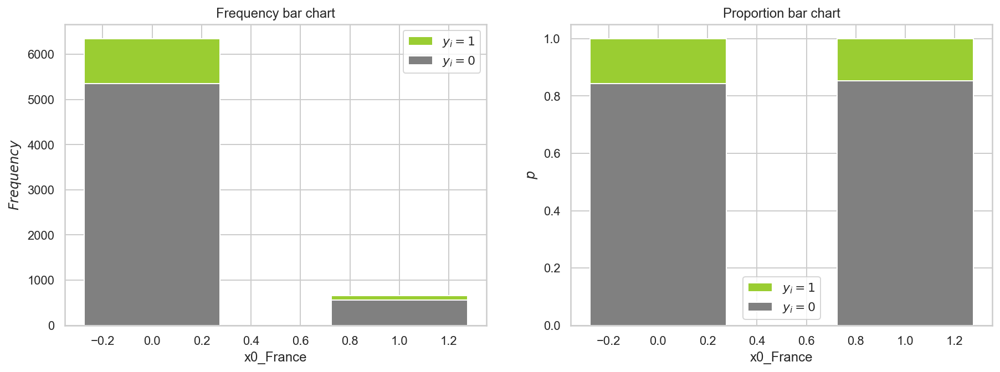

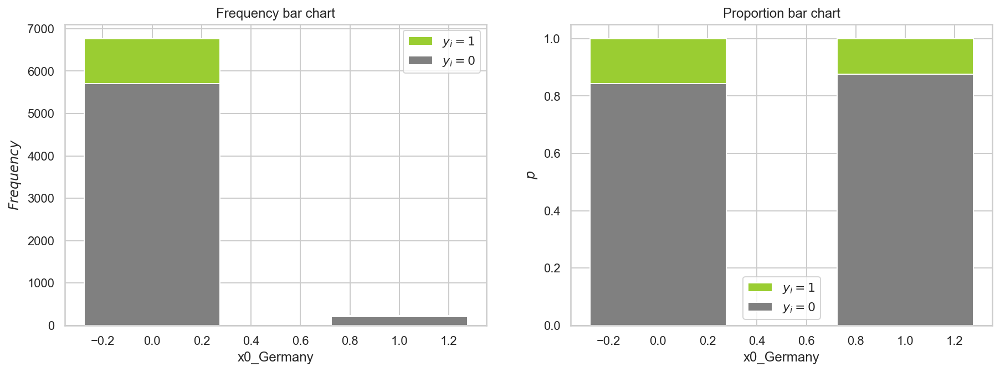

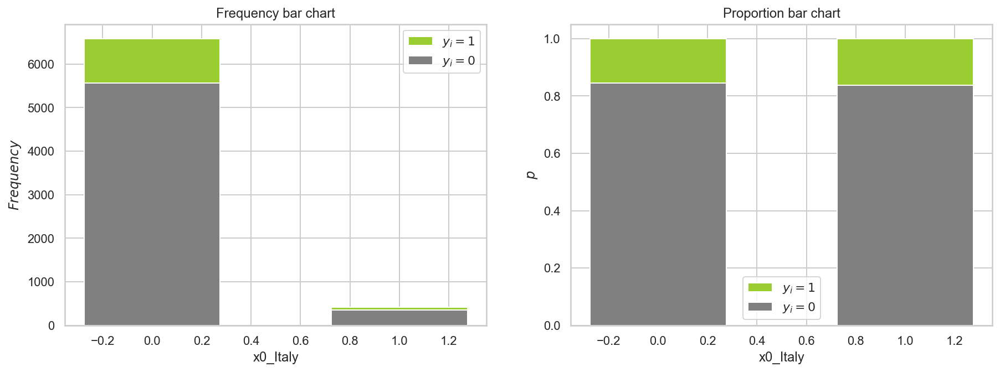

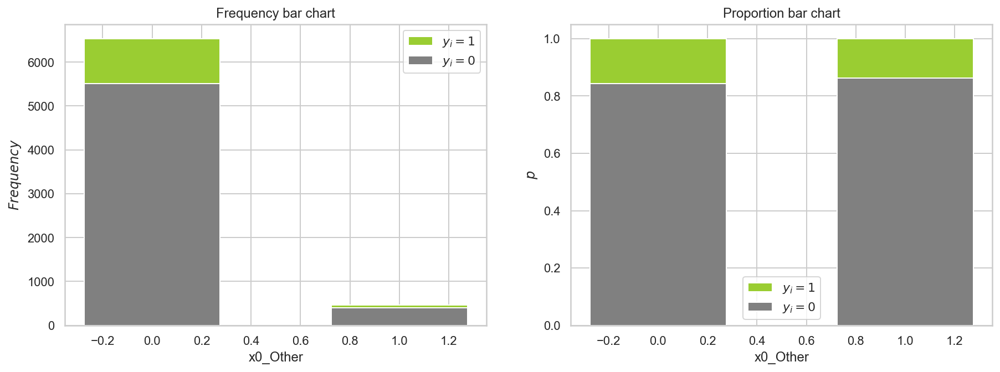

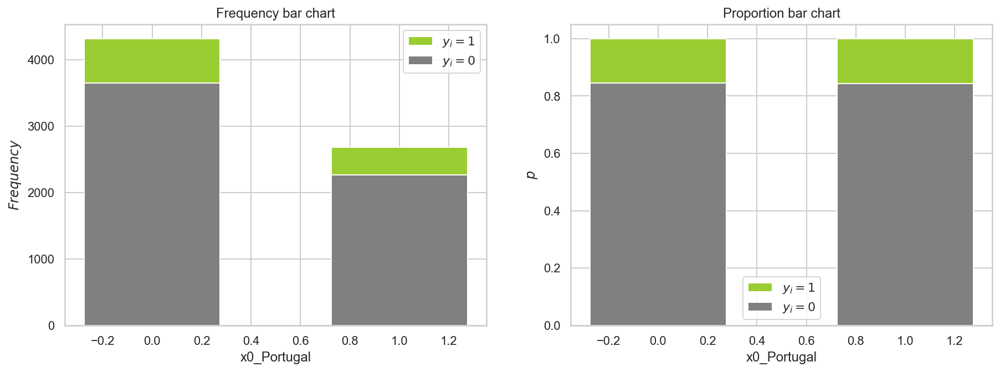

...

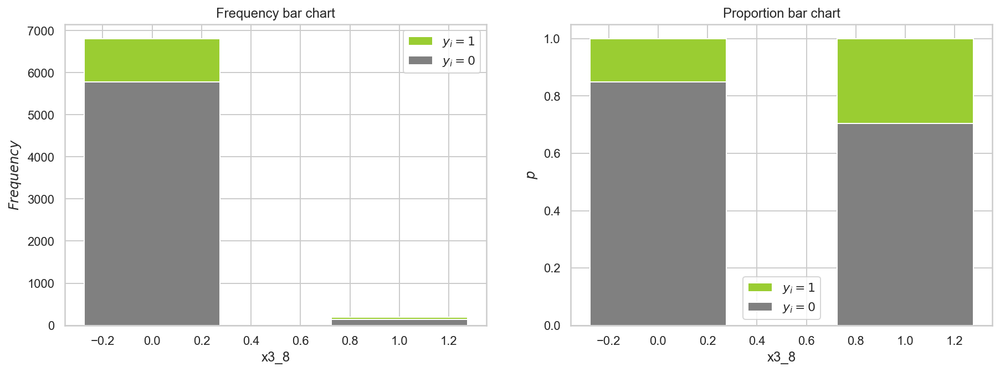

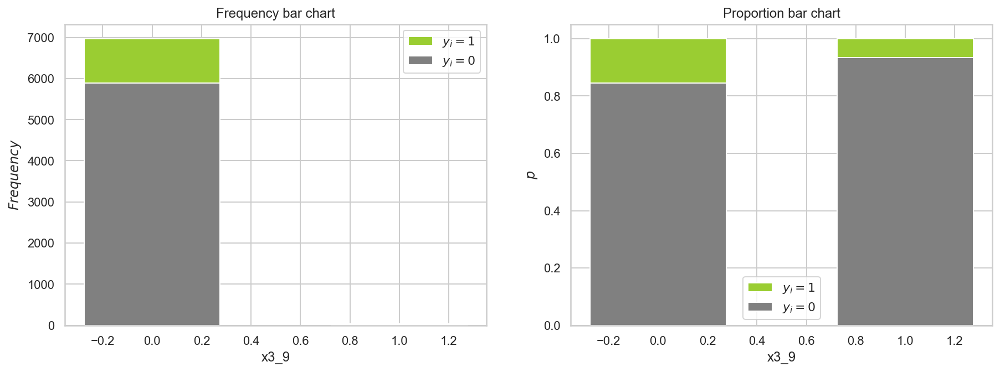

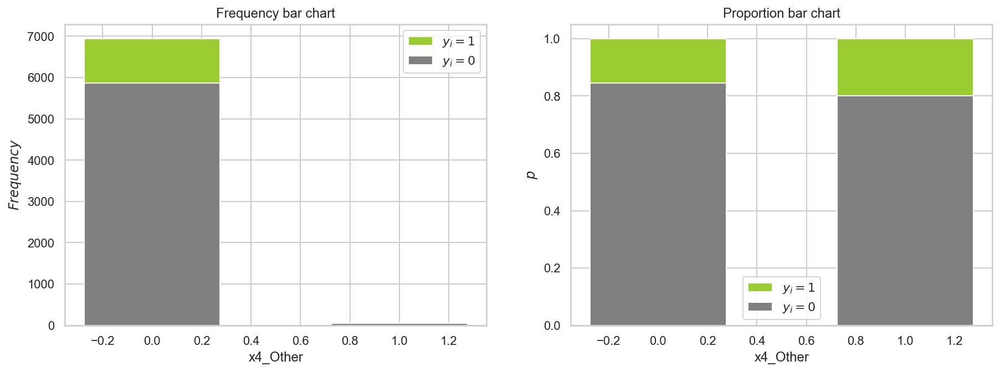

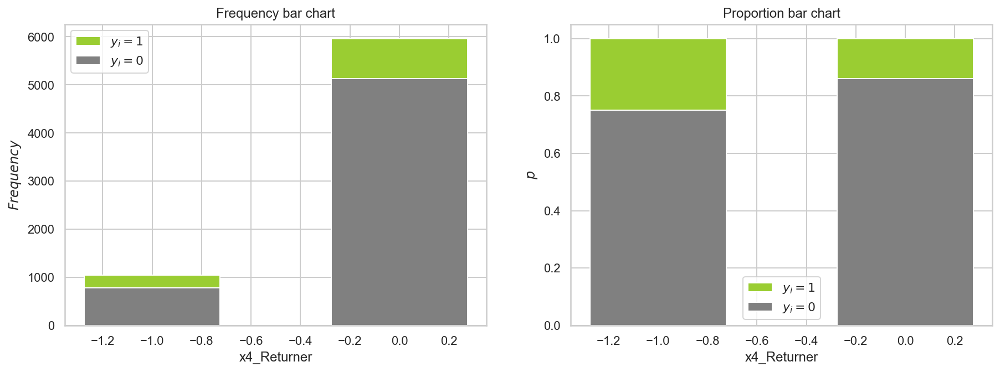

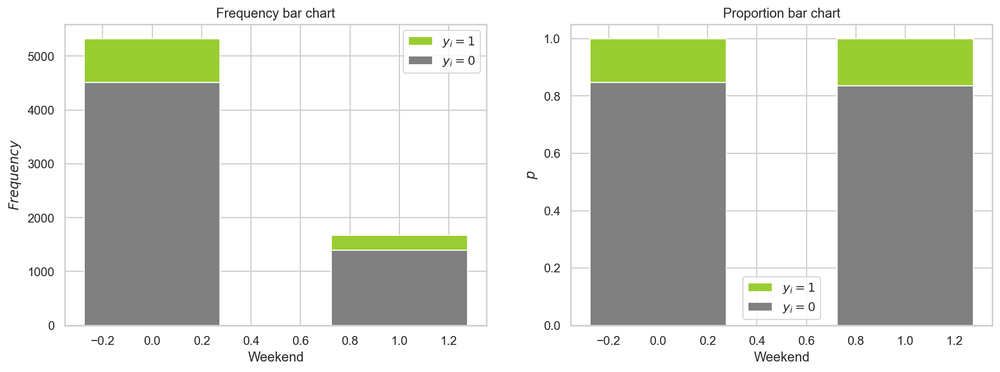

In [138]:
for i in range(len(binary_features)):
    bar_charts_categorical(all_train5, binary_features[i], "Buy",'baseline')

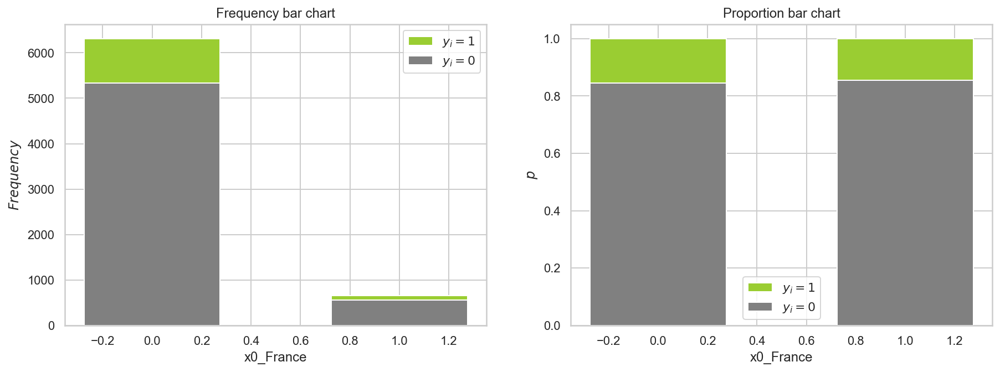

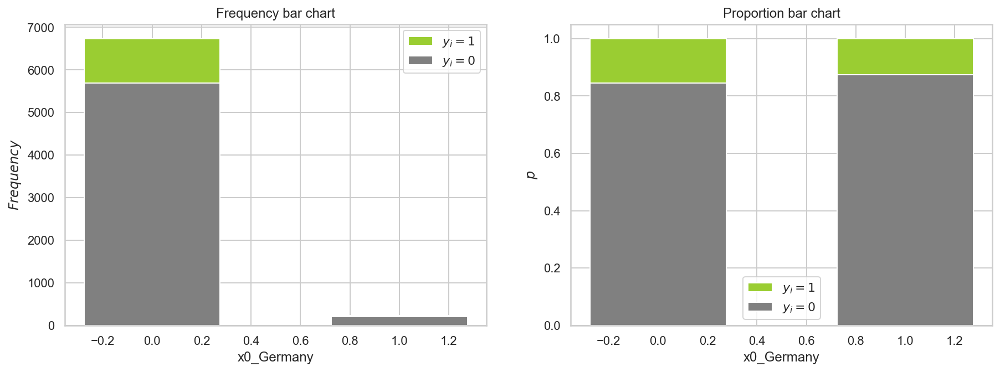

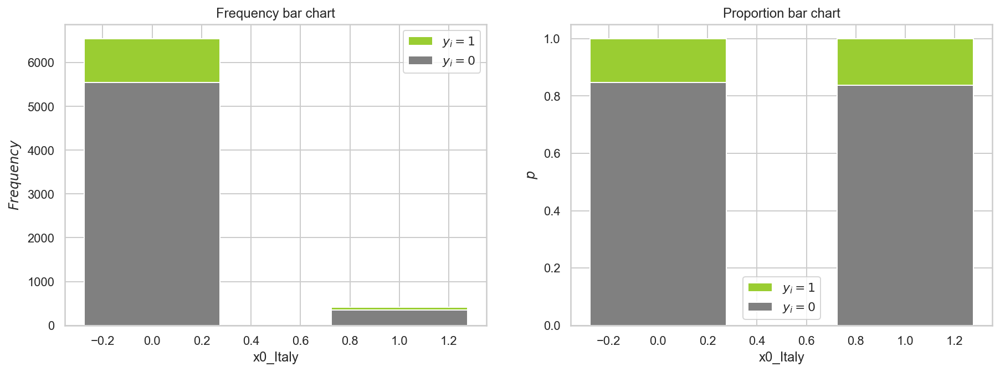

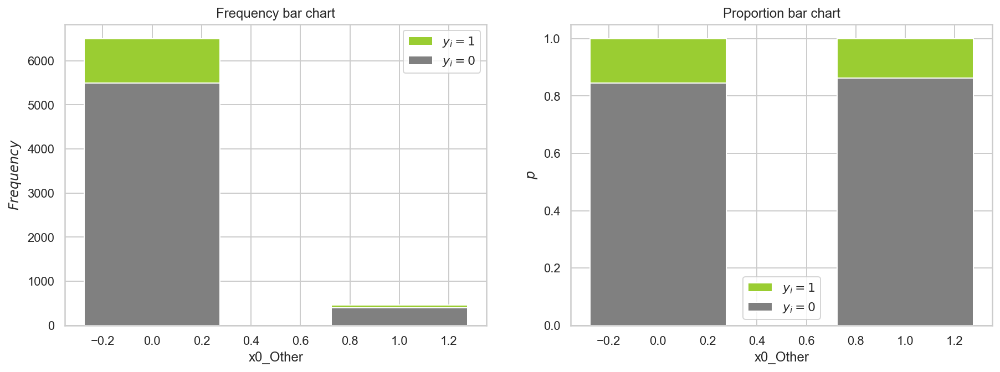

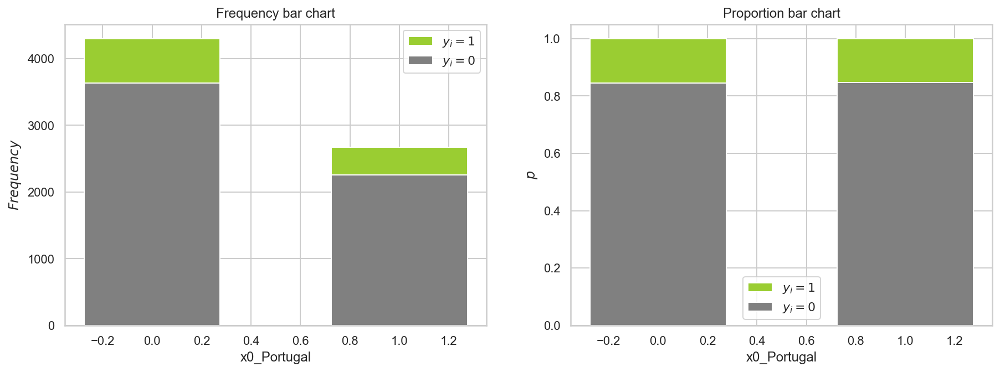

...

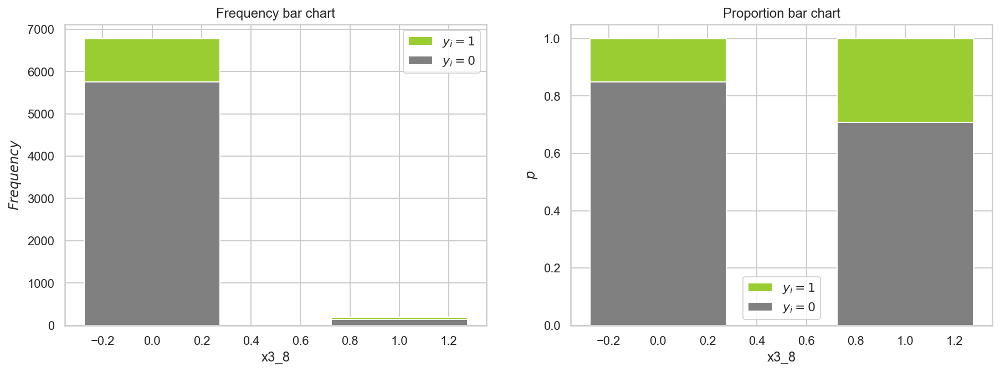

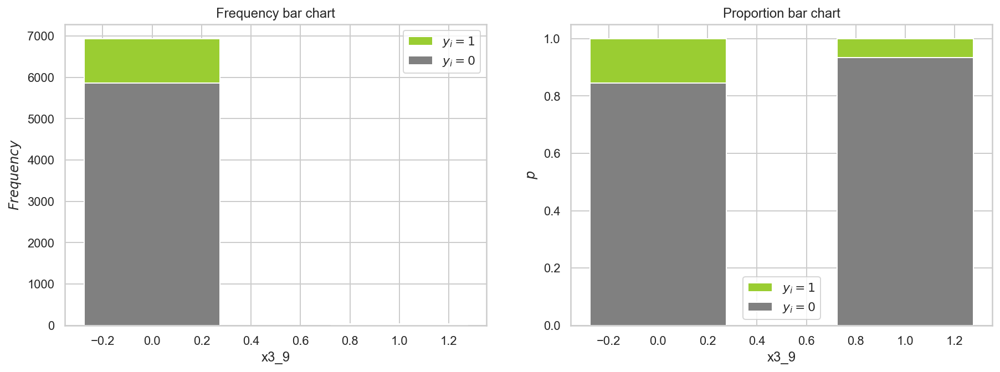

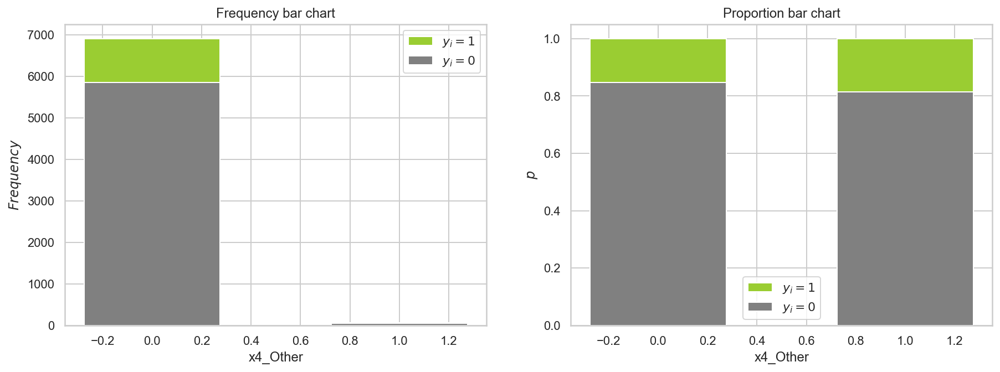

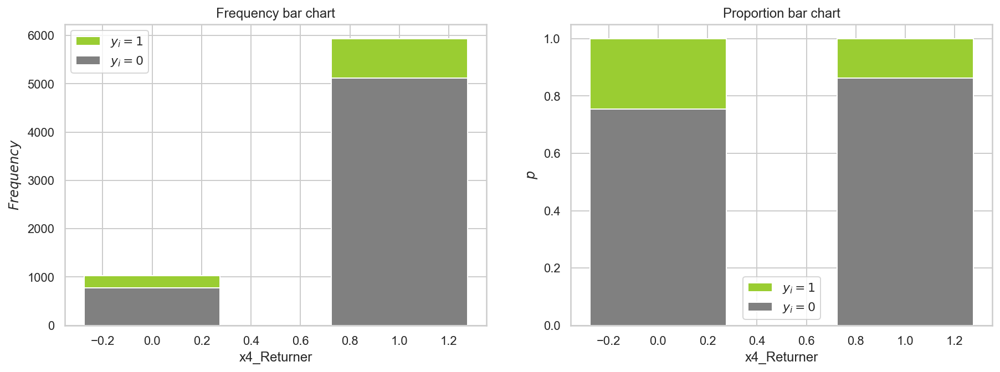

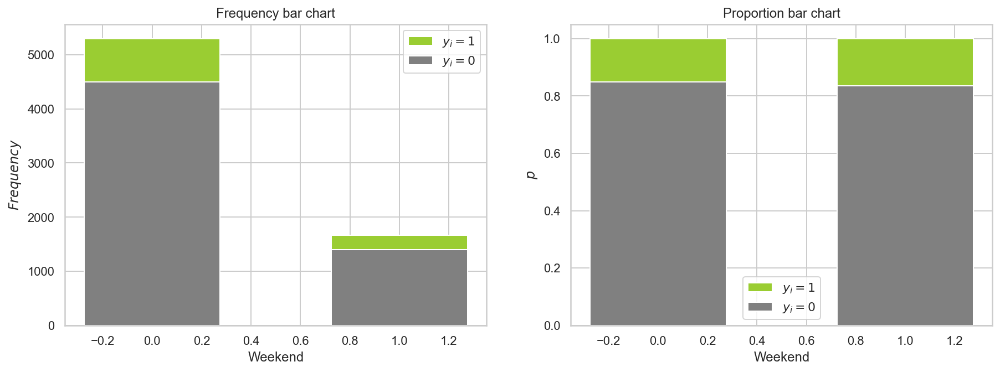

In [139]:
for i in range(len(binary_features)):
    bar_charts_categorical(all_train6, binary_features[i], "Buy",'vmout')

## 7.2. Wrapper based methods
### 7.2.1. Recursive Feature Elimination
This time we are going to apply Recursive Feature Elimination (RFE / Backwards) that will allow to select the most important features to keep. The base estimator used will be a Logistic Regression.

In [140]:
# Baseline dataset (X_train + Y_train)
nof_list=np.arange(5,X_train.shape[1])
high_score=0
# Variable to store the optimum features
nof=0           
score_list =[]
for i in range(len(nof_list)):
    model = LogisticRegression()
    rfe = RFE(model, nof_list[i])
    X_train_rfe = rfe.fit_transform(X_train,Y_train)
    X_val_rfe= rfe.transform(X_validation_RS)
    model.fit(X_train_rfe,Y_train)
    
    score = model.score(X_val_rfe,Y_validation)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[i]
        
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

rfe = RFE(LogisticRegression(), nof)
X_train_rfe = rfe.fit_transform(X_train,Y_train)
model.fit(X_train_rfe,Y_train)

selected_features = pd.Series(rfe.support_, index=X_train.columns)
selected_features

Optimum number of features: 12
Score with 12 features: 0.894667


AccountMng_Pages                   False
AccountMng_Duration                False
FAQ_Pages                          False
FAQ_Duration                       False
Product_Pages                       True
Product_Duration                   False
GoogleAnalytics_BounceRate         False
GoogleAnalytics_ExitRate            True
GoogleAnalytics_PageValue          False
Month                               True
Weekend                            False
Total_Duration                     False
Total_Pages                         True
lg10_AccountMng_Duration           False
lg10_FAQ_Duration                  False
lg10_Product_Duration               True
lg10_GoogleAnalytics_BounceRate    False
lg10_GoogleAnalytics_ExitRate      False
lg10_GoogleAnalytics_PageValue      True
lg10_Total_Duration                 True
x0_France                          False
x0_Germany                         False
x0_Italy                           False
x0_Other                           False
x0_Portugal     

In [141]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)
nof_list=np.arange(5,X_train_SM.shape[1])
high_score=0
# Variable to store the optimum features
nof=0           
score_list =[]
for i in range(len(nof_list)):
    model = LogisticRegression()
    rfe = RFE(model, nof_list[i])
    X_train_rfe = rfe.fit_transform(X_train_SM,Y_train_SM)
    X_val_rfe= rfe.transform(X_validation_RS)
    model.fit(X_train_rfe,Y_train_SM)
    
    score = model.score(X_val_rfe,Y_validation)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[i]
        
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

rfe = RFE(LogisticRegression(), nof)
X_train_rfe = rfe.fit_transform(X_train_SM,Y_train_SM)
model.fit(X_train_rfe,Y_train_SM)

selected_features = pd.Series(rfe.support_, index=X_train_SM.columns)
selected_features

Optimum number of features: 5
Score with 5 features: 0.869000


AccountMng_Pages                   False
AccountMng_Duration                False
FAQ_Pages                          False
FAQ_Duration                       False
Product_Pages                      False
Product_Duration                    True
GoogleAnalytics_BounceRate         False
GoogleAnalytics_ExitRate           False
GoogleAnalytics_PageValue          False
Month                              False
Weekend                            False
Total_Duration                      True
Total_Pages                        False
lg10_AccountMng_Duration           False
lg10_FAQ_Duration                  False
lg10_Product_Duration               True
lg10_GoogleAnalytics_BounceRate    False
lg10_GoogleAnalytics_ExitRate      False
lg10_GoogleAnalytics_PageValue      True
lg10_Total_Duration                 True
x0_France                          False
x0_Germany                         False
x0_Italy                           False
x0_Other                           False
x0_Portugal     

In [142]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)
nof_list=np.arange(5,VMOut_X_train.shape[1])
high_score=0
# Variable to store the optimum features
nof=0           
score_list =[]
for i in range(len(nof_list)):
    model = LogisticRegression()
    rfe = RFE(model, nof_list[i])
    X_train_rfe = rfe.fit_transform(VMOut_X_train,Y_train_VMOut)
    X_val_rfe= rfe.transform(X_validation_MM)
    model.fit(X_train_rfe,Y_train_VMOut)
    
    score = model.score(X_val_rfe,Y_validation)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[i]
        
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

rfe = RFE(LogisticRegression(), nof)
X_train_rfe = rfe.fit_transform(VMOut_X_train,Y_train_VMOut)
model.fit(X_train_rfe,Y_train_VMOut)

selected_features = pd.Series(rfe.support_, index=VMOut_X_train.columns)
selected_features

Optimum number of features: 18
Score with 18 features: 0.890333


AccountMng_Pages                    True
AccountMng_Duration                False
FAQ_Pages                          False
FAQ_Duration                       False
Product_Pages                       True
Product_Duration                    True
GoogleAnalytics_BounceRate          True
GoogleAnalytics_ExitRate            True
GoogleAnalytics_PageValue           True
Month                               True
Weekend                            False
Total_Duration                      True
Total_Pages                         True
lg10_AccountMng_Duration           False
lg10_FAQ_Duration                  False
lg10_Product_Duration               True
lg10_GoogleAnalytics_BounceRate    False
lg10_GoogleAnalytics_ExitRate       True
lg10_GoogleAnalytics_PageValue      True
lg10_Total_Duration                 True
x0_France                          False
x0_Germany                         False
x0_Italy                           False
x0_Other                           False
x0_Portugal     

In [143]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)
nof_list=np.arange(5,VMOut_X_train_SM.shape[1])
high_score=0
# Variable to store the optimum features
nof=0           
score_list =[]
for i in range(len(nof_list)):
    model = LogisticRegression()
    rfe = RFE(model, nof_list[i])
    X_train_rfe = rfe.fit_transform(VMOut_X_train_SM,Y_train_SM_VMOut)
    X_val_rfe= rfe.transform(X_validation_MM)
    model.fit(X_train_rfe,Y_train_SM_VMOut)
    
    score = model.score(X_val_rfe,Y_validation)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[i]
        
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

rfe = RFE(LogisticRegression(), nof)
X_train_rfe = rfe.fit_transform(VMOut_X_train_SM,Y_train_SM_VMOut)
model.fit(X_train_rfe,Y_train_SM_VMOut)

selected_features = pd.Series(rfe.support_, index=VMOut_X_train_SM.columns)
selected_features

Optimum number of features: 12
Score with 12 features: 0.889333


AccountMng_Pages                    True
AccountMng_Duration                False
FAQ_Pages                           True
FAQ_Duration                       False
Product_Pages                      False
Product_Duration                    True
GoogleAnalytics_BounceRate         False
GoogleAnalytics_ExitRate            True
GoogleAnalytics_PageValue           True
Month                               True
Weekend                            False
Total_Duration                      True
Total_Pages                         True
lg10_AccountMng_Duration           False
lg10_FAQ_Duration                  False
lg10_Product_Duration               True
lg10_GoogleAnalytics_BounceRate    False
lg10_GoogleAnalytics_ExitRate      False
lg10_GoogleAnalytics_PageValue      True
lg10_Total_Duration                 True
x0_France                          False
x0_Germany                         False
x0_Italy                           False
x0_Other                           False
x0_Portugal     

### 7.2.2. Forward Selection

In [144]:
def forward_selection(data, target, significance_level=0.05):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = smodels.OLS(target, smodels.add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<significance_level):
            best_features.append(new_pval.idxmin())
        else:
            break
    return best_features

In [145]:
# Baseline dataset (X_train + Y_train)
forward_selection(X_train,Y_train)

['GoogleAnalytics_PageValue',
 'lg10_GoogleAnalytics_PageValue',
 'Month',
 'x4_Returner',
 'Product_Pages',
 'Total_Pages',
 'x3_8',
 'lg10_GoogleAnalytics_ExitRate',
 'x3_2',
 'x3_10',
 'x3_5',
 'x3_11']

In [146]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)
forward_selection(X_train_SM,Y_train_SM)

['GoogleAnalytics_PageValue',
 'lg10_GoogleAnalytics_PageValue',
 'Month',
 'Product_Pages',
 'Weekend',
 'GoogleAnalytics_ExitRate',
 'x3_8',
 'lg10_Product_Duration',
 'lg10_Total_Duration',
 'AccountMng_Pages',
 'Total_Pages',
 'FAQ_Pages',
 'x3_2',
 'AccountMng_Duration',
 'Product_Duration',
 'x3_11',
 'GoogleAnalytics_BounceRate',
 'lg10_AccountMng_Duration',
 'x3_13',
 'x3_5',
 'x3_10',
 'x3_15',
 'x0_United Kingdom',
 'FAQ_Duration',
 'x1_Other',
 'x4_Returner',
 'lg10_GoogleAnalytics_BounceRate']

In [147]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)
forward_selection(VMOut_X_train,Y_train_VMOut)

['GoogleAnalytics_PageValue',
 'lg10_GoogleAnalytics_PageValue',
 'Month',
 'x4_Returner',
 'Product_Duration',
 'AccountMng_Pages',
 'lg10_GoogleAnalytics_ExitRate',
 'x3_8',
 'lg10_Product_Duration',
 'lg10_Total_Duration',
 'Total_Duration',
 'x3_2',
 'x3_10',
 'x3_11',
 'x2_5']

In [148]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)
forward_selection(VMOut_X_train_SM,Y_train_SM_VMOut)

['GoogleAnalytics_PageValue',
 'lg10_GoogleAnalytics_PageValue',
 'Product_Duration',
 'Month',
 'Weekend',
 'GoogleAnalytics_ExitRate',
 'lg10_Product_Duration',
 'x3_8',
 'lg10_Total_Duration',
 'AccountMng_Pages',
 'FAQ_Pages',
 'x3_2',
 'x3_11',
 'lg10_FAQ_Duration',
 'Total_Duration',
 'Total_Pages',
 'Product_Pages',
 'x3_13',
 'x3_5',
 'x3_10',
 'x3_15',
 'x0_United Kingdom',
 'lg10_GoogleAnalytics_ExitRate',
 'x4_Returner',
 'lg10_AccountMng_Duration',
 'lg10_GoogleAnalytics_BounceRate',
 'x1_Other',
 'x2_2']

### 7.2.3. Backward Selection

In [149]:
def backward_elimination(data, target,significance_level = 0.05):
    features = data.columns.tolist()
    while(len(features)>0):
        features_with_constant = smodels.add_constant(data[features])
        p_values = smodels.OLS(target, features_with_constant).fit().pvalues[1:]
        max_p_value = p_values.max()
        if(max_p_value >= significance_level):
            excluded_feature = p_values.idxmax()
            features.remove(excluded_feature)
        else:
            break 
    return features

In [150]:
# Baseline dataset (X_train + Y_train)
backward_elimination(X_train,Y_train)

['Product_Pages',
 'Product_Duration',
 'GoogleAnalytics_PageValue',
 'Month',
 'Total_Duration',
 'Total_Pages',
 'lg10_Product_Duration',
 'lg10_GoogleAnalytics_ExitRate',
 'lg10_GoogleAnalytics_PageValue',
 'lg10_Total_Duration',
 'x3_10',
 'x3_11',
 'x3_2',
 'x3_8',
 'x4_Returner']

In [151]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)
backward_elimination(X_train_SM,Y_train_SM)

['AccountMng_Pages',
 'AccountMng_Duration',
 'FAQ_Pages',
 'FAQ_Duration',
 'Product_Pages',
 'Product_Duration',
 'GoogleAnalytics_BounceRate',
 'GoogleAnalytics_ExitRate',
 'GoogleAnalytics_PageValue',
 'Month',
 'Weekend',
 'Total_Pages',
 'lg10_AccountMng_Duration',
 'lg10_Product_Duration',
 'lg10_GoogleAnalytics_BounceRate',
 'lg10_GoogleAnalytics_PageValue',
 'lg10_Total_Duration',
 'x0_France',
 'x0_Italy',
 'x0_Other',
 'x0_Portugal',
 'x0_Spain',
 'x1_Other',
 'x3_10',
 'x3_11',
 'x3_13',
 'x3_15',
 'x3_2',
 'x3_5',
 'x3_8',
 'x4_Returner']

In [152]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)
backward_elimination(VMOut_X_train,Y_train_VMOut)

['AccountMng_Pages',
 'Product_Duration',
 'GoogleAnalytics_PageValue',
 'Month',
 'Total_Duration',
 'lg10_Product_Duration',
 'lg10_GoogleAnalytics_ExitRate',
 'lg10_GoogleAnalytics_PageValue',
 'lg10_Total_Duration',
 'x2_5',
 'x3_10',
 'x3_11',
 'x3_2',
 'x3_8',
 'x4_Returner']

In [153]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)
backward_elimination(VMOut_X_train_SM,Y_train_SM_VMOut)

['AccountMng_Pages',
 'AccountMng_Duration',
 'FAQ_Pages',
 'FAQ_Duration',
 'Product_Pages',
 'Product_Duration',
 'GoogleAnalytics_BounceRate',
 'GoogleAnalytics_ExitRate',
 'GoogleAnalytics_PageValue',
 'Month',
 'Weekend',
 'Total_Duration',
 'Total_Pages',
 'lg10_Product_Duration',
 'lg10_GoogleAnalytics_BounceRate',
 'lg10_GoogleAnalytics_PageValue',
 'lg10_Total_Duration',
 'x0_United Kingdom',
 'x1_Other',
 'x2_2',
 'x3_10',
 'x3_11',
 'x3_13',
 'x3_15',
 'x3_2',
 'x3_5',
 'x3_8',
 'x4_Returner']

### 7.2.4. Stepwise Selection

In [154]:
def stepwise_selection(data, target,SL_in=0.05,SL_out = 0.05):
    initial_features = data.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = smodels.OLS(target, smodels.add_constant(data[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<SL_in):
            best_features.append(new_pval.idxmin())
            while(len(best_features)>0):
                best_features_with_constant = smodels.add_constant(data[best_features])
                p_values = smodels.OLS(target, best_features_with_constant).fit().pvalues[1:]
                max_p_value = p_values.max()
                if(max_p_value >= SL_out):
                    excluded_feature = p_values.idxmax()
                    best_features.remove(excluded_feature)
                else:
                    break 
        else:
            break
    return best_features

In [155]:
# Baseline dataset (X_train + Y_train)
stepwise_selection(X_train,Y_train)

['GoogleAnalytics_PageValue',
 'lg10_GoogleAnalytics_PageValue',
 'Month',
 'x4_Returner',
 'Product_Pages',
 'Total_Pages',
 'x3_8',
 'lg10_GoogleAnalytics_ExitRate',
 'x3_2',
 'x3_10',
 'x3_5',
 'x3_11']

In [156]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)
stepwise_selection(X_train_SM,Y_train_SM)

['GoogleAnalytics_PageValue',
 'lg10_GoogleAnalytics_PageValue',
 'Month',
 'Product_Pages',
 'Weekend',
 'GoogleAnalytics_ExitRate',
 'x3_8',
 'lg10_Product_Duration',
 'lg10_Total_Duration',
 'AccountMng_Pages',
 'Total_Pages',
 'FAQ_Pages',
 'x3_2',
 'AccountMng_Duration',
 'Product_Duration',
 'x3_11',
 'GoogleAnalytics_BounceRate',
 'lg10_AccountMng_Duration',
 'x3_13',
 'x3_5',
 'x3_10',
 'x3_15',
 'x0_United Kingdom',
 'FAQ_Duration',
 'x1_Other',
 'x4_Returner',
 'lg10_GoogleAnalytics_BounceRate']

In [157]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)
stepwise_selection(VMOut_X_train,Y_train_VMOut)

['lg10_GoogleAnalytics_PageValue',
 'Month',
 'lg10_GoogleAnalytics_ExitRate',
 'x3_8',
 'AccountMng_Pages',
 'Product_Duration',
 'x4_Returner',
 'lg10_Product_Duration',
 'lg10_Total_Duration',
 'Total_Duration',
 'x3_2',
 'x3_11',
 'x3_10',
 'GoogleAnalytics_PageValue',
 'x2_5']

In [158]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)
stepwise_selection(VMOut_X_train_SM,Y_train_SM_VMOut)

['GoogleAnalytics_PageValue',
 'lg10_GoogleAnalytics_PageValue',
 'Product_Duration',
 'Month',
 'Weekend',
 'GoogleAnalytics_ExitRate',
 'lg10_Product_Duration',
 'x3_8',
 'lg10_Total_Duration',
 'AccountMng_Pages',
 'FAQ_Pages',
 'x3_2',
 'x3_11',
 'Total_Pages',
 'Product_Pages',
 'x3_13',
 'x3_5',
 'x3_10',
 'x3_15',
 'x0_United Kingdom',
 'lg10_GoogleAnalytics_ExitRate',
 'x4_Returner',
 'AccountMng_Duration',
 'x2_2',
 'x1_Other']

## 7.3. Embedded methods
### 7.3.1. Lasso Regression

In [159]:
sns.set(style="whitegrid")
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.savefig(name+'_plot_importance.png', dpi=200)
    plt.show()

In [160]:
# Baseline dataset (X_train + Y_train)
reg = LassoCV()
reg.fit(X_train, Y_train)
coef = pd.Series(reg.coef_, index = X_train.columns)
print(coef.sort_values())

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
# The variables with the value 0 are supposedly dropped.

x4_Returner                       -0.031655
AccountMng_Pages                  -0.013877
lg10_GoogleAnalytics_ExitRate     -0.011320
GoogleAnalytics_ExitRate          -0.010126
lg10_Product_Duration             -0.008775
AccountMng_Duration               -0.003528
GoogleAnalytics_PageValue         -0.000220
FAQ_Duration                      -0.000029
FAQ_Pages                         -0.000000
x1_Windows                         0.000000
x2_2                              -0.000000
x2_4                               0.000000
x2_5                               0.000000
x2_Other                          -0.000000
x3_10                              0.000000
x3_11                              0.000000
x3_12                             -0.000000
x3_14                             -0.000000
x3_15                              0.000000
x3_3                              -0.000000
x3_4                              -0.000000
x3_5                               0.000000
x3_6                            

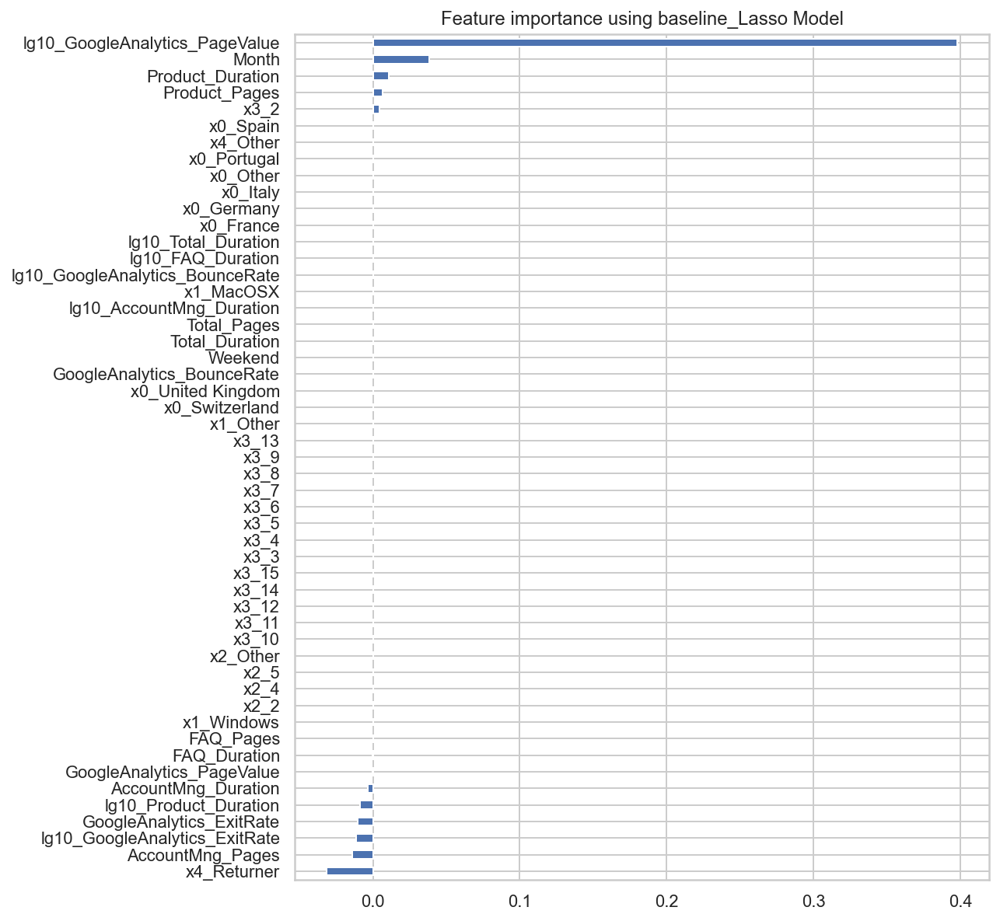

In [161]:
# Baseline
plot_importance(coef,'baseline_Lasso')

In [162]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)
reg = LassoCV()
reg.fit(X_train_SM, Y_train_SM)
coef = pd.Series(reg.coef_, index = X_train_SM.columns)
print(coef.sort_values())

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
# The variables with the value 0 are supposedly dropped.

Weekend                           -0.095875
GoogleAnalytics_PageValue         -0.063842
GoogleAnalytics_ExitRate          -0.032102
FAQ_Pages                         -0.031356
lg10_Product_Duration             -0.024994
AccountMng_Pages                  -0.020814
lg10_GoogleAnalytics_BounceRate   -0.009420
AccountMng_Duration               -0.006071
x4_Returner                       -0.000418
FAQ_Duration                      -0.000184
x1_Other                          -0.000000
x2_2                              -0.000000
x2_4                               0.000000
x2_5                               0.000000
x2_Other                          -0.000000
x3_10                              0.000000
x3_11                              0.000000
x3_12                             -0.000000
x3_13                             -0.000000
x3_14                             -0.000000
x3_15                              0.000000
x3_3                              -0.000000
x3_4                            

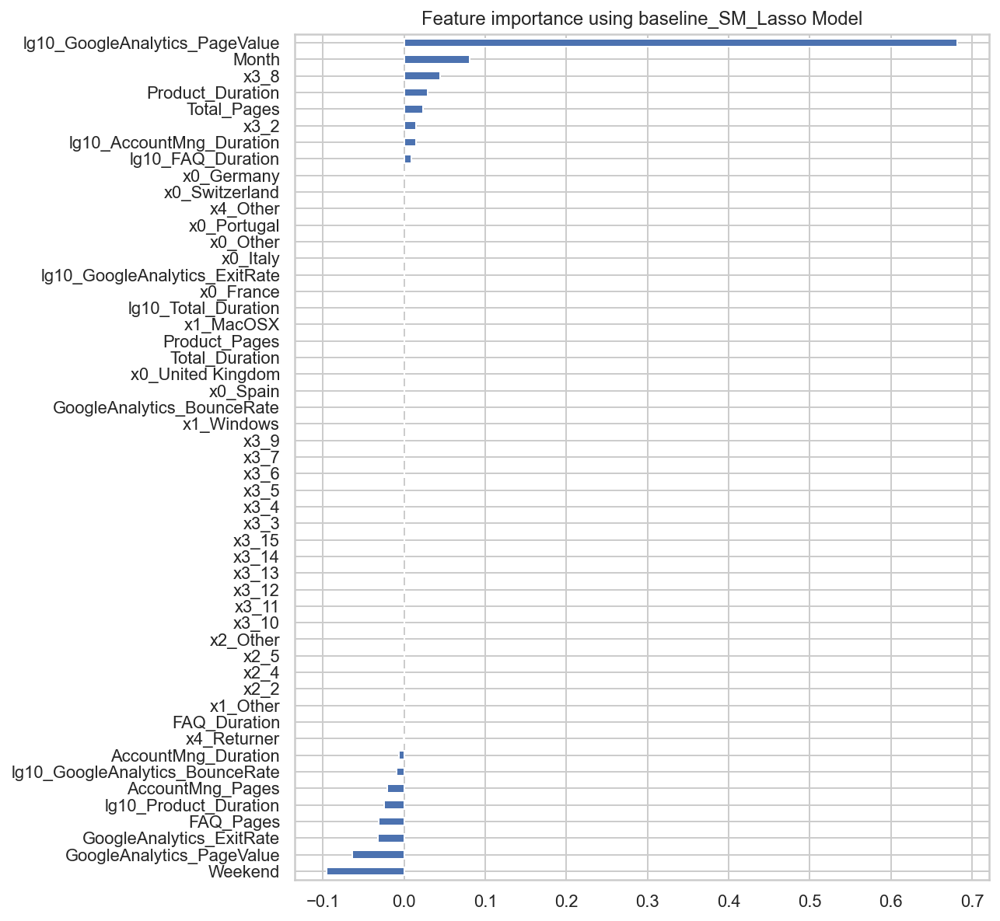

In [163]:
# Baseline with SMOTE
plot_importance(coef,'baseline_SM_Lasso')

In [164]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)
reg = LassoCV()
reg.fit(VMOut_X_train, Y_train_VMOut)
coef = pd.Series(reg.coef_, index = VMOut_X_train.columns)
print(coef.sort_values())

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
# The variables with the value 0 are supposedly dropped.

lg10_Product_Duration             -0.528127
AccountMng_Pages                  -0.136322
lg10_GoogleAnalytics_ExitRate     -0.082875
GoogleAnalytics_PageValue         -0.076464
GoogleAnalytics_ExitRate          -0.072534
AccountMng_Duration               -0.061881
FAQ_Pages                         -0.051849
x4_Other                          -0.037295
x4_Returner                       -0.035407
x1_Other                          -0.019389
lg10_FAQ_Duration                 -0.018078
x0_United Kingdom                 -0.013692
lg10_AccountMng_Duration          -0.009387
x0_Germany                        -0.008660
x1_MacOSX                         -0.007332
FAQ_Duration                      -0.007267
x3_13                             -0.006303
x2_Other                          -0.004002
x2_2                              -0.002745
x1_Windows                        -0.001530
x3_4                              -0.000139
x3_14                             -0.000000
x0_Switzerland                  

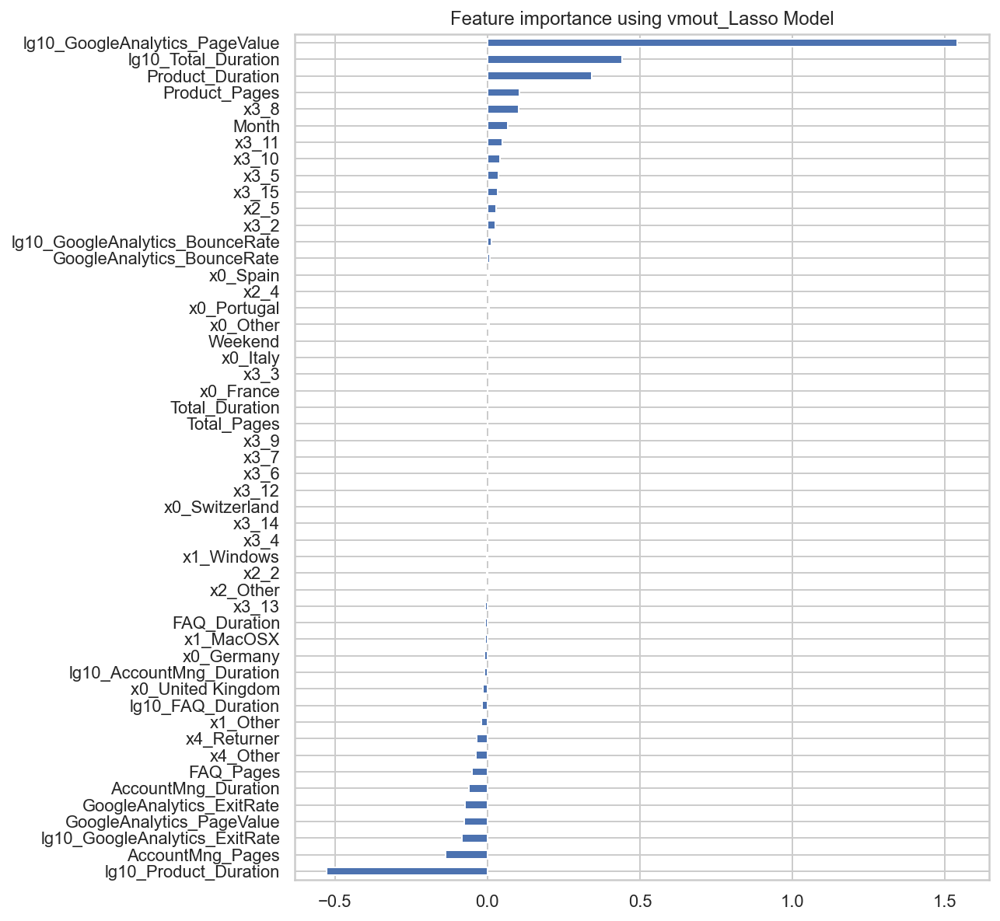

In [165]:
# Outliers & Coherence Checks
plot_importance(coef,'vmout_Lasso')

In [166]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)
reg = LassoCV()
reg.fit(VMOut_X_train_SM, Y_train_SM_VMOut)
coef = pd.Series(reg.coef_, index = VMOut_X_train_SM.columns)
print(coef.sort_values())

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")
# The variables with the value 0 are supposedly dropped.

lg10_Product_Duration             -1.517270
GoogleAnalytics_PageValue         -1.027165
FAQ_Pages                         -0.535768
GoogleAnalytics_ExitRate          -0.270305
AccountMng_Pages                  -0.250825
AccountMng_Duration               -0.205492
FAQ_Duration                      -0.166416
Weekend                           -0.119719
x4_Other                          -0.058057
x3_13                             -0.040050
lg10_GoogleAnalytics_BounceRate   -0.038648
x1_Other                          -0.033267
x0_United Kingdom                 -0.030976
x4_Returner                       -0.030017
x3_12                             -0.029731
x3_14                             -0.021438
x2_Other                          -0.016803
lg10_GoogleAnalytics_ExitRate     -0.016644
x2_2                              -0.014387
x3_6                              -0.011579
x0_Germany                        -0.011469
x0_Switzerland                    -0.010186
x1_Windows                      

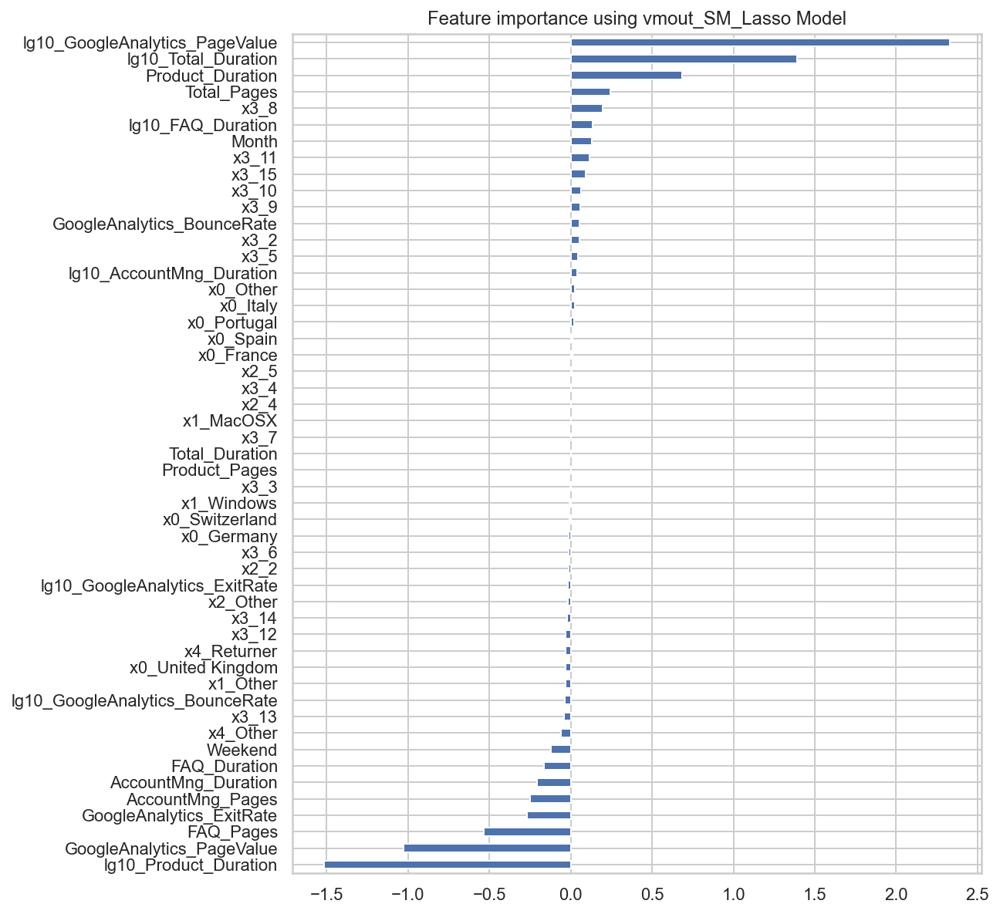

In [167]:
# Outliers & Coherence Checks with SMOTE
plot_importance(coef,'vmout_SM_Lasso')

### 7.3.2. Ridge Regression

In [168]:
# Baseline dataset (X_train + Y_train)

# With a minor C, the less probability there is for overfitting to happen.
sel_ = SelectFromModel(LogisticRegression(C = 1, penalty='l2', solver='liblinear'))
sel_.fit(X_train, np.ravel(Y_train,order='C'))
sel_.get_support()

selected_feat = X_train.columns[(sel_.get_support())]
print('total features: {}'.format((X_train.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_.estimator_.coef_ == 0)))
print(selected_feat)

total features: 51
selected features: 15
features with coefficients shrank to zero: 0
Index(['GoogleAnalytics_ExitRate', 'Month', 'lg10_Product_Duration',
       'lg10_GoogleAnalytics_PageValue', 'lg10_Total_Duration', 'x1_Other',
       'x2_5', 'x3_10', 'x3_11', 'x3_12', 'x3_15', 'x3_2', 'x3_5', 'x3_8',
       'x4_Returner'],
      dtype='object')


In [169]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)

# With a minor C, the less probability there is for overfitting to happen.
sel_ = SelectFromModel(LogisticRegression(C = 1, penalty='l2', solver='liblinear'))
sel_.fit(X_train_SM, np.ravel(Y_train_SM,order='C'))
sel_.get_support()

selected_feat = X_train_SM.columns[(sel_.get_support())]
print('total features: {}'.format((X_train_SM.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_.estimator_.coef_ == 0)))
print(selected_feat)

total features: 51
selected features: 12
features with coefficients shrank to zero: 0
Index(['AccountMng_Pages', 'Product_Pages', 'Month', 'Weekend', 'Total_Pages',
       'lg10_Product_Duration', 'lg10_GoogleAnalytics_PageValue',
       'lg10_Total_Duration', 'x3_11', 'x3_12', 'x3_15', 'x3_8'],
      dtype='object')


In [170]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)

# With a minor C, the less probability there is for overfitting to happen.
sel_ = SelectFromModel(LogisticRegression(C = 1, penalty='l2', solver='liblinear'))
sel_.fit(VMOut_X_train, np.ravel(Y_train_VMOut,order='C'))
sel_.get_support()

selected_feat = VMOut_X_train.columns[(sel_.get_support())]
print('total features: {}'.format((VMOut_X_train.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_.estimator_.coef_ == 0)))
print(selected_feat)

total features: 51
selected features: 12
features with coefficients shrank to zero: 0
Index(['AccountMng_Pages', 'Product_Duration', 'GoogleAnalytics_BounceRate',
       'GoogleAnalytics_ExitRate', 'Month', 'Total_Duration',
       'lg10_Product_Duration', 'lg10_GoogleAnalytics_ExitRate',
       'lg10_GoogleAnalytics_PageValue', 'lg10_Total_Duration', 'x3_11',
       'x3_8'],
      dtype='object')


In [171]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)

# With a minor C, the less probability there is for overfitting to happen.
sel_ = SelectFromModel(LogisticRegression(C = 1, penalty='l2', solver='liblinear'))
sel_.fit(VMOut_X_train_SM, np.ravel(Y_train_SM_VMOut,order='C'))
sel_.get_support()

selected_feat = VMOut_X_train_SM.columns[(sel_.get_support())]
print('total features: {}'.format((VMOut_X_train_SM.shape[1])))
print('selected features: {}'.format(len(selected_feat)))
print('features with coefficients shrank to zero: {}'.format(
np.sum(sel_.estimator_.coef_ == 0)))
print(selected_feat)

total features: 51
selected features: 15
features with coefficients shrank to zero: 0
Index(['AccountMng_Pages', 'AccountMng_Duration', 'FAQ_Pages', 'FAQ_Duration',
       'Product_Duration', 'GoogleAnalytics_ExitRate',
       'GoogleAnalytics_PageValue', 'Month', 'Weekend', 'Total_Duration',
       'Total_Pages', 'lg10_Product_Duration',
       'lg10_GoogleAnalytics_PageValue', 'lg10_Total_Duration', 'x3_8'],
      dtype='object')


### 7.3.3. Decision Tree - Feature Importance

<AxesSubplot:xlabel='Value', ylabel='Col'>

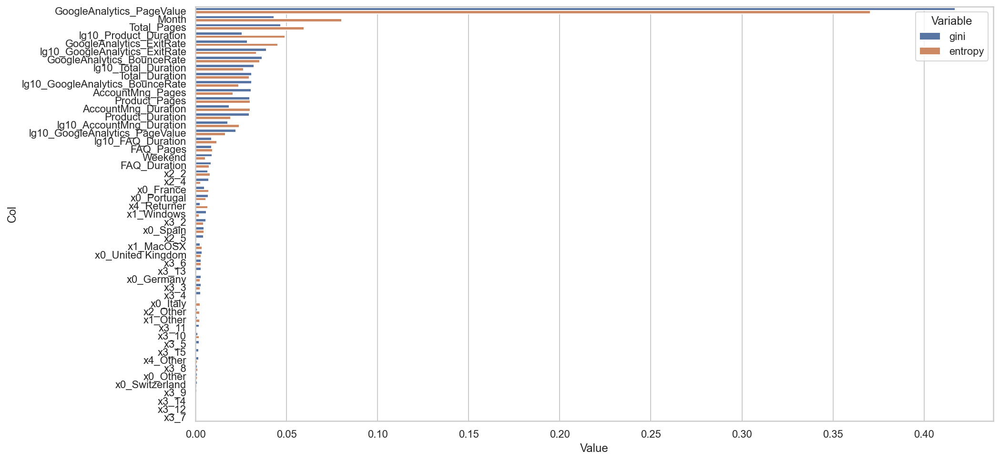

In [172]:
# Baseline dataset (X_train + Y_train)

sns.set(style="whitegrid")

gini_importance = DecisionTreeClassifier().fit(X_train, Y_train).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(X_train, Y_train).feature_importances_

zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = X_train.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

# We would select the top 16 features in the graph.

<AxesSubplot:xlabel='Value', ylabel='Col'>

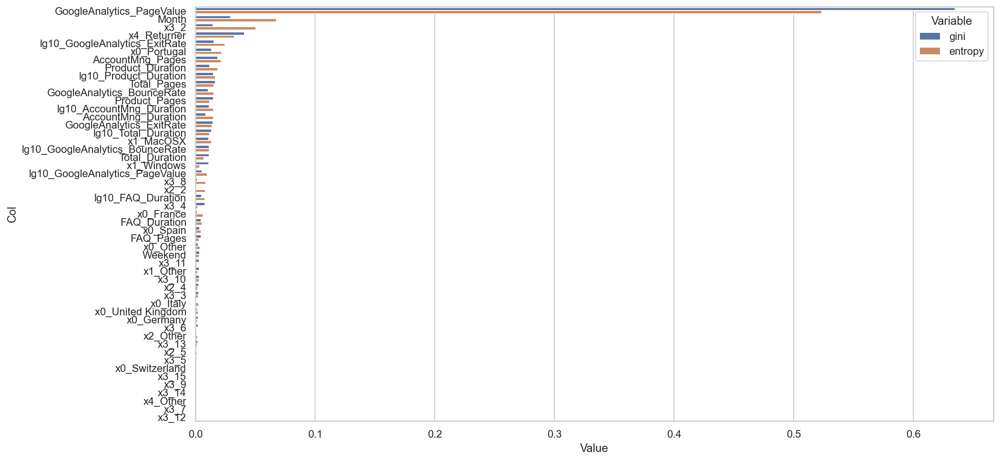

In [173]:
# Baseline with SMOTE dataset (X_train_SM + Y_train_SM)

sns.set(style="whitegrid")

gini_importance = DecisionTreeClassifier().fit(X_train_SM, Y_train_SM).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(X_train_SM, Y_train_SM).feature_importances_

zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = X_train_SM.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

# We would select the top 18 features in the graph.

<AxesSubplot:xlabel='Value', ylabel='Col'>

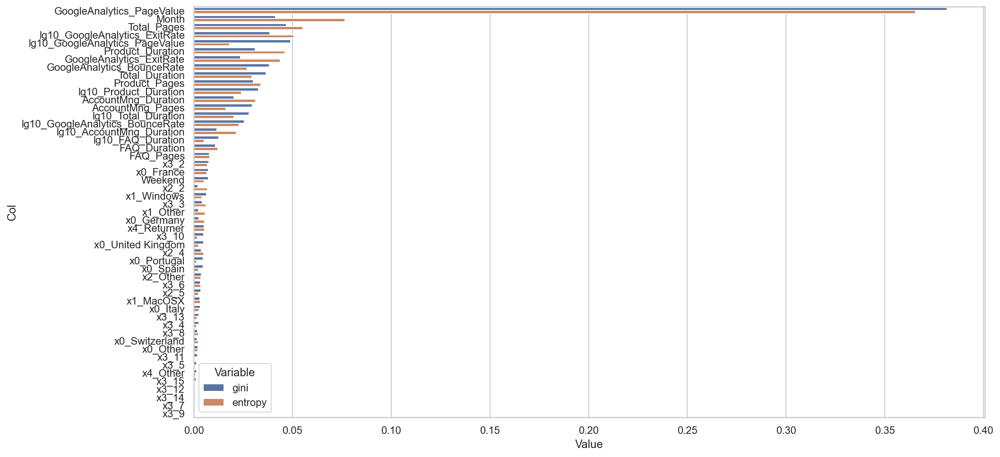

In [174]:
# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut)

sns.set(style="whitegrid")

gini_importance = DecisionTreeClassifier().fit(VMOut_X_train, Y_train_VMOut).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(VMOut_X_train, Y_train_VMOut).feature_importances_

zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = VMOut_X_train.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

# We would select the top 15 features in the graph.

<AxesSubplot:xlabel='Value', ylabel='Col'>

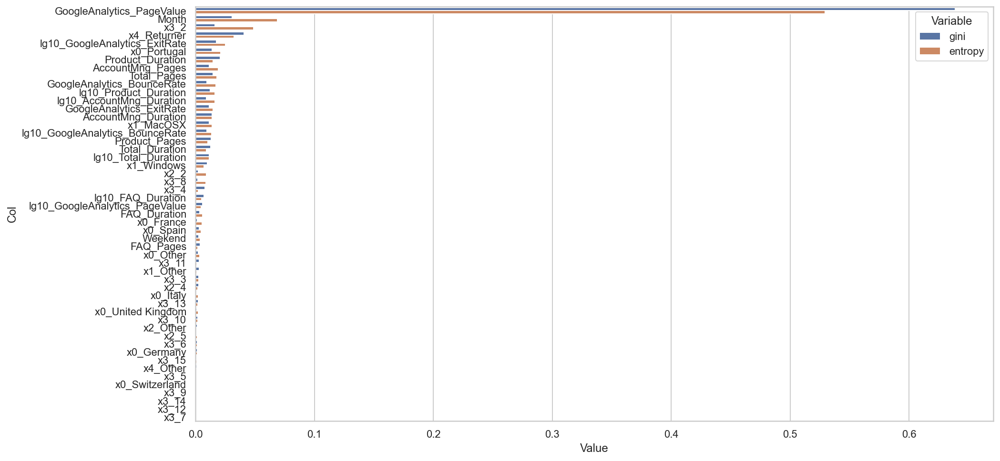

In [175]:
# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut)

sns.set(style="whitegrid")

gini_importance = DecisionTreeClassifier().fit(VMOut_X_train_SM, Y_train_SM_VMOut).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(VMOut_X_train_SM, Y_train_SM_VMOut).feature_importances_

zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = VMOut_X_train_SM.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

# We would select the top 10 features in the graph.

# 8. Modelling

##### Available Datasets for Modeling

| To train the model (X) | To train the model (Y) | To validate the model (X) | To validate the model (Y) | To test the model | SMOTE | Incoherences checked | Outliers Removed | Standardization Method |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| X_train | Y_train | X_validation_RS | Y_validation | test_RS | No | No | No | Robust Scaler |
| X_train_SM | Y_train_SM | X_validation_RS | Y_validation | test_RS | Yes | No | No | Robust Scaler |
| VMOut_X_train | Y_train_VMOut | X_validation_MM | Y_validation | test_MM | No | Yes | Yes | MinMax |
| VMOut_X_train_SM | Y_train_SM_VMOut | X_validation_MM | Y_validation | test_MM | Yes | Yes | Yes | MinMax |

##### Available Sets of Variables for Modeling

| Baseline dataset (X_train + Y_train) - SET 1 | Baseline dataset (X_train + Y_train) - SET 2 | Baseline with SMOTE dataset (X_train_SM + Y_train_SM) - SET 1 | Baseline with SMOTE dataset (X_train_SM + Y_train_SM) - SET 2 | Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut) - SET 1 | Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut) - SET 2 | Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut) - SET 1 | Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut) - SET 2 |
| --- | --- | --- | --- | --- | --- | --- | --- |
| x4_Returner | x4_Returner | AccountMng_Pages | AccountMng_Duration | AccountMng_Pages | AccountMng_Pages | AccountMng_Pages | AccountMng_Pages |
| x3_8 | lg10_GoogleAnalytics_ExitRate | AccountMng_Duration | GoogleAnalytics_ExitRate | x3_8 | GoogleAnalytics_PageValue | FAQ_Pages | FAQ_Pages |
| Product_Pages | GoogleAnalytics_PageValue | Product_Pages | GoogleAnalytics_PageValue | Product_Duration | Month | Product_Duration | Product_Duration |
| x3_2 | Month | Product_Duration | Month | lg10_GoogleAnalytics_ExitRate | x3_8 | GoogleAnalytics_ExitRate | GoogleAnalytics_ExitRate |
| lg10_GoogleAnalytics_ExitRate | Total_Pages | GoogleAnalytics_ExitRate | lg10_Product_Duration | GoogleAnalytics_PageValue | lg10_Product_Duration | GoogleAnalytics_PageValue | GoogleAnalytics_PageValue |
| GoogleAnalytics_PageValue | x3_2 | GoogleAnalytics_PageValue | lg10_GoogleAnalytics_BounceRate | Month | lg10_GoogleAnalytics_ExitRate | Month | Month |
| Month | x3_8 | Month |     | Total_Duration |    | Total_Pages |    |
| Total_Pages |     | Total_Pages |    | lg10_GoogleAnalytics_PageValue |    | lg10_Product_Duration |    |
| lg10_Product_Duration |     | lg10_AccountMng_Duration |     | lg10_Total_Duration |    | lg10_GoogleAnalytics_PageValue |    |
| lg10_GoogleAnalytics_PageValue |     | lg10_Product_Duration |     | lg10_Product_Duration |    | lg10_Total_Duration |    |
|    |     | lg10_GoogleAnalytics_BounceRate |    |    |    |     |     |
|    |     | lg10_GoogleAnalytics_PageValue |    |    |    |     |    |
|    |     | lg10_Total_Duration |    |    |     |    |    |

In [176]:
# Baseline dataset (X_train + Y_train) - SET 1
B1_S1_train = X_train[["x4_Returner", "x3_8", "Product_Pages", "x3_2", "lg10_GoogleAnalytics_ExitRate", "Month",
                       "Total_Pages", "GoogleAnalytics_PageValue", "lg10_Product_Duration", "lg10_GoogleAnalytics_PageValue"]]
B1_S1_validation = X_validation_RS[["x4_Returner", "x3_8", "Product_Pages", "x3_2", "lg10_GoogleAnalytics_ExitRate", "Month",
                                    "Total_Pages", "GoogleAnalytics_PageValue", "lg10_Product_Duration",
                                    "lg10_GoogleAnalytics_PageValue"]]
B1_S1_test = test_RS[["x4_Returner", "x3_8", "Product_Pages", "x3_2", "lg10_GoogleAnalytics_ExitRate", "Month", "Total_Pages",
                      "GoogleAnalytics_PageValue", "lg10_Product_Duration", "lg10_GoogleAnalytics_PageValue"]]


# Baseline dataset (X_train + Y_train) - SET 2
B1_S2_train = X_train[["x4_Returner", "lg10_GoogleAnalytics_ExitRate", "Month", "Total_Pages", "GoogleAnalytics_PageValue", 
                       "x3_2", "x3_8"]]
B1_S2_validation = X_validation_RS[["x4_Returner", "lg10_GoogleAnalytics_ExitRate", "Month", "Total_Pages",
                                    "GoogleAnalytics_PageValue", "x3_2", "x3_8"]]
B1_S2_test = test_RS[["x4_Returner", "lg10_GoogleAnalytics_ExitRate", "Month", "Total_Pages", "GoogleAnalytics_PageValue",
                      "x3_2", "x3_8"]]


# Baseline with SMOTE dataset (X_train_SM + Y_train_SM) - SET 1
B2_S1_train = X_train_SM[["AccountMng_Pages", "AccountMng_Duration", "Product_Pages", "Product_Duration",
                          "GoogleAnalytics_ExitRate", "GoogleAnalytics_PageValue", "lg10_AccountMng_Duration", "Month", 
                          "Total_Pages", "lg10_Product_Duration", "lg10_GoogleAnalytics_PageValue",
                          "lg10_GoogleAnalytics_BounceRate", "lg10_Total_Duration"]]
B2_S1_validation = X_validation_RS[["AccountMng_Pages", "AccountMng_Duration", "Product_Pages", "Product_Duration",
                          "GoogleAnalytics_ExitRate", "GoogleAnalytics_PageValue", "lg10_AccountMng_Duration", "Month", 
                          "Total_Pages", "lg10_Product_Duration", "lg10_GoogleAnalytics_PageValue",
                          "lg10_GoogleAnalytics_BounceRate", "lg10_Total_Duration"]]
B2_S1_test = test_RS[["AccountMng_Pages", "AccountMng_Duration", "Product_Pages", "Product_Duration",
                          "GoogleAnalytics_ExitRate", "GoogleAnalytics_PageValue", "lg10_AccountMng_Duration", "Month", 
                          "Total_Pages", "lg10_Product_Duration", "lg10_GoogleAnalytics_PageValue",
                          "lg10_GoogleAnalytics_BounceRate", "lg10_Total_Duration"]]


# Baseline with SMOTE dataset (X_train_SM + Y_train_SM) - SET 2
B2_S2_train = X_train_SM[["AccountMng_Duration", "GoogleAnalytics_ExitRate", "GoogleAnalytics_PageValue", "Month", 
                          "lg10_Product_Duration", "lg10_GoogleAnalytics_BounceRate"]]
B2_S2_validation = X_validation_RS[["AccountMng_Duration", "GoogleAnalytics_ExitRate", "GoogleAnalytics_PageValue", "Month", 
                                    "lg10_Product_Duration", "lg10_GoogleAnalytics_BounceRate"]]
B2_S2_test = test_RS[["AccountMng_Duration", "GoogleAnalytics_ExitRate", "GoogleAnalytics_PageValue", "Month",
                      "lg10_Product_Duration", "lg10_GoogleAnalytics_BounceRate"]]


# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut) - SET 1
OutCC1_S1_train = VMOut_X_train[["AccountMng_Pages", "x3_8", "Product_Duration", "lg10_GoogleAnalytics_ExitRate",
                                 "GoogleAnalytics_PageValue", "Month", "Total_Duration", "lg10_Total_Duration",
                                 "lg10_GoogleAnalytics_PageValue", "lg10_Product_Duration"]]
OutCC1_S1_validation = X_validation_MM[["AccountMng_Pages", "x3_8", "Product_Duration", "lg10_GoogleAnalytics_ExitRate",
                                 "GoogleAnalytics_PageValue", "Month", "Total_Duration", "lg10_Total_Duration",
                                 "lg10_GoogleAnalytics_PageValue", "lg10_Product_Duration"]]
OutCC1_S1_test = test_MM[["AccountMng_Pages", "x3_8", "Product_Duration", "lg10_GoogleAnalytics_ExitRate",
                          "GoogleAnalytics_PageValue", "Month", "Total_Duration", "lg10_Total_Duration",
                          "lg10_GoogleAnalytics_PageValue", "lg10_Product_Duration"]]


# Outliers & Coherence Checks dataset (VMOut_X_train + Y_train_VMOut) - SET 2
OutCC1_S2_train = VMOut_X_train[["AccountMng_Pages", "GoogleAnalytics_PageValue", "Month", "x3_8", "lg10_Product_Duration",
                                "lg10_GoogleAnalytics_ExitRate"]]
OutCC1_S2_validation = X_validation_MM[["AccountMng_Pages", "GoogleAnalytics_PageValue", "Month", "x3_8", "lg10_Product_Duration",
                                "lg10_GoogleAnalytics_ExitRate"]]
OutCC1_S2_test = test_MM[["AccountMng_Pages", "GoogleAnalytics_PageValue", "Month", "x3_8", "lg10_Product_Duration",
                                "lg10_GoogleAnalytics_ExitRate"]]


# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut) - SET 1
OutCC2_S1_train = VMOut_X_train_SM[["AccountMng_Pages", "FAQ_Pages", "Product_Duration", "GoogleAnalytics_ExitRate",
                                    "GoogleAnalytics_PageValue", "Month", "Total_Pages", "lg10_Product_Duration",
                                    "lg10_GoogleAnalytics_PageValue", "lg10_Total_Duration"]]
OutCC2_S1_validation = X_validation_MM[["AccountMng_Pages", "FAQ_Pages", "Product_Duration", "GoogleAnalytics_ExitRate",
                                    "GoogleAnalytics_PageValue", "Month", "Total_Pages", "lg10_Product_Duration",
                                    "lg10_GoogleAnalytics_PageValue", "lg10_Total_Duration"]]
OutCC2_S1_test = test_MM[["AccountMng_Pages", "FAQ_Pages", "Product_Duration", "GoogleAnalytics_ExitRate",
                                    "GoogleAnalytics_PageValue", "Month", "Total_Pages", "lg10_Product_Duration",
                                    "lg10_GoogleAnalytics_PageValue", "lg10_Total_Duration"]]


# Outliers & Coherence Checks with SMOTE dataset (VMOut_X_train_SM + Y_train_SM_VMOut) - SET 2
OutCC2_S2_train = VMOut_X_train_SM[["AccountMng_Pages", "FAQ_Pages", "Product_Duration", "GoogleAnalytics_ExitRate",
                                    "GoogleAnalytics_PageValue", "Month"]]
OutCC2_S2_validation = X_validation_MM[["AccountMng_Pages", "FAQ_Pages", "Product_Duration", "GoogleAnalytics_ExitRate",
                                    "GoogleAnalytics_PageValue", "Month"]]
OutCC2_S2_test = test_MM[["AccountMng_Pages", "FAQ_Pages", "Product_Duration", "GoogleAnalytics_ExitRate",
                                    "GoogleAnalytics_PageValue", "Month"]]

##### Auxiliary Fuctions for Model Accessment

In [177]:
def metrics(y_train1, pred_train1, y_val1, pred_val1):
    print('_____________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train1, pred_train1))
    print(confusion_matrix(y_train1, pred_train1)) #true neg and true pos, false positives and false neg
    print('____________________________________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val1, pred_val1))
    print(confusion_matrix(y_val1, pred_val1))

In [178]:
def avg_score(model, X_train3, X_validation3, y_validation3, y_train3):
    method = RepeatedKFold(n_splits=4, n_repeats=8, random_state = 42)
    
    y_all = y_train3.append(y_validation3)
    X_all = pd.concat([X_train3, X_validation3])

    score_train = []
    score_validation = []

    for train_index, test_index in method.split(X_all):
        X_train2, X_validation2 = X_all.iloc[train_index], X_all.iloc[test_index]
        y_train2, y_validation2 = y_all.iloc[train_index], y_all.iloc[test_index]
        fitted_model = model.fit(X_train2, y_train2)
        value_train = fitted_model.score(X_train2, y_train2)
        value_validation = fitted_model.score(X_validation2, y_validation2)
        score_train.append(value_train)
        score_validation.append(value_validation)

    print('TRAIN')
    print('Mean:', np.mean(score_train))
    print('Standard Deviation:', np.std(score_train))
    print('VALIDATION')
    print('Mean:', np.mean(score_validation))
    print('Standard Deviation:', np.std(score_validation))

In [179]:
def avg_score_train(model, X_train4, X_validation4, y_validation4, y_train4):
    method = RepeatedKFold(n_splits=4, n_repeats=8, random_state = 42)
    
    y_all1 = y_train4.append(y_validation4)
    X_all1 = pd.concat([X_train4, X_validation4])

    score_train = []
    
    for train_index, test_index in method.split(X_all1):
        X_train5, X_validation5 = X_all1.iloc[train_index], X_all1.iloc[test_index]
        y_train5, y_validation5 = y_all1.iloc[train_index], y_all1.iloc[test_index]
        fitted_model = model.fit(X_train5, y_train5)
        value_train = fitted_model.score(X_train5, y_train5)
        score_train.append(value_train)    
    
    return np.mean(score_train)

In [180]:
def avg_score_validation(model, X_train6, X_validation6, y_validation6, y_train6):
    method = RepeatedKFold(n_splits=4, n_repeats=8, random_state = 42)
    
    y_all2 = y_train6.append(y_validation6)
    X_all2 = pd.concat([X_train6, X_validation6])

    score_validation = []

    for train_index, test_index in method.split(X_all2):
        X_train7, X_validation7 = X_all2.iloc[train_index], X_all2.iloc[test_index]
        y_train7, y_validation7 = y_all2.iloc[train_index], y_all2.iloc[test_index]
        fitted_model = model.fit(X_train7, y_train7)
        value_validation = fitted_model.score(X_validation7, y_validation7)
        score_validation.append(value_validation)
    
    return np.mean(score_validation)

## 8.1. Logistic Regression

In [181]:
best_lr = LogisticRegression(random_state = 42)
best_lr.fit(OutCC2_S1_train, Y_train_SM_VMOut)

labels_best_lr_train = best_lr.predict(OutCC2_S1_train)
labels_best_lr_val = best_lr.predict(OutCC2_S1_validation)

avg_score(best_lr, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_SM_VMOut, labels_best_lr_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_lr_val))
print('\nKaggle Score: 0.66666')

TRAIN
Mean: 0.8613332429746091
Standard Deviation: 0.0017587702438167563
VALIDATION
Mean: 0.8608616833830306
Standard Deviation: 0.005416113785482318

F1 Score to the Train dataset: 0.8530637580916911
F1 Score to the Validation dataset: 0.6626626626626627

Kaggle Score: 0.66666


## 8.2. Multi-Layer Perceptron

In [182]:
model_1 = MLPClassifier(hidden_layer_sizes=(1),random_state=42) #este
model_2 = MLPClassifier(hidden_layer_sizes=(5),random_state=42) #este
model_3 = MLPClassifier(hidden_layer_sizes=(10),random_state=42)
model_4 = MLPClassifier(hidden_layer_sizes=(3, 3),random_state=42)
model_5 = MLPClassifier(hidden_layer_sizes=(5, 5),random_state=42) #este
model_6 = MLPClassifier(hidden_layer_sizes=(3, 3, 3),random_state=42)
model_7 = MLPClassifier(hidden_layer_sizes=(10, 10, 10),random_state=42)
model_8 = MLPClassifier(hidden_layer_sizes=(20, 30, 20),random_state=42)

In [183]:
l = [model_1, model_2, model_3, model_4, model_5, model_6, model_7, model_8]
for model in l:
    print(avg_score(model, B1_S1_train, B1_S1_validation, Y_validation, Y_train))

TRAIN
Mean: 0.8916975207805485
Standard Deviation: 0.0016177894784233254
VALIDATION
Mean: 0.8913391756702681
Standard Deviation: 0.004101168429271714
None
TRAIN
Mean: 0.8940852724807752
Standard Deviation: 0.0015705085212265866
VALIDATION
Mean: 0.8928271158463386
Standard Deviation: 0.004490551457190793
None
TRAIN
Mean: 0.896243856403076
Standard Deviation: 0.002296377175593195
VALIDATION
Mean: 0.8933646158463384
Standard Deviation: 0.004720492902102754
None
TRAIN
Mean: 0.8819841334400143
Standard Deviation: 0.008222691181671352
VALIDATION
Mean: 0.8808006702681073
Standard Deviation: 0.009415111314948278
None
TRAIN
Mean: 0.9015609853536027
Standard Deviation: 0.0016233626775635315
VALIDATION
Mean: 0.8978149209683873
Standard Deviation: 0.004715228040404131
None
TRAIN
Mean: 0.8896348918744721
Standard Deviation: 0.005003936811532627
VALIDATION
Mean: 0.8871763705482193
Standard Deviation: 0.006638626202767463
None
TRAIN
Mean: 0.9031694759301241
Standard Deviation: 0.0019872503981288826
V

In [184]:
model_a = MLPClassifier(learning_rate_init = 0.5,random_state=42) #ESTE
model_b = MLPClassifier(learning_rate_init = 0.1,random_state=42)
model_c = MLPClassifier(learning_rate_init = 0.01,random_state=42) 
model_d = MLPClassifier(learning_rate_init = 0.001,random_state=42) #ESTE
m = [model_a, model_b, model_c, model_d]
for model in m:
    print(avg_score(model, B1_S1_train, B1_S1_validation, Y_validation, Y_train))

TRAIN
Mean: 0.8651155398497578
Standard Deviation: 0.011478924220020038
VALIDATION
Mean: 0.8636871398559424
Standard Deviation: 0.014130114111088738
None
TRAIN
Mean: 0.8948227919278126
Standard Deviation: 0.0047643907694182655
VALIDATION
Mean: 0.891964505802321
Standard Deviation: 0.005812705110648247
None
TRAIN
Mean: 0.9083824837756146
Standard Deviation: 0.003482837106325511
VALIDATION
Mean: 0.8977648759503802
Standard Deviation: 0.005107141917892224
None
TRAIN
Mean: 0.9045529703960528
Standard Deviation: 0.0028882277691567636
VALIDATION
Mean: 0.8989024959983993
Standard Deviation: 0.004781473229787548
None


In [185]:
model_maxiter_100 = MLPClassifier(max_iter = 100,random_state=42) #este
model_maxiter_200 = MLPClassifier(max_iter = 200,random_state=42)
model_maxiter_500 = MLPClassifier(max_iter = 500,random_state=42)
n = [model_maxiter_100, model_maxiter_200, model_maxiter_500]
for model in n:
    print(avg_score(model, B1_S1_train, B1_S1_validation, Y_validation, Y_train))

TRAIN
Mean: 0.9031819953771614
Standard Deviation: 0.002586142037205808
VALIDATION
Mean: 0.8981898909563826
Standard Deviation: 0.004721888516865962
None
TRAIN
Mean: 0.9045529703960528
Standard Deviation: 0.0028882277691567636
VALIDATION
Mean: 0.8989024959983993
Standard Deviation: 0.004781473229787548
None
TRAIN
Mean: 0.9046696526203494
Standard Deviation: 0.002984545960259492
VALIDATION
Mean: 0.8988649959983993
Standard Deviation: 0.004810796939910784
None


In [186]:
MLP = MLPClassifier(random_state=42)
grid = {'hidden_layer_sizes': [(1), (5), (5,5), (40, 50, 40)],
                         'activation': ['logistic', 'tanh', 'relu'],
                         'solver': ['lbfgs', 'sgd', 'adam'],
                         'learning_rate_init': list(np.linspace(0.01, 0.5, 5)),
                         'learning_rate': ['constant','adaptive', 'invscaling'],
                         'max_iter': [(50),(100),(150)]
                        }
# define search
search = GridSearchCV(MLP, grid, scoring='f1', n_jobs = -1)
# perform the search
results = search.fit(B1_S1_train, Y_train)

print('------------------------------------------------------------------------------------------------------------------------')
print('F1 Score:\n', results.best_score_)
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', results.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

------------------------------------------------------------------------------------------------------------------------
F1 Score:
 0.6663483066084492
------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'relu', 'hidden_layer_sizes': 5, 'learning_rate': 'adaptive', 'learning_rate_init': 0.255, 'max_iter': 50, 'solver': 'sgd'}
------------------------------------------------------------------------------------------------------------------------


In [187]:
best_NN1 = MLPClassifier(random_state = 42, activation = 'relu', hidden_layer_sizes = 5, learning_rate = 'adaptive',
                            learning_rate_init = 0.255, max_iter = 50, solver = 'sgd')
best_NN1.fit(B1_S1_train, Y_train)

labels_best_NN1_train = best_NN1.predict(B1_S1_train)
labels_best_NN1_val = best_NN1.predict(B1_S1_validation)

avg_score(best_NN1, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('F1 Score to the Train dataset:', f1_score(Y_train, labels_best_NN1_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_NN1_val))
print('\nKaggle Score: 0.66382')

TRAIN
Mean: 0.8807090823220873
Standard Deviation: 0.007492471321831802
VALIDATION
Mean: 0.8811254601840737
Standard Deviation: 0.009844668235183443
F1 Score to the Train dataset: 0.6583407671721677
F1 Score to the Validation dataset: 0.6596858638743455

Kaggle Score: 0.66382


In [188]:
MLP7 = MLPClassifier(random_state=42)
grid = {'hidden_layer_sizes': [(1), (5), (5,5), (40, 50, 40)],
                   'activation': ['logistic', 'tanh', 'relu'],
                   'solver': ['lbfgs', 'sgd', 'adam'],
                   'learning_rate_init': list(np.linspace(0.01, 0.5, 5)),
                   'learning_rate': ['constant','adaptive', 'invscaling'],
                   'max_iter': [(50),(100),(150)]
                    }
# define search
search = GridSearchCV(MLP7, grid, scoring='f1', n_jobs = -1, verbose = 2)
# perform the search
results = search.fit(OutCC2_S1_train, Y_train_SM_VMOut)

print('------------------------------------------------------------------------------------------------------------------------')
print('F1 Score:\n', results.best_score_)
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', results.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

Fitting 5 folds for each of 1620 candidates, totalling 8100 fits
------------------------------------------------------------------------------------------------------------------------
F1 Score:
 0.9003758882333711
------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'tanh', 'hidden_layer_sizes': (40, 50, 40), 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 150, 'solver': 'lbfgs'}
------------------------------------------------------------------------------------------------------------------------


In [189]:
best_NN2 = MLPClassifier(random_state = 42, activation = 'tanh', hidden_layer_sizes = (40, 50, 40), learning_rate = 'constant',
                            learning_rate_init = 0.01, max_iter = 150, solver = 'lbfgs')
best_NN2.fit(OutCC2_S1_train, Y_train_SM_VMOut)

labels_best_NN2_train = best_NN2.predict(OutCC2_S1_train)
labels_best_NN2_val = best_NN2.predict(OutCC2_S1_validation)

avg_score(best_NN2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut)

print('F1 Score to the Train dataset:', f1_score(Y_train_SM_VMOut, labels_best_NN2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_NN2_val))
print('\nKaggle Score: 0.65454')

TRAIN
Mean: 0.8957514457395861
Standard Deviation: 0.002608422005398411
VALIDATION
Mean: 0.8938906207644348
Standard Deviation: 0.005463688660443765
F1 Score to the Train dataset: 0.9045657109223914
F1 Score to the Validation dataset: 0.6635601118359739

Kaggle Score: 0.65454


## 8.3. Decision Tree

In [190]:
sns.set(style="whitegrid")
#AUC
def calculate_AUC(interval, x_train, x_val, y_train, y_val, parameter, max_depth = None):
    train_results = []
    val_results = []
    for value in interval:
        if (parameter == 'max_depth'):          
            dt = DecisionTreeClassifier(max_depth = value, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'max_features'):  
            dt = DecisionTreeClassifier(max_features = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_split'):  
            dt = DecisionTreeClassifier(min_samples_split = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_samples_leaf'):  
            dt = DecisionTreeClassifier(min_samples_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_weight_fraction_leaf'):  
            dt = DecisionTreeClassifier(min_weight_fraction_leaf = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        elif (parameter == 'min_impurity_decrease'):  
            dt = DecisionTreeClassifier(min_impurity_decrease = value, max_depth = max_depth, random_state=42)
            dt.fit(x_train, y_train)
        train_pred = dt.predict(x_train)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_train, train_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous train results
        train_results.append(roc_auc)
        y_pred = dt.predict(x_val)
        false_positive_rate, true_positive_rate, thresholds = roc_curve(y_val, y_pred)
        roc_auc = auc(false_positive_rate, true_positive_rate)
        # Add auc score to previous validation results
        val_results.append(roc_auc)
    value_train = train_results.index(max(train_results))
    value_val = val_results.index(max(val_results))
    print('The best train value is ',interval[value_train])
    print('The best validation value is ',interval[value_val])
    

    import matplotlib.pyplot as plt
    from matplotlib.legend_handler import HandlerLine2D
    line1, = plt.plot(interval, train_results, 'b', label="Train AUC")
    line2, = plt.plot(interval, val_results, 'r', label="Validation AUC")
    plt.legend(handler_map={line1: HandlerLine2D(numpoints=2)})
    plt.ylabel("AUC score")
    plt.xlabel(str(parameter))
    plt.show()

The best train value is  15.0
The best validation value is  1.0


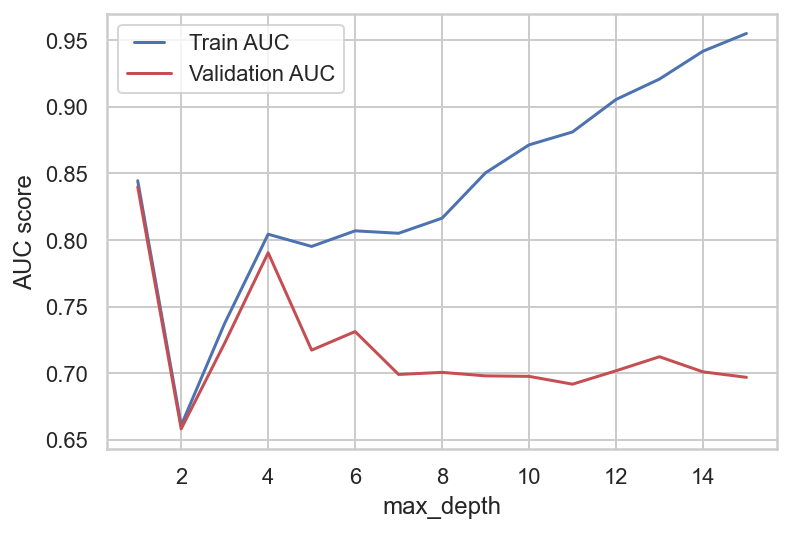

In [191]:
max_depths = np.linspace(1, 15, 15, endpoint=True)  
calculate_AUC(max_depths, B1_S1_train, B1_S1_validation, Y_train, Y_validation, 'max_depth')

The best train value is  8
The best validation value is  4


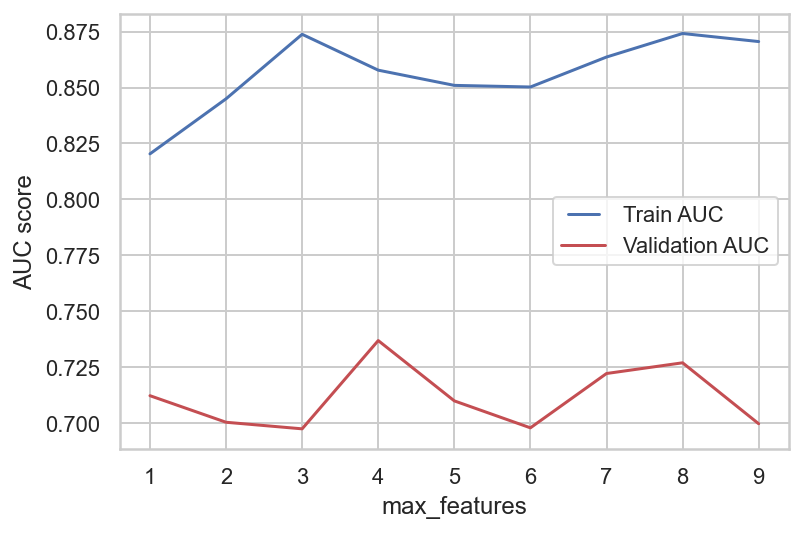

In [192]:
max_features = list(range(1,len(B1_S1_train.columns)))
calculate_AUC(max_features, B1_S1_train, B1_S1_validation, Y_train, Y_validation,'max_features', 10)

The best train value is  10
The best validation value is  338


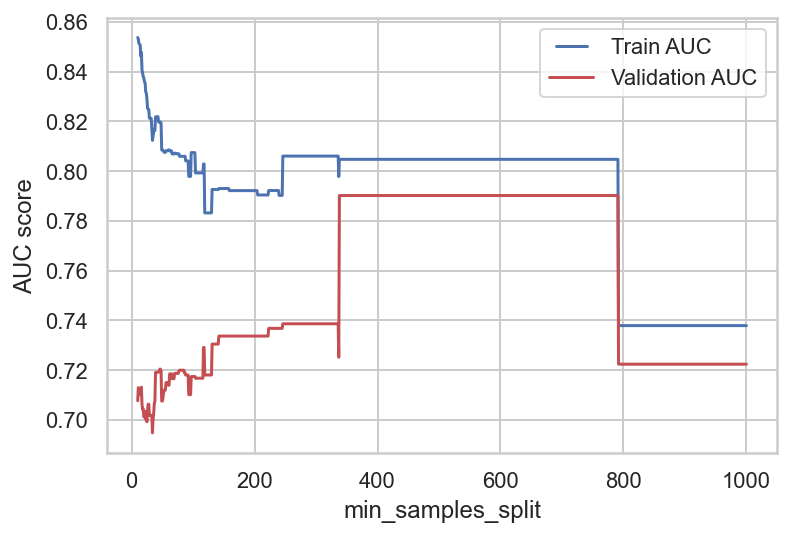

In [193]:
min_samples_split = list(range(10,1001))
calculate_AUC(min_samples_split, B1_S1_train, B1_S1_validation, Y_train, Y_validation,'min_samples_split', 10)

The best train value is  764
The best validation value is  764


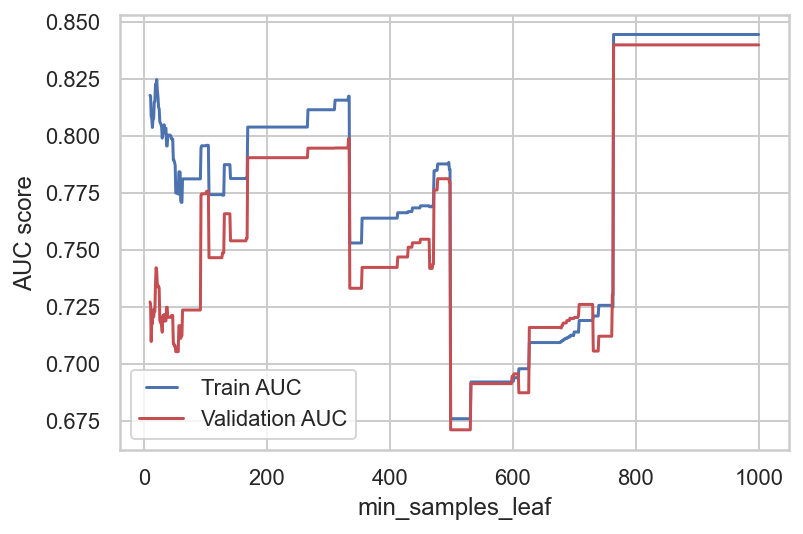

In [194]:
min_samples_leaf = list(range(10,1001))
calculate_AUC(min_samples_leaf, B1_S1_train, B1_S1_validation, Y_train, Y_validation, 'min_samples_leaf', 10)

The best train value is  0.0
The best validation value is  0.2228915662650602


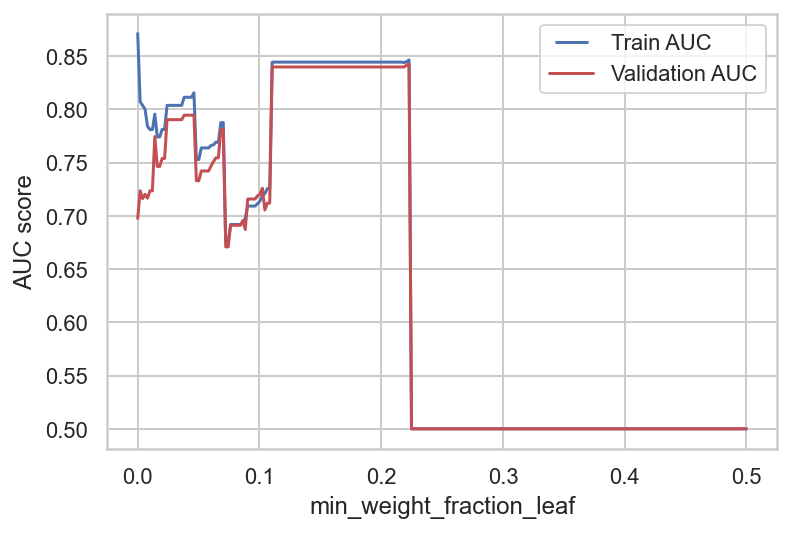

In [195]:
min_weight_fraction_leaf = np.linspace(0, 0.5, 250, endpoint=True)
calculate_AUC(min_weight_fraction_leaf, B1_S1_train, B1_S1_validation, Y_train, Y_validation, 'min_weight_fraction_leaf', 10)

The best train value is  0.0
The best validation value is  0.008917835671342685


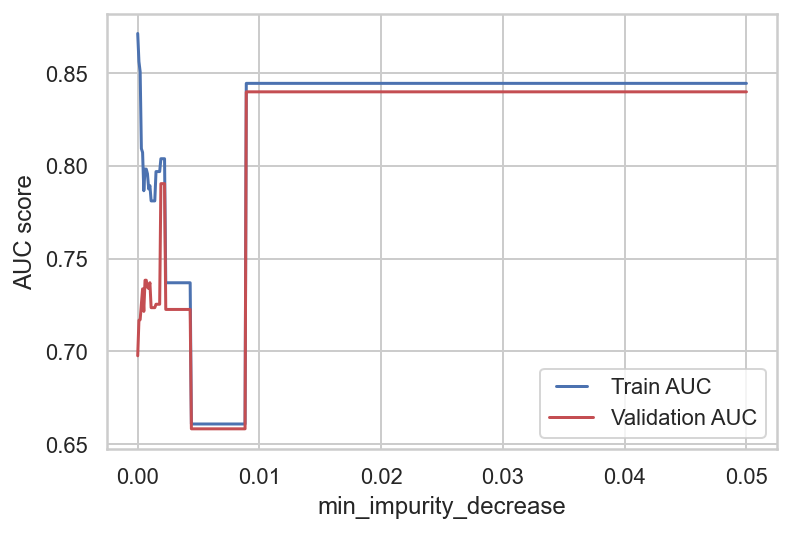

In [196]:
min_impurity_decrease = np.linspace(0, 0.05, 500, endpoint=True)
calculate_AUC(min_impurity_decrease, B1_S1_train, B1_S1_validation, Y_train, Y_validation, 'min_impurity_decrease', 10)

In [197]:
#ccp_alpha
dt_alpha = DecisionTreeClassifier(random_state=42)
path = dt_alpha.cost_complexity_pruning_path(B1_S1_train, Y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for B1_S1 training set')

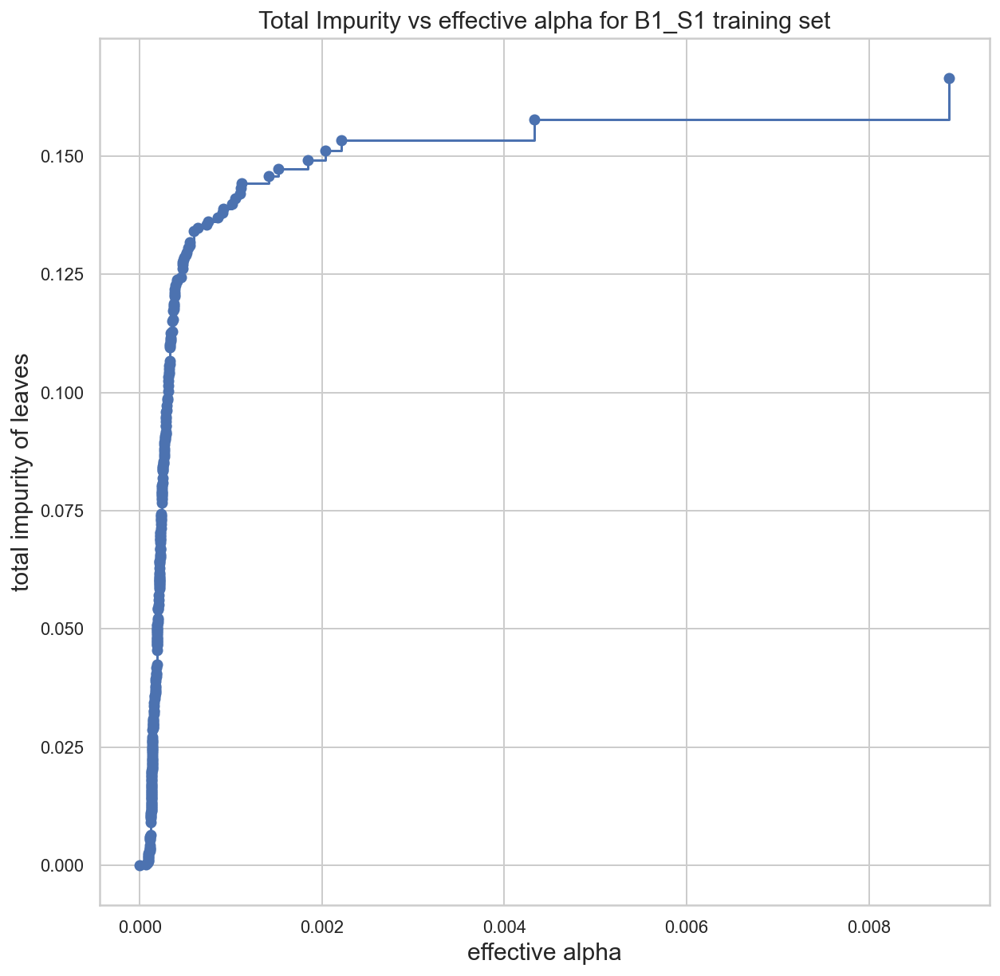

In [198]:
sns.set(style="whitegrid")

fig, ax = plt.subplots(figsize = (10,10))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha", fontsize=15)
ax.set_ylabel("total impurity of leaves", fontsize=15)
ax.set_title("Total Impurity vs effective alpha for B1_S1 training set", fontsize=15)

In [199]:
trees = []
for ccp_alpha in ccp_alphas:
    dt_alpha = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha).fit(B1_S1_train, Y_train)
    trees.append(dt_alpha)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(trees[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.09562371641538067


In [200]:
trees = trees[:-1]
ccp_alphas = ccp_alphas[:-1]

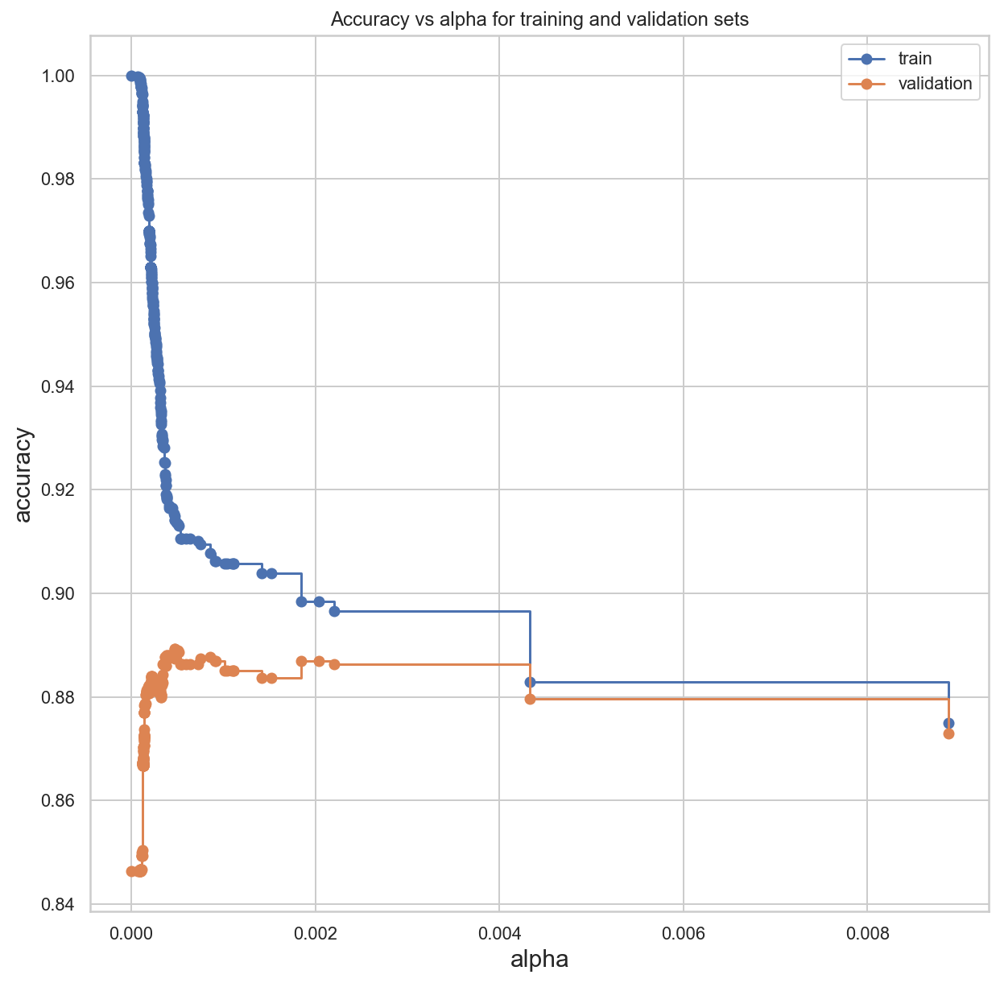

In [201]:
sns.set(style="whitegrid")

train_scores = [tree.score(B1_S1_train, Y_train) for tree in trees]
val_scores = [tree.score(B1_S1_validation, Y_validation) for tree in trees]

fig, ax = plt.subplots(figsize = (10,10))
ax.set_xlabel("alpha", fontsize=15)
ax.set_ylabel("accuracy", fontsize=15)
ax.set_title("Accuracy vs alpha for training and validation sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, val_scores, marker='o', label="validation", drawstyle="steps-post")
ax.legend()
plt.show()

In [202]:
index_best_model = np.argmax(val_scores)
best_model = trees[index_best_model]
print('ccp_alpha of best model: ',trees[index_best_model])
print('_____________________________________________________________')
print('Training accuracy of best model: ',best_model.score(B1_S1_train, Y_train))
print('Validation accuracy of best model: ',best_model.score(B1_S1_validation, Y_validation))

ccp_alpha of best model:  DecisionTreeClassifier(ccp_alpha=0.00047259392768194027, random_state=42)
_____________________________________________________________
Training accuracy of best model:  0.9141305900842978
Validation accuracy of best model:  0.8893333333333333


In [203]:
best_dt1 = DecisionTreeClassifier(min_samples_leaf=764, random_state = 42)
best_dt1.fit(B1_S1_train, Y_train)

labels_best_dt1_train = best_dt1.predict(B1_S1_train)
labels_best_dt1_val = best_dt1.predict(B1_S1_validation)

avg_score(best_dt1, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_dt1_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_dt1_val))
print('\nKaggle Score: 0.61818')

TRAIN
Mean: 0.8876012351646886
Standard Deviation: 0.0025509926793897968
VALIDATION
Mean: 0.8848011704681873
Standard Deviation: 0.006221300534537771

F1 Score to the Train dataset: 0.6651358591657099
F1 Score to the Validation dataset: 0.6595174262734584

Kaggle Score: 0.61818


In [204]:
best_dt2 = DecisionTreeClassifier(max_depth=4, min_samples_leaf=764, min_samples_split=338, random_state = 42)
best_dt2.fit(B1_S1_train, Y_train)

labels_best_dt2_train = best_dt2.predict(B1_S1_train)
labels_best_dt2_val = best_dt2.predict(B1_S1_validation)

avg_score(best_dt2, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_dt2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_dt2_val))
print('\nKaggle Score: 0.62275')

TRAIN
Mean: 0.8876012351646886
Standard Deviation: 0.0025509926793897968
VALIDATION
Mean: 0.8848011704681873
Standard Deviation: 0.006221300534537771

F1 Score to the Train dataset: 0.6651358591657099
F1 Score to the Validation dataset: 0.6595174262734584

Kaggle Score: 0.62275


## 8.4. K-Nearest Neighbors

Text(0, 0.5, 'Validation Accuracy')

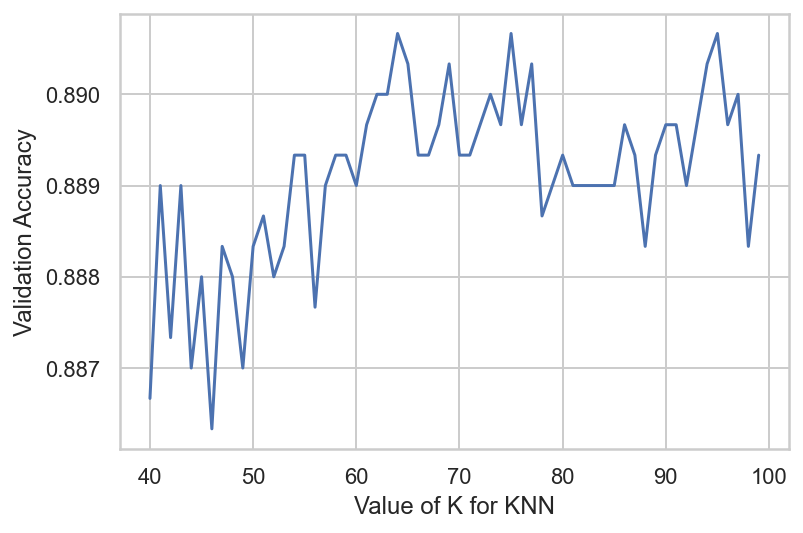

In [205]:
sns.set(style="whitegrid")

# try K=40 through K=100 and record testing accuracy
k_range = range(40, 100)

scores = []

# We use a loop through the range
# We append the scores in the list
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(OutCC1_S1_train, Y_train_VMOut)
    y_pred = knn.predict(OutCC1_S1_validation)
    scores.append(accuracy_score(Y_validation, y_pred))

# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Validation Accuracy')

Text(0, 0.5, 'Validation Accuracy')

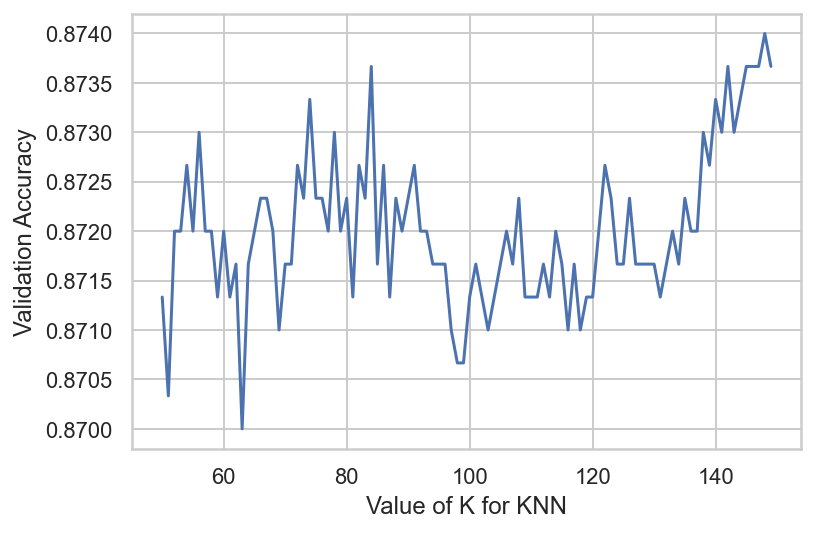

In [206]:
sns.set(style="whitegrid")

# try K=50 through K=150 and record testing accuracy
k_range = range(50, 150)

scores = []

# We use a loop through the range
# We append the scores in the list
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(OutCC2_S1_train, Y_train_SM_VMOut)
    y_pred = knn.predict(OutCC2_S1_validation)
    scores.append(accuracy_score(Y_validation, y_pred))

# plot the relationship between K and testing accuracy
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Validation Accuracy')

In [207]:
best_KNN1 = KNeighborsClassifier()
best_KNN1.fit(OutCC1_S1_train, Y_train_VMOut)

labels_best_KNN1_train = best_KNN1.predict(OutCC1_S1_train)
labels_best_KNN1_val = best_KNN1.predict(OutCC1_S1_validation)

avg_score(best_KNN1, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_VMOut, labels_best_KNN1_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_KNN1_val))
print('\nKaggle Score: 0.59649')

TRAIN
Mean: 0.9181219055265624
Standard Deviation: 0.0019152829362761219
VALIDATION
Mean: 0.8895649337615416
Standard Deviation: 0.006294309516451635

F1 Score to the Train dataset: 0.7150050352467271
F1 Score to the Validation dataset: 0.6401816118047672

Kaggle Score: 0.59649


In [208]:
best_KNN2 = KNeighborsClassifier(n_neighbors=146 , p=1)
best_KNN2.fit(OutCC2_S1_train, Y_train_SM_VMOut)

labels_best_KNN2_train = best_KNN2.predict(OutCC2_S1_train)
labels_best_KNN2_val = best_KNN2.predict(OutCC2_S1_validation)

avg_score(best_KNN2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_SM_VMOut, labels_best_KNN2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_KNN2_val))
print('\nKaggle Score: 0.70046')

TRAIN
Mean: 0.8755506234751964
Standard Deviation: 0.0017227848665740861
VALIDATION
Mean: 0.8744747899159664
Standard Deviation: 0.005112381580747256

F1 Score to the Train dataset: 0.8804679552390641
F1 Score to the Validation dataset: 0.649155722326454

Kaggle Score: 0.70046


## 8.5. K-Nearest Centroids

In [209]:
best_KNC = NearestCentroid()
best_KNC.fit(OutCC2_S1_train, Y_train_SM_VMOut)

labels_best_KNC_train = best_KNC.predict(OutCC2_S1_train)
labels_best_KNC_val = best_KNC.predict(OutCC2_S1_validation)

avg_score(best_KNC, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_SM_VMOut, labels_best_KNC_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_KNC_val))
print('\nKaggle Score: 0.63200')

TRAIN
Mean: 0.8175826782325833
Standard Deviation: 0.002503833306225891
VALIDATION
Mean: 0.8170913526701002
Standard Deviation: 0.005749595270455509

F1 Score to the Train dataset: 0.8208538587848933
F1 Score to the Validation dataset: 0.6096451319381256

Kaggle Score: 0.63200


## 8.6. Passive Aggressive Classifier

In [210]:
PA = PassiveAggressiveClassifier()
PA.fit(B1_S1_train, Y_train)
labels_train = PA.predict(B1_S1_train)
labels_val = PA.predict(B1_S1_validation)

In [211]:
grid = {'C': [0.001, 1],
                      'fit_intercept': [True],
                      'tol': [1e-3, 1e-2, None],
                      'random_state': [42],
                      'loss': ['squared_hinge', 'hinge']}
# define search
search = GridSearchCV(PA, grid, scoring='f1', n_jobs=-1)
# perform the search
results = search.fit(B1_S1_train, Y_train)
# summarize
print('F1 Score: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

F1 Score: 0.645
Config: {'C': 0.001, 'fit_intercept': True, 'loss': 'squared_hinge', 'random_state': 42, 'tol': 0.001}


In [212]:
best_PA = PassiveAggressiveClassifier(C= 0.001, fit_intercept= True, loss='squared_hinge', random_state=42, tol= 0.001)
best_PA.fit(B1_S1_train, Y_train)

labels_best_PA_train = best_PA.predict(B1_S1_train)
labels_best_PA_val = best_PA.predict(B1_S1_validation)

avg_score(best_PA, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_PA_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_PA_val))
print('\nKaggle Score: 0.65656')

TRAIN
Mean: 0.8768586672667467
Standard Deviation: 0.01950091495660612
VALIDATION
Mean: 0.8767373449379752
Standard Deviation: 0.020279988880100745

F1 Score to the Train dataset: 0.647329650092081
F1 Score to the Validation dataset: 0.6464864864864865

Kaggle Score: 0.65656


## 8.7. GaussianNB

In [213]:
best_gNB = GaussianNB(var_smoothing=0.0001)
best_gNB.fit(B1_S1_train, Y_train)

labels_best_gNB_train = best_gNB.predict(B1_S1_train)
labels_best_gNB_val = best_gNB.predict(B1_S1_validation)

avg_score(best_gNB, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_gNB_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_gNB_val))
print('\nKaggle Score: 0.67336')

TRAIN
Mean: 0.8784670178245988
Standard Deviation: 0.0019098142976217147
VALIDATION
Mean: 0.8782004101640656
Standard Deviation: 0.006392676944950919

F1 Score to the Train dataset: 0.6111881645862228
F1 Score to the Validation dataset: 0.6124604012671595

Kaggle Score: 0.67336


## 8.8. Support Vector Machines

In [214]:
best_SVM1 = SVC(kernel='linear', random_state = 42)
best_SVM1.fit(B1_S1_train, Y_train)

labels_best_SVM1_train = best_SVM1.predict(B1_S1_train)
labels_best_SVM1_val = best_SVM1.predict(B1_S1_validation)

avg_score(best_SVM1, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_SVM1_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_SVM1_val))
print('\nKaggle Score: 0.68000')

TRAIN
Mean: 0.8909516191047695
Standard Deviation: 0.0015799043073276785
VALIDATION
Mean: 0.8903518607442977
Standard Deviation: 0.00560524777492362

F1 Score to the Train dataset: 0.6506024096385542
F1 Score to the Validation dataset: 0.6458557588805168

Kaggle Score: 0.68000


In [215]:
best_SVM2 = SVC(kernel='linear', random_state = 42)
best_SVM2.fit(B2_S2_train, Y_train_SM)

labels_best_SVM2_train = best_SVM2.predict(B2_S2_train)
labels_best_SVM2_val = best_SVM2.predict(B2_S2_validation)

avg_score(best_SVM2, B2_S2_train, B2_S2_validation, Y_validation, Y_train_SM)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_SM, labels_best_SVM2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_SVM2_val))
print('\nKaggle Score: 0.66382')

TRAIN
Mean: 0.7238494896366385
Standard Deviation: 0.01345974002504199
VALIDATION
Mean: 0.7216967571924937
Standard Deviation: 0.018656079174342186

F1 Score to the Train dataset: 0.8183925095021786
F1 Score to the Validation dataset: 0.6583850931677019

Kaggle Score: 0.66382


In [216]:
best_SVM3 = SVC(C=1000, random_state = 42)
best_SVM3.fit(OutCC1_S1_train, Y_train_VMOut)

labels_best_SVM3_train = best_SVM3.predict(OutCC1_S1_train)
labels_best_SVM3_val = best_SVM3.predict(OutCC1_S1_validation)

avg_score(best_SVM3, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_VMOut, labels_best_SVM3_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_SVM3_val))
print('\nKaggle Score: 0.64804')

TRAIN
Mean: 0.9106951692760604
Standard Deviation: 0.0018249175491318094
VALIDATION
Mean: 0.8961636892814131
Standard Deviation: 0.005210684286282859

F1 Score to the Train dataset: 0.6873385012919896
F1 Score to the Validation dataset: 0.6414253897550112

Kaggle Score: 0.64804


## 8.9. Linear Discriminant Analysis

In [217]:
LDA = LinearDiscriminantAnalysis()
LDA.fit(B1_S1_train, Y_train)
labels_train = LDA.predict(B1_S1_train)
labels_val = LDA.predict(B1_S1_validation)

In [218]:
grid = dict()
grid['shrinkage'] = arange(0, 1, 0.01)
grid['solver']=['svd', 'lsqr', 'eigen'] # svd can't be tested with shrinkage
# define search
search = GridSearchCV(LDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(B1_S1_train, Y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.889
Config: {'shrinkage': 0.0, 'solver': 'lsqr'}


In [219]:
best_LDA = LinearDiscriminantAnalysis(solver='lsqr')
best_LDA.fit(B1_S1_train, Y_train)

labels_best_LDA_train = best_LDA.predict(B1_S1_train)
labels_best_LDA_val = best_LDA.predict(B1_S1_validation)

avg_score(best_LDA, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_LDA_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_LDA_val))
print('\nKaggle Score: 0.67')

TRAIN
Mean: 0.8905307463217318
Standard Deviation: 0.0016231384923302643
VALIDATION
Mean: 0.8899892707082833
Standard Deviation: 0.004901543841196934

F1 Score to the Train dataset: 0.6516245487364621
F1 Score to the Validation dataset: 0.6532343584305409

Kaggle Score: 0.67


## 8.10. Quadratic Discriminant Analysis

In [220]:
QDA = QuadraticDiscriminantAnalysis()
QDA.fit(B1_S1_train, Y_train)
labels_train = QDA.predict(B1_S1_train)
labels_val = QDA.predict(B1_S1_validation)

In [221]:
grid = dict()
grid['reg_param'] = arange(0, 1, 0.01)
# define search
search = GridSearchCV(QDA, grid, scoring='accuracy', n_jobs=-1)
# perform the search
results = search.fit(B1_S1_train, Y_train)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.888
Config: {'reg_param': 0.99}


In [222]:
best_QDA = QuadraticDiscriminantAnalysis(reg_param=0.99)
best_QDA.fit(B1_S1_train, Y_train)

labels_best_QDA_train = best_QDA.predict(B1_S1_train)
labels_best_QDA_val = best_QDA.predict(B1_S1_validation)

avg_score(best_QDA, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('F1 Score to the Train dataset:', f1_score(Y_train, labels_best_QDA_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_QDA_val))
print('\nKaggle Score: 0.65284')

TRAIN
Mean: 0.8888305746321732
Standard Deviation: 0.0015726337951958566
VALIDATION
Mean: 0.888764100640256
Standard Deviation: 0.0045621473705667855
F1 Score to the Train dataset: 0.6409550045913682
F1 Score to the Validation dataset: 0.641304347826087

Kaggle Score: 0.65284


## 8.11. Comparison of the models

In [223]:
scores_train = [avg_score_train(best_lr, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut), 
                avg_score_train(best_dt1, B1_S1_train, B1_S1_validation, Y_validation, Y_train), 
                avg_score_train(best_dt2, B1_S1_train, B1_S1_validation, Y_validation, Y_train), 
                avg_score_train(best_KNN1, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut), 
                avg_score_train(best_KNN2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut), 
                avg_score_train(best_KNC, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
                avg_score_train(best_PA, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_train(best_gNB, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_train(best_LDA, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_train(best_QDA, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_train(best_NN1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_train(best_NN2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
                avg_score_train(best_SVM1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_train(best_SVM2, B2_S2_train, B2_S2_validation, Y_validation, Y_train_SM),
                avg_score_train(best_SVM3, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)]

scores_validation = [avg_score_validation(best_lr, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut), 
                avg_score_validation(best_dt1, B1_S1_train, B1_S1_validation, Y_validation, Y_train), 
                avg_score_validation(best_dt2, B1_S1_train, B1_S1_validation, Y_validation, Y_train), 
                avg_score_validation(best_KNN1, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut), 
                avg_score_validation(best_KNN2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut), 
                avg_score_validation(best_KNC, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
                avg_score_validation(best_PA, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_validation(best_gNB, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_validation(best_LDA, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_validation(best_QDA, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_validation(best_NN1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_validation(best_NN2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
                avg_score_validation(best_SVM1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
                avg_score_validation(best_SVM2, B2_S2_train, B2_S2_validation, Y_validation, Y_train_SM),
                avg_score_validation(best_SVM3, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)]

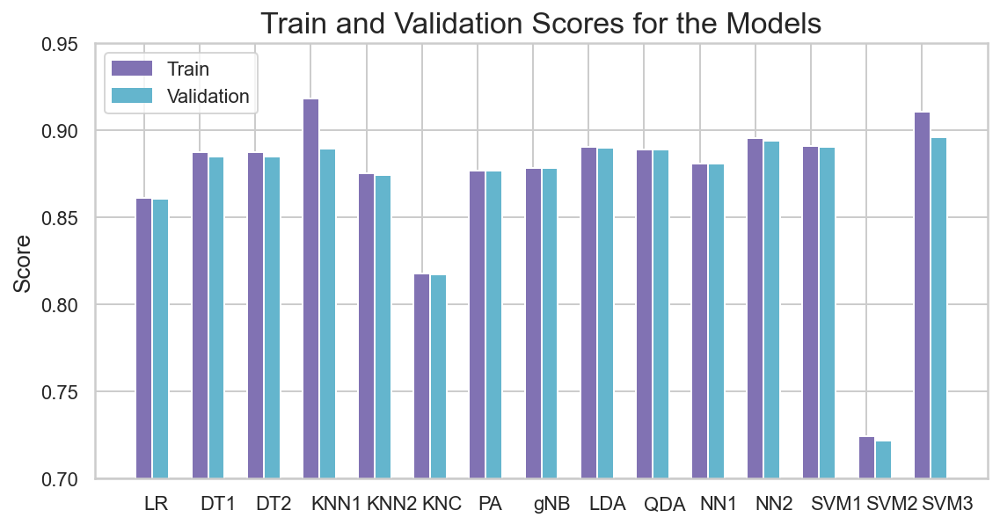

In [224]:
sns.set(style="whitegrid")

models_names = ['LR', 'DT1', 'DT2', 'KNN1', 'KNN2', 'KNC', 'PA', 'gNB', 'LDA', 'QDA', 'NN1', 'NN2', 'SVM1', 'SVM2', 'SVM3']

figure = plt.figure(figsize=(20,10))
ax = figure.add_subplot(222)

ax.bar(np.arange(0,len(models_names)) , scores_train, width=0.3, color='m', align='center')
ax.bar(np.arange(0,len(models_names)) + 0.3, scores_validation, width=0.3, color='c', align='center')

ax.set_xticks(np.arange(len(models_names)))
ax.set_xticklabels(models_names, ha='left')

plt.title('Train and Validation Scores for the Models', fontdict = {'fontsize': 17})
plt.ylabel('Score', fontdict = {'fontsize': 13})
plt.ylim(0.7,0.95)

colors = {'Train':'m', 'Validation':'c'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels)
plt.savefig(r'Figures\scores_best_models.png', dpi=200)

plt.show()

## 8.12. Ensemble

### 8.12.1. Bagging Classifier

In [225]:
best_BG = BaggingClassifier(base_estimator = best_PA, random_state=42,max_samples = 0.1, max_features = 10,
                            bootstrap = True, bootstrap_features = False, n_estimators = 10)
best_BG.fit(OutCC2_S1_train, Y_train_SM_VMOut)

labels_best_BG_train = best_BG.predict(OutCC2_S1_train)
labels_best_BG_val = best_BG.predict(OutCC2_S1_validation)

avg_score(best_BG, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_SM_VMOut, labels_best_BG_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_BG_val))
print('\nKaggle Score: 0.67')

TRAIN
Mean: 0.8571852127947954
Standard Deviation: 0.0023601605746256275
VALIDATION
Mean: 0.8568378964489022
Standard Deviation: 0.005870829504977617

F1 Score to the Train dataset: 0.8414303774607188
F1 Score to the Validation dataset: 0.6693877551020407

Kaggle Score: 0.67


### 8.12.2. Random Forest

In [226]:
best_RF = RandomForestClassifier(criterion='entropy', max_features= 'sqrt' , n_estimators=220 ,warm_start=False ,random_state=42, 
                              ccp_alpha=0.001)
best_RF.fit(OutCC1_S2_train, Y_train_VMOut)

labels_best_RF_train = best_RF.predict(OutCC1_S2_train)
labels_best_RF_val = best_RF.predict(OutCC1_S2_validation)

avg_score(best_RF, OutCC1_S2_train, OutCC1_S2_validation, Y_validation, Y_train_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_VMOut, labels_best_RF_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_RF_val))
print('\nKaggle Score: 0.69364')

TRAIN
Mean: 0.9232068780944734
Standard Deviation: 0.0021685035166961906
VALIDATION
Mean: 0.900855580088318
Standard Deviation: 0.005121853583526708

F1 Score to the Train dataset: 0.7423405323957811
F1 Score to the Validation dataset: 0.6778242677824268

Kaggle Score: 0.69364


### 8.12.3. AdaBoost Classifier

In [227]:
AdaBoost = AdaBoostClassifier(random_state = 42)
AdaBoost.fit(OutCC1_S1_train, Y_train_VMOut)
labels_train = AdaBoost.predict(OutCC1_S1_train)
labels_val = AdaBoost.predict(OutCC1_S1_validation)

In [228]:
grid = {'base_estimator' : [None, best_SVM3],
        'n_estimators': list(np.arange(20,250,30)),
        'algorithm' : ['SAMME', 'SAMME.R'],
        'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.5],
        'random_state': [42]}
# define search
search = GridSearchCV(AdaBoost, grid, scoring='f1', verbose=2, n_jobs=-1)
# perform the search
results = search.fit(OutCC1_S1_train, Y_train_VMOut)
# summarize
print('F1 Score: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Fitting 5 folds for each of 160 candidates, totalling 800 fits
F1 Score: 0.660
Config: {'algorithm': 'SAMME', 'base_estimator': None, 'learning_rate': 0.001, 'n_estimators': 110, 'random_state': 42}


In [262]:
best_AdaBoost = AdaBoostClassifier(algorithm = 'SAMME', base_estimator = None, learning_rate = 0.001, n_estimators = 110,
                                   random_state = 42)
best_AdaBoost.fit(OutCC1_S1_train, Y_train_VMOut)

labels_best_AdaBoost_train = best_AdaBoost.predict(OutCC1_S1_train)
labels_best_AdaBoost_val = best_AdaBoost.predict(OutCC1_S1_validation)

avg_score(best_AdaBoost, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_VMOut, labels_best_AdaBoost_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_AdaBoost_val))
print('\nKaggle Score: 0.66666')

TRAIN
Mean: 0.8748870935367322
Standard Deviation: 0.0030155716805711293
VALIDATION
Mean: 0.8737203934162987
Standard Deviation: 0.006879646375786948

F1 Score to the Train dataset: 0.6635586635586636
F1 Score to the Validation dataset: 0.6606822262118492

Kaggle Score: 0.66666


### 8.12.4. Voting classifier

In [230]:
Voting = VotingClassifier(estimators= [('NN', best_NN1), ('DT1', best_dt1), ('DT2', best_dt2), ('PA', best_PA), ('gNB', best_gNB), ('SVM', best_SVM1), ('LDA', best_LDA), ('QDA', best_QDA)])
Voting.fit(B1_S1_train, Y_train)
labels_train = Voting.predict(B1_S1_train)
labels_val = Voting.predict(B1_S1_validation)

In [231]:
grid = {'voting' : ['hard', 'soft'],
                       'weights': [None, 0.5, 1],
                       'n_jobs': [-1],
                       'flatten_transform' : [True, False],
                       'verbose' : [True]}
# define search
search = GridSearchCV(Voting, grid, scoring = 'f1', n_jobs=-1)
# perform the search
results = search.fit(B1_S1_train, Y_train)
# summarize
print('F1 Score: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

F1 Score: 0.655
Config: {'flatten_transform': True, 'n_jobs': -1, 'verbose': True, 'voting': 'hard', 'weights': None}


In [232]:
best_Voting1 = VotingClassifier(estimators= [('NN', best_NN1), ('DT1', best_dt1), ('DT2', best_dt2), ('PA', best_PA), ('gNB', best_gNB), ('SVM', best_SVM1), ('LDA', best_LDA), ('QDA', best_QDA)],
                               flatten_transform = True, n_jobs = -1, verbose = True, voting = 'hard', weights = None)
best_Voting1.fit(B1_S1_train, Y_train)

labels_best_Voting1_train = best_Voting1.predict(B1_S1_train)
labels_best_Voting1_val = best_Voting1.predict(B1_S1_validation)

avg_score(best_Voting1, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_Voting1_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_Voting1_val))
print('\nKaggle Score: 0.67')

TRAIN
Mean: 0.8903057146508423
Standard Deviation: 0.001879085036416359
VALIDATION
Mean: 0.8893515706282513
Standard Deviation: 0.005191465709475456

F1 Score to the Train dataset: 0.6515837104072398
F1 Score to the Validation dataset: 0.6546227417640806

Kaggle Score: 0.67


In [233]:
Voting = VotingClassifier(estimators= [('LR', best_lr), ('NN', best_NN2), ('KNN', best_KNN2), ('KNC', best_KNC)])
Voting.fit(OutCC2_S1_train, Y_train_SM_VMOut)
labels_train = Voting.predict(OutCC2_S1_train)
labels_val = Voting.predict(OutCC2_S1_validation)

In [234]:
grid = {'voting' : ['hard', 'soft'],
                       'weights': [None, 0.5, 1],
                       'n_jobs': [-1],
                       'flatten_transform' : [True, False],
                       'verbose' : [True]}
# define search
search = GridSearchCV(Voting, grid, scoring = 'f1', n_jobs=-1)
# perform the search
results = search.fit(OutCC2_S1_train, Y_train_SM_VMOut)
# summarize
print('F1 Score: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

F1 Score: 0.865
Config: {'flatten_transform': True, 'n_jobs': -1, 'verbose': True, 'voting': 'hard', 'weights': None}


In [235]:
best_Voting2 = VotingClassifier(estimators= [('LR', best_lr), ('NN', best_NN2), ('KNN', best_KNN2), ('KNC', best_KNC)], 
                                    flatten_transform = True, n_jobs = -1, verbose = True, voting = 'hard', weights = None)
best_Voting2.fit(OutCC2_S1_train, Y_train_SM_VMOut)

labels_best_Voting2_train = best_Voting2.predict(OutCC2_S1_train)
labels_best_Voting2_val = best_Voting2.predict(OutCC2_S1_validation)

avg_score(best_Voting2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_SM_VMOut, labels_best_Voting2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_Voting2_val))
print('\nKaggle Score: 0.69683')

TRAIN
Mean: 0.8707926719074727
Standard Deviation: 0.0017544399790034935
VALIDATION
Mean: 0.8699935619409054
Standard Deviation: 0.00537082359760488

F1 Score to the Train dataset: 0.8671206565392003
F1 Score to the Validation dataset: 0.656833824975418

Kaggle Score: 0.69683


### 8.12.5. Gradient Boosting

In [236]:
GB = GradientBoostingClassifier(random_state = 42)
GB.fit(OutCC1_S1_train, Y_train_VMOut)
labels_train = GB.predict(OutCC1_S1_train)
labels_val = GB.predict(OutCC1_S1_validation)

In [237]:
grid = {'loss' : ['deviance', 'exponential'],
                          'learning_rate' : (0.01, 0.1, 0.4),
                          'n_estimators' : (100, 300, 500),
                          'max_features' : [5, 'sqrt','log2', None],
                          'max_depth' : (5, 10, 15),
                          'warm_start' : [True, False]}
# define search
search = GridSearchCV(GB, grid, scoring = 'f1', n_jobs=-1)
# perform the search
results = search.fit(OutCC1_S1_train, Y_train_VMOut)
# summarize
print('F1 Score: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

F1 Score: 0.641
Config: {'learning_rate': 0.01, 'loss': 'exponential', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 500, 'warm_start': True}


In [238]:
best_GB1 = GradientBoostingClassifier(random_state = 42, learning_rate = 0.01, loss = 'exponential', max_depth = 5, max_features = 'sqrt',
                                n_estimators = 500, warm_start = True)
best_GB1.fit(OutCC1_S1_train, Y_train_VMOut)

labels_best_GB1_train = best_GB1.predict(OutCC1_S1_train)
labels_best_GB1_val = best_GB1.predict(OutCC1_S1_validation)

avg_score(best_GB1, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_VMOut, labels_best_GB1_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_GB1_val))
print('\nKaggle Score: 0.6506')

TRAIN
Mean: 0.9167001204335608
Standard Deviation: 0.0019819768825904867
VALIDATION
Mean: 0.9167001204335608
Standard Deviation: 0.005945930647771415

F1 Score to the Train dataset: 0.7363590005099441
F1 Score to the Validation dataset: 0.6666666666666667

Kaggle Score: 0.6506


In [239]:
GB = GradientBoostingClassifier(random_state = 42)
GB.fit(OutCC1_S2_train, Y_train_VMOut)
labels_train = GB.predict(OutCC1_S2_train)
labels_val = GB.predict(OutCC1_S2_validation)

In [240]:
grid = {'loss' : ['deviance', 'exponential'],
                          'learning_rate' : (0.01, 0.1, 0.4),
                          'n_estimators' : (100, 300, 500),
                          'max_features' : [3, 'sqrt','log2', None],
                          'max_depth' : (5, 10, 15),
                          'warm_start' : [True, False]}
# define search
search = GridSearchCV(GB, grid, scoring = 'f1', n_jobs=-1)
# perform the search
results = search.fit(OutCC1_S2_train, Y_train_VMOut)
# summarize
print('F1 Score: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

F1 Score: 0.659
Config: {'learning_rate': 0.01, 'loss': 'exponential', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 500, 'warm_start': True}


In [241]:
best_GB2 = GradientBoostingClassifier(random_state = 42, learning_rate = 0.01, loss = 'exponential', max_depth = 5, max_features = 'sqrt',
                                n_estimators = 500, warm_start = True)
best_GB2.fit(OutCC1_S2_train, Y_train_VMOut)

labels_best_GB2_train = best_GB2.predict(OutCC1_S2_train)
labels_best_GB2_val = best_GB2.predict(OutCC1_S2_validation)

avg_score(best_GB2, OutCC1_S2_train, OutCC1_S2_validation, Y_validation, Y_train_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_VMOut, labels_best_GB2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_GB2_val))
print('\nKaggle Score: 0.68639')

TRAIN
Mean: 0.9162986752308311
Standard Deviation: 0.0017360538933934334
VALIDATION
Mean: 0.9162986752308311
Standard Deviation: 0.0052081616801803

F1 Score to the Train dataset: 0.733739837398374
F1 Score to the Validation dataset: 0.6729957805907173

Kaggle Score: 0.68639


In [242]:
GB = GradientBoostingClassifier(random_state = 42)
GB.fit(OutCC2_S1_train, Y_train_SM_VMOut)
labels_train = GB.predict(OutCC2_S1_train)
labels_val = GB.predict(OutCC2_S1_validation)

In [243]:
grid = {'loss' : ['deviance', 'exponential'],
                          'learning_rate' : (0.01, 0.1, 0.4),
                          'n_estimators' : (100, 300, 500),
                          'max_features' : [5, 'sqrt','log2', None],
                          'max_depth' : (5, 10, 15),
                          'warm_start' : [True, False]}
# define search
search = GridSearchCV(GB, grid, scoring = 'f1', n_jobs=-1)
# perform the search
results = search.fit(OutCC2_S1_train, Y_train_SM_VMOut)
# summarize
print('F1 Score: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

F1 Score: 0.938
Config: {'learning_rate': 0.4, 'loss': 'exponential', 'max_depth': 15, 'max_features': 'sqrt', 'n_estimators': 300, 'warm_start': True}


In [244]:
best_GB3 = GradientBoostingClassifier(random_state = 42, learning_rate = 0.4, loss = 'exponential', max_depth = 15, max_features = 'sqrt',
                                n_estimators = 300, warm_start = True)
best_GB3.fit(OutCC2_S1_train, Y_train_SM_VMOut)

labels_best_GB3_train = best_GB3.predict(OutCC2_S1_train)
labels_best_GB3_val = best_GB3.predict(OutCC2_S1_validation)

avg_score(best_GB3, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_SM_VMOut, labels_best_GB3_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_GB3_val))
print('\nKaggle Score: 0.69811')

TRAIN
Mean: 0.9764163730008133
Standard Deviation: 0.0006124262090777076
VALIDATION
Mean: 0.9764163730008133
Standard Deviation: 0.0018372786272331152

F1 Score to the Train dataset: 0.9999147121535181
F1 Score to the Validation dataset: 0.6698382492863939

Kaggle Score: 0.69811


### 8.12.6. Stacking Classifier

In [245]:
estimators_best_Stacking1 = [('NN', best_NN1), ('DT', best_dt2), ('PA', best_PA), ('gNB', best_gNB), ('SVM', best_SVM1), ('LDA', best_LDA), ('QDA', best_QDA)]

best_Stacking1 = StackingClassifier(estimators = estimators_best_Stacking1, final_estimator = LogisticRegression(random_state = 42), n_jobs = -1)
best_Stacking1.fit(B1_S1_train, Y_train)

labels_best_Stacking1_train = best_Stacking1.predict(B1_S1_train)
labels_best_Stacking1_val = best_Stacking1.predict(B1_S1_validation)

avg_score(best_Stacking1, B1_S1_train, B1_S1_validation, Y_validation, Y_train)

print('\nF1 Score to the Train dataset:', f1_score(Y_train, labels_best_Stacking1_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_Stacking1_val))
print('\nKaggle Score: 0.65517')

TRAIN
Mean: 0.8909057718806952
Standard Deviation: 0.002635435217681434
VALIDATION
Mean: 0.8893641306522609
Standard Deviation: 0.006032353811132959

F1 Score to the Train dataset: 0.6468926553672316
F1 Score to the Validation dataset: 0.6461538461538461

Kaggle Score: 0.65517


In [246]:
estimators_best_Stacking2 = [('KNN', best_KNN1), ('SVM', best_SVM3)]

best_Stacking2 = StackingClassifier(estimators = estimators_best_Stacking2, final_estimator = MLPClassifier(random_state = 42), n_jobs = -1)
best_Stacking2.fit(OutCC1_S1_train, Y_train_VMOut)

labels_best_Stacking2_train = best_Stacking2.predict(OutCC1_S1_train)
labels_best_Stacking2_val = best_Stacking2.predict(OutCC1_S1_validation)

avg_score(best_Stacking2, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)

print('\nF1 Score to the Train dataset:', f1_score(Y_train_VMOut, labels_best_Stacking2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_Stacking2_val))
print('\nKaggle Score: 0.65822')

TRAIN
Mean: 0.9161481332798074
Standard Deviation: 0.002340030614080683
VALIDATION
Mean: 0.8967658570855078
Standard Deviation: 0.005441868268460115

F1 Score to the Train dataset: 0.7114788004136506
F1 Score to the Validation dataset: 0.6382022471910112

Kaggle Score: 0.65822


## 8.13. Comparison of the Ensemble models

In [247]:
scores_train = [avg_score_train(best_BG, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
               avg_score_train(best_RF, OutCC1_S2_train, OutCC1_S2_validation, Y_validation, Y_train_VMOut),
               avg_score_train(best_AdaBoost, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut),
               avg_score_train(best_Voting1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
               avg_score_train(best_Voting2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
               avg_score_train(best_GB1, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut),
               avg_score_train(best_GB2, OutCC1_S2_train, OutCC1_S2_validation, Y_validation, Y_train_VMOut),
               avg_score_train(best_GB3, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
               avg_score_train(best_Stacking1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
               avg_score_train(best_Stacking2, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)]

scores_validation = [avg_score_validation(best_BG, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
               avg_score_validation(best_RF, OutCC1_S2_train, OutCC1_S2_validation, Y_validation, Y_train_VMOut),
               avg_score_validation(best_AdaBoost, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut),
               avg_score_validation(best_Voting1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
               avg_score_validation(best_Voting2, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
               avg_score_validation(best_GB1, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut),
               avg_score_validation(best_GB2, OutCC1_S2_train, OutCC1_S2_validation, Y_validation, Y_train_VMOut),
               avg_score_validation(best_GB3, OutCC2_S1_train, OutCC2_S1_validation, Y_validation, Y_train_SM_VMOut),
               avg_score_validation(best_Stacking1, B1_S1_train, B1_S1_validation, Y_validation, Y_train),
               avg_score_validation(best_Stacking2, OutCC1_S1_train, OutCC1_S1_validation, Y_validation, Y_train_VMOut)]

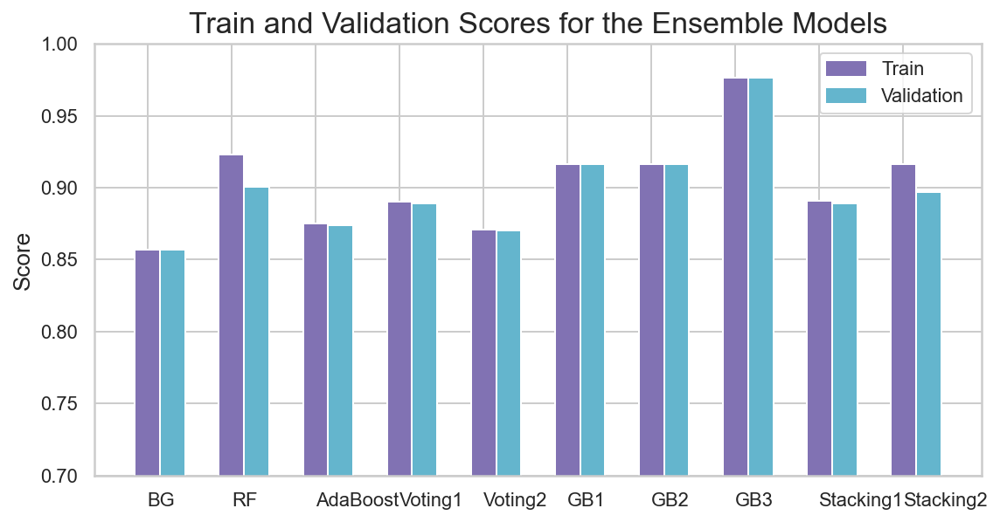

In [263]:
sns.set(style="whitegrid")

models_names = ['BG', 'RF', 'AdaBoost', 'Voting1', 'Voting2', 'GB1', 'GB2', 'GB3', 'Stacking1', 'Stacking2']

figure = plt.figure(figsize=(20,10))
ax = figure.add_subplot(222)

ax.bar(np.arange(0,len(models_names)) , scores_train, width=0.3, color='m', align='center')
ax.bar(np.arange(0,len(models_names)) + 0.3, scores_validation, width=0.3, color='c', align='center')

ax.set_xticks(np.arange(len(models_names)))
ax.set_xticklabels(models_names, ha='left')

plt.title('Train and Validation Scores for the Ensemble Models', fontdict = {'fontsize': 17})
plt.ylabel('Score', fontdict = {'fontsize': 13})
plt.ylim(0.7,1)

colors = {'Train':'m', 'Validation':'c'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels)
plt.savefig(r'Figures\scores_best_ensemble_models.png', dpi=200)

plt.show()

## 8.14. Training the top 10 best models with all the data

In [249]:
# Baseline Set1
X_B1_S1 = pd.concat([B1_S1_train, B1_S1_validation])
Y_B1_S1 = Y_train.append(Y_validation)

# Outliers + CC Set2
X_OutCC1_S2 = pd.concat([OutCC1_S2_train, OutCC1_S2_validation])
Y_OutCC1_S2 = Y_train_VMOut.append(Y_validation)

# Outliers + CC + SM Set1
X_OutCC2_S1 = pd.concat([OutCC2_S1_train, OutCC2_S1_validation])
Y_OutCC2_S1 = Y_train_SM_VMOut.append(Y_validation)

### 8.14.1. best_gNB

In [250]:
best_gNB_V2 = GaussianNB(var_smoothing=0.0001)
best_gNB_V2.fit(X_B1_S1, Y_B1_S1)

labels_best_gNB_V2_train = best_gNB_V2.predict(X_B1_S1)
labels_best_gNB_V2_val = best_gNB_V2.predict(B1_S1_validation)

avg_score(best_gNB_V2, X_B1_S1, B1_S1_validation, Y_validation, Y_B1_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_B1_S1, labels_best_gNB_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_gNB_V2_val))
print('\nKaggle Score: 0.66666')

TRAIN
Mean: 0.8778463658994611
Standard Deviation: 0.002126980449819349
VALIDATION
Mean: 0.8778174349503989
Standard Deviation: 0.006429108186835056

F1 Score to the Train dataset: 0.6103646833013436
F1 Score to the Validation dataset: 0.6118143459915611

Kaggle Score: 0.66666


### 8.14.2. best_SVM1

In [251]:
best_SVM1_V2 = SVC(kernel='linear', random_state = 42)
best_SVM1_V2.fit(X_B1_S1, Y_B1_S1)

labels_best_SVM1_V2_train = best_SVM1_V2.predict(X_B1_S1)
labels_best_SVM1_V2_val = best_SVM1_V2.predict(B1_S1_validation)

avg_score(best_SVM1_V2, X_B1_S1, B1_S1_validation, Y_validation, Y_B1_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_B1_S1, labels_best_SVM1_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_SVM1_V2_val))
print('\nKaggle Score: 0.67980')

TRAIN
Mean: 0.8907768150448041
Standard Deviation: 0.0017358255136213723
VALIDATION
Mean: 0.8903566985107845
Standard Deviation: 0.004442413991156269

F1 Score to the Train dataset: 0.6550522648083624
F1 Score to the Validation dataset: 0.6560170394036209

Kaggle Score: 0.67980


### 8.14.3. best_LDA

In [252]:
best_LDA_V2 = LinearDiscriminantAnalysis(solver='lsqr')
best_LDA_V2.fit(X_B1_S1, Y_B1_S1)

labels_best_LDA_V2_train = best_LDA_V2.predict(X_B1_S1)
labels_best_LDA_V2_val = best_LDA_V2.predict(B1_S1_validation)

avg_score(best_LDA_V2, X_B1_S1, B1_S1_validation, Y_validation, Y_B1_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_B1_S1, labels_best_LDA_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_LDA_V2_val))
print('\nKaggle Score: 0.67326')

TRAIN
Mean: 0.8908505484454684
Standard Deviation: 0.0016140073560781867
VALIDATION
Mean: 0.8905394559272676
Standard Deviation: 0.004409632473317321

F1 Score to the Train dataset: 0.6548895899053627
F1 Score to the Validation dataset: 0.6596417281348789

Kaggle Score: 0.67326


### 8.14.4. best_Voting1

In [253]:
best_Voting1_V2 = VotingClassifier(estimators= [('NN', best_NN1), ('DT1', best_dt1), ('DT2', best_dt2), ('PA', best_PA), ('gNB', best_gNB), ('SVM', best_SVM1), ('LDA', best_LDA), ('QDA', best_QDA)],
                               flatten_transform = True, n_jobs = -1, verbose = True, voting = 'hard', weights = None)
best_Voting1_V2.fit(X_B1_S1, Y_B1_S1)

labels_best_Voting1_V2_train = best_Voting1_V2.predict(X_B1_S1)
labels_best_Voting1_V2_val = best_Voting1_V2.predict(B1_S1_validation)

avg_score(best_Voting1_V2, X_B1_S1, B1_S1_validation, Y_validation, Y_B1_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_B1_S1, labels_best_Voting1_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_Voting1_V2_val))
print('\nKaggle Score: 0.64583')

TRAIN
Mean: 0.8900331897946141
Standard Deviation: 0.002095866228374207
VALIDATION
Mean: 0.8898951718872079
Standard Deviation: 0.005206835781599488

F1 Score to the Train dataset: 0.6087570621468926
F1 Score to the Validation dataset: 0.6152046783625731

Kaggle Score: 0.64583


### 8.14.5. best_RF

In [254]:
best_RF_V2 = RandomForestClassifier(criterion='entropy', max_features= 'sqrt' , n_estimators=220 ,warm_start=False ,random_state=42, 
                              ccp_alpha=0.001)
best_RF_V2.fit(X_OutCC1_S2, Y_OutCC1_S2)

labels_best_RF_V2_train = best_RF_V2.predict(X_OutCC1_S2)
labels_best_RF_V2_val = best_RF_V2.predict(OutCC1_S2_validation)

avg_score(best_RF_V2, X_OutCC1_S2, OutCC1_S2_validation, Y_validation, Y_OutCC1_S2)

print('\nF1 Score to the Train dataset:', f1_score(Y_OutCC1_S2, labels_best_RF_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_RF_V2_val))
print('\nKaggle Score: 0.65853')

TRAIN
Mean: 0.9210184613802325
Standard Deviation: 0.001538643808135645
VALIDATION
Mean: 0.906423557543968
Standard Deviation: 0.005259587659592581

F1 Score to the Train dataset: 0.7012534818941504
F1 Score to the Validation dataset: 0.7091891891891893

Kaggle Score: 0.65853


### 8.14.6. best_GB2

In [255]:
best_GB2_V2 = GradientBoostingClassifier(random_state = 42, learning_rate = 0.01, loss = 'exponential', max_depth = 5, max_features = 'sqrt',
                                n_estimators = 500, warm_start = True)
best_GB2_V2.fit(X_OutCC1_S2, Y_OutCC1_S2)

labels_best_GB2_V2_train = best_GB2_V2.predict(X_OutCC1_S2)
labels_best_GB2_V2_val = best_GB2_V2.predict(OutCC1_S2_validation)

avg_score(best_GB2_V2, X_OutCC1_S2, OutCC1_S2_validation, Y_validation, Y_OutCC1_S2)

print('\nF1 Score to the Train dataset:', f1_score(Y_OutCC1_S2, labels_best_GB2_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_GB2_V2_val))
print('\nKaggle Score: 0.67484')

TRAIN
Mean: 0.9190064794816415
Standard Deviation: 0.0014462985817571934
VALIDATION
Mean: 0.9190064794816415
Standard Deviation: 0.004338895745271584

F1 Score to the Train dataset: 0.7187609996480112
F1 Score to the Validation dataset: 0.7232635060639471

Kaggle Score: 0.67484


### 8.14.7. best_KNN2

In [256]:
best_KNN2_V2 = KNeighborsClassifier(n_neighbors=146 , p=1)
best_KNN2_V2.fit(X_OutCC2_S1, Y_OutCC2_S1)

labels_best_KNN2_V2_train = best_KNN2_V2.predict(X_OutCC2_S1)
labels_best_KNN2_V2_val = best_KNN2_V2.predict(OutCC2_S1_validation)

avg_score(best_KNN2_V2, X_OutCC2_S1, OutCC2_S1_validation, Y_validation, Y_OutCC2_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_OutCC2_S1, labels_best_KNN2_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_KNN2_V2_val))
print('\nKaggle Score: 0.70754')

TRAIN
Mean: 0.8770251370428774
Standard Deviation: 0.0018323261847518067
VALIDATION
Mean: 0.8758940639783734
Standard Deviation: 0.005937410570033077

F1 Score to the Train dataset: 0.8601508485229415
F1 Score to the Validation dataset: 0.6569767441860465

Kaggle Score: 0.70754


### 8.14.8. best_BG

In [257]:
best_BG_V2 = BaggingClassifier(base_estimator = best_PA, random_state=42,max_samples = 0.1, max_features = 10,
                            bootstrap = True, bootstrap_features = False, n_estimators = 10)
best_BG_V2.fit(X_OutCC2_S1, Y_OutCC2_S1)

labels_best_BG_V2_train = best_BG_V2.predict(X_OutCC2_S1)
labels_best_BG_V2_val = best_BG_V2.predict(OutCC2_S1_validation)

avg_score(best_BG_V2, X_OutCC2_S1, OutCC2_S1_validation, Y_validation, Y_OutCC2_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_OutCC2_S1, labels_best_BG_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_BG_V2_val))
print('\nKaggle Score: 0.67676')

TRAIN
Mean: 0.8606339641060299
Standard Deviation: 0.0017495121288031632
VALIDATION
Mean: 0.8604274611398963
Standard Deviation: 0.004317113309051104

F1 Score to the Train dataset: 0.8228333333333333
F1 Score to the Validation dataset: 0.6652977412731006

Kaggle Score: 0.67676


### 8.14.9. best_Voting2

In [258]:
best_Voting2_V2 = VotingClassifier(estimators= [('LR', best_lr), ('NN', best_NN2), ('KNN', best_KNN2), ('KNC', best_KNC)], 
                                    flatten_transform = True, n_jobs = -1, verbose = True, voting = 'hard', weights = None)
best_Voting2_V2.fit(X_OutCC2_S1, Y_OutCC2_S1)

labels_best_Voting2_V2_train = best_Voting2_V2.predict(X_OutCC2_S1)
labels_best_Voting2_V2_val = best_Voting2_V2.predict(OutCC2_S1_validation)

avg_score(best_Voting2_V2, X_OutCC2_S1, OutCC2_S1_validation, Y_validation, Y_OutCC2_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_OutCC2_S1, labels_best_Voting2_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_Voting2_V2_val))
print('\nKaggle Score: 0.68269')

TRAIN
Mean: 0.8727402004956071
Standard Deviation: 0.0018233243058629227
VALIDATION
Mean: 0.8718038972741609
Standard Deviation: 0.005573855405316384

F1 Score to the Train dataset: 0.8488699428939114
F1 Score to the Validation dataset: 0.6626746506986027

Kaggle Score: 0.68269


### 8.14.10. best_GB3

In [259]:
best_GB3_V2 = GradientBoostingClassifier(random_state = 42, learning_rate = 0.4, loss = 'exponential', max_depth = 15, max_features = 'sqrt',
                                n_estimators = 300, warm_start = True)
best_GB3_V2.fit(X_OutCC2_S1, Y_OutCC2_S1)

labels_best_GB3_V2_train = best_GB3_V2.predict(X_OutCC2_S1)
labels_best_GB3_V2_val = best_GB3_V2.predict(OutCC2_S1_validation)

avg_score(best_GB3_V2, X_OutCC2_S1, OutCC2_S1_validation, Y_validation, Y_OutCC2_S1)

print('\nF1 Score to the Train dataset:', f1_score(Y_OutCC2_S1, labels_best_GB3_V2_train))
print('F1 Score to the Validation dataset:', f1_score(Y_validation, labels_best_GB3_V2_val))
print('\nKaggle Score: 0.68000')

TRAIN
Mean: 0.9998310430277089
Standard Deviation: 5.936542877840937e-05
VALIDATION
Mean: 0.9998310430277089
Standard Deviation: 0.00017809628633521713

F1 Score to the Train dataset: 0.9998419721871049
F1 Score to the Validation dataset: 0.9989258861439313

Kaggle Score: 0.68000


# 9. Results

In [260]:
# creating our final model
final_model = best_RF
final_model.fit(OutCC1_S2_train, Y_train_VMOut)

# performing the predictions with the final model
labels_final_train = final_model.predict(OutCC1_S2_train)
labels_final_val = final_model.predict(OutCC1_S2_validation)
final_predictions = final_model.predict(OutCC1_S2_test)

# saving to a csv file the predictions
id_list = test.index.tolist()
kaggle = pd.DataFrame(list(zip(id_list, final_predictions)), columns =['Access_ID', 'Buy'])
kaggle = kaggle.astype('int32')
kaggle.to_csv(r'Submissions\Group16_Final_Version.csv', index = False, header = True)

In [266]:
metrics(Y_train_VMOut, labels_final_train, Y_validation, labels_final_val)

_____________________________________
                                                     TRAIN                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      5893
           1       0.80      0.69      0.74      1071

    accuracy                           0.93      6964
   macro avg       0.87      0.83      0.85      6964
weighted avg       0.92      0.93      0.92      6964

[[5712  181]
 [ 332  739]]
____________________________________
                                                VALIDATION                                                 
-----------------------------------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.93      0.94      2534
           1       0.66      0

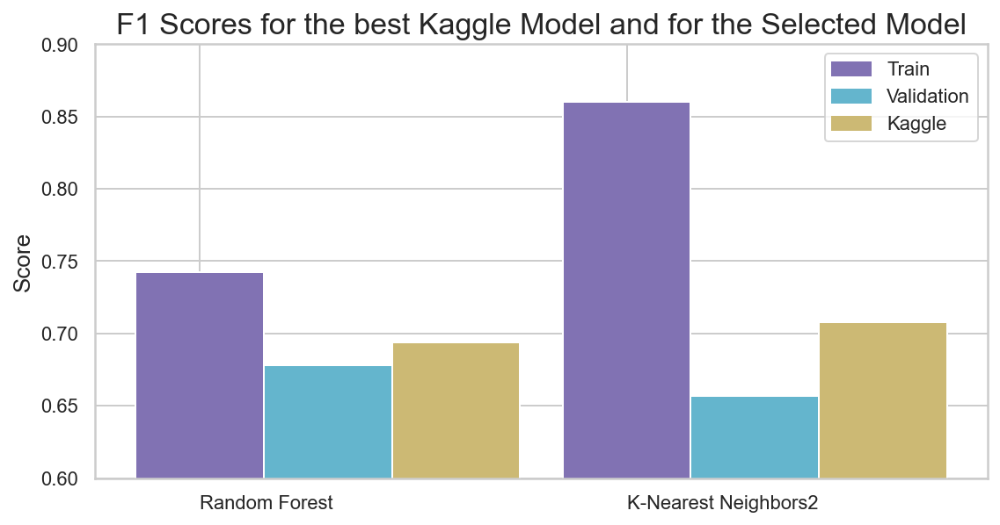

In [270]:
sns.set(style="whitegrid")

models_names = ['Random Forest', 'K-Nearest Neighbors2']
scores_train = [0.742340532395781, 0.860150848522941]
scores_validation = [0.677824267782426, 0.656976744186046]
scores_kaggle = [0.69364, 0.70754]


figure = plt.figure(figsize=(20,10))
ax = figure.add_subplot(222)

ax.bar(np.arange(0,len(models_names)) , scores_train, width=0.3, color='m', align='center')
ax.bar(np.arange(0,len(models_names)) + 0.3, scores_validation, width=0.3, color='c', align='center')
ax.bar(np.arange(0,len(models_names)) + 0.6, scores_kaggle, width=0.3, color='y', align='center')

ax.set_xticks(np.arange(len(models_names)))
ax.set_xticklabels(models_names, ha='left')

plt.title('F1 Scores for the best Kaggle Model and for the Selected Model', fontdict = {'fontsize': 17})
plt.ylabel('Score', fontdict = {'fontsize': 13})
plt.ylim(0.6,0.9)

colors = {'Train':'m', 'Validation':'c', 'Kaggle':'y'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels)
plt.savefig(r'Figures\scores_final.png', dpi=200)

plt.show()